# Exploring The Different Aspects of Data Professionals

## Introduction

>Within the context of modern business, data has proven to be pivotal in many decision-making processes. As technology and connectivity have advanced our critical thinking, a need to manage, analyze and process the driver of this advancement has surged. As such, data has become the main focal point for many industries worldwide, giving rise to high demand for expertise within the field. This study aims to explore the various job roles within the field of data by analyzing a survey conducted by Kaggle. Throughout the rich data set, stemming from 20,036 surveyees, we will examine various input categories, such as “formal educational level” and “years of programming experience” to better understand the various aspects of each job role. The aim of this study is to develop an analytical view of the data field job market to inform insights. The first half of the study will be dedicated to analyzing job roles within the context of demographic factors such as education level, age, and gender. While the second half will be committed to understanding the relationship between job roles and programming factors such as years of programming experience, used visualization tools, and used programming languages.

In [1]:
#Imported Libraries
import pandas as pd
import numpy as np
import matplotlib
import matplotlib.pyplot as plt
import matplotlib.style as style
import matplotlib.patches as mpatches
from matplotlib.patches import Rectangle
import matplotlib.gridspec as gs
from matplotlib.offsetbox import AnnotationBbox, OffsetImage
from PIL import Image
import matplotlib.image as image
import seaborn as sns
import missingno as msno
import pycountry_convert as pc
import math
import squarify
from colour import Color
import warnings

from matplotlib.ticker import FuncFormatter

import matplotlib as mpl
mpl.rcParams['figure.dpi'] = 300

pd.set_option("display.max_columns", None)
pd.set_option("display.max_rows", None)

import warnings
warnings.filterwarnings("ignore")

%config InlineBackend.figure_format = 'svg'

In [2]:
#Code for Reading In The Data
survey_data = pd.read_csv('/Users/omarstinner/Data Files/Personal Project Files/kaggle_survey_2020_responses.csv')
questions = survey_data.iloc[0]
survey_data = survey_data[1:]

In [3]:
#Functions for Cleaning Data
#function to clean questions that have parts
def part_cleaner(question, q_dict):
    q_cols = [col for col in survey_data.columns if question in col]
    survey_data.loc[:, q_cols[0] : q_cols[-1]] = survey_data.loc[:, q_cols[0] : q_cols[-1]].replace(q_dict)

#function to display the unique values in a collection of columns  
def value_across(question):
    q_cols = [col for col in survey_data.columns if question in col]
    df = survey_data.loc[:, q_cols[0] : q_cols[-1]]
    return df.mode().T.squeeze()

In [4]:
#Creating a "Continent" Column
#create a "Continent" column to get more of a macro look at regions
countries_change = {"Iran, Islamic Republic of..." : "Iran", "Republic of Korea" : "South Korea"}
survey_data["Q3"] = survey_data["Q3"].replace(countries_change)

def country_to_continent(country):
    if country == "Other":
        return country
    else:
        country_code = pc.country_name_to_country_alpha2(country, cn_name_format = "default")
        continent_name = pc.country_alpha2_to_continent_code(country_code)
        return continent_name
        
        
survey_data["Continent"] = survey_data["Q3"].apply(country_to_continent)

In [5]:
#Data Cleaning
#data preperation (cleaning columns that I intend on exploring)

#Q3
q3_dict = {"United States of America" : "USA", "Republic of Korea" : "South Korea", "United Arab Emirates" : "UAE", "United Kingdom of Great Britain and Northern Ireland" : "UK"}
survey_data["Q3"] = survey_data["Q3"].replace(q3_dict)

#Q2
q2_dict = {"Prefer not to say" : "other", "Prefer to self-describe" : "other", "Nonbinary" : "other"}
survey_data["Q2"] = survey_data["Q2"].replace(q2_dict)

#Q4
q4_dict = {"Some college/university study without earning a bachelor’s degree" : " Some college - no degree"}
survey_data["Q4"] = survey_data["Q4"].replace(q4_dict)

#Q5
q5_dict = {"DBA/Database Engineer" : "Database Engineer"}
survey_data["Q5"] = survey_data["Q5"].replace(q5_dict)

#Q6
q6_dict = {"I have never written code" : "never written code"}
survey_data["Q6"] = survey_data["Q6"].str.replace(" years", "").replace(q6_dict)

#Q9
q9_dict = {k : v for k,v in zip(value_across("Q9"), value_across("Q9").str.split("(",).str[0].str.split("/").str[0].str.strip())}
part_cleaner("Q9", q9_dict)

#Q14
q14_dict = {k : v for k,v in zip(value_across("Q14"), value_across("Q14").str.split("/",).str[0].str.strip())}
part_cleaner("Q14", q14_dict)

#Q15
survey_data["Q15"] = survey_data["Q15"].str.replace(" years", "").str.replace(" or more", "+").str.replace("Under 1 year", "<1")

#Q17
q17_dict = {k : v for k,v in zip(value_across("Q17"), value_across("Q17").str.split("(",).str[0].str.strip())}
part_cleaner("Q17", q17_dict)

#Q20
survey_data["Q20"] = survey_data["Q20"].str.replace(" employees", "").str.replace(" or more", "+").str.replace(",", "")

#Q23
q23_replace = ["Analyze Data", "Build Data Infrastructure", "Build Prototypes", "Build ML Services", "Experiment to Improve ML", "Research", "None", "Other"]
q23_dict = {}
for before, after in zip(value_across("Q23"), q23_replace):
    q23_dict[before] = after
    
part_cleaner("Q23", q23_dict)

#Q24
survey_data["Q24"] = survey_data["Q24"].str.replace("$", "").str.replace("> ", "").str.replace(",", "")
survey_data["Q24"] = survey_data["Q24"].replace("500000", "500000-500000")

#Q37
q37_dict = {k : v for k,v in zip(value_across("Q37"), value_across("Q37").str.split("(",).str[0].str.strip())}
part_cleaner("Q37", q37_dict)

#Q38
survey_data["Q38"] = survey_data["Q38"].str.split("(", ).str[0].str.strip()

#39
q39_dict = {k : v for k,v in zip(value_across("Q39"), value_across("Q39").str.split("(",).str[0].str.strip())}
part_cleaner("Q39", q39_dict)

In [6]:
#Functions Used Throughout The Project
def cosmetics(ax, axis):
    ax.set_facecolor("mediumseagreen")
    
    for location in ["top", "bottom", "left", "right"]:
        ax.spines[location].set_visible(False)
    
    ax.tick_params(axis=u'both', which=u'both',length=0)
    
    if axis == "both":
        ax.set_yticks([])
        ax.set_xticks([])
    if axis == "x":
        ax.set_xticks([])
    if axis == "y":
        ax.set_yticks([])
        
def finder(x):
    space_index = []
    for index,char in enumerate(x):
        if char == " ":
            space_index.append(index)

    if len(space_index) >= 5:
        x = x[:space_index[2]] + "\n" + x[space_index[2]+1:]

    return x

def income_level(country):
    if country in high_income:
        return "HI"
    elif country in upper_middle_income:
        return "UMI"
    elif country in lower_middle_income:
        return "LMI"
    elif country in low_income:
        return "LI"
    elif country in other_income:
        return "Other"


## Part 1: Demographic Factors

### Roles vs. Gender

In [7]:
#Figure 1 Subplot Code
def age_gender(ax, role):
    
    survey_data_copy = survey_data.copy()
    
    #Preparing Data
    role_data = survey_data_copy[survey_data_copy["Q5"] == role]

    male = role_data[role_data["Q2"] == "Man"]
    female = role_data[role_data["Q2"] == "Woman"]
    
    #Finding Frequencies Of Age Ranges for men and women
    male_age_counts = male["Q1"].value_counts()
    female_age_counts = female["Q1"].value_counts()

    combined = pd.merge(left = pd.DataFrame(male_age_counts), right = pd.DataFrame(female_age_counts), left_index = True, right_index = True)
    combined.columns = ["male", "female"]
    combined["sum"] = combined.sum(axis = 1) 
    combined["male_perc"] = round((combined["male"] / combined["sum"]) * 100, 2)
    combined["female_perc"] = round((combined["female"] / combined["sum"]) * 100, 2)
    
    #Graphing Data
    ax.barh(combined.index, combined["male_perc"], color = "tab:blue")
    ax.barh(combined.index, -combined["female_perc"], color = "tab:red")

    ax.set_xlim([-120, 150])
    
    #Adding Total Percentages for Male and Female
    ax.text(x = 75, y = ax.get_ylim()[1] + (ax.get_ylim()[1]*0.04), s = str(round(combined["male_perc"].sum()/combined.shape[0])) + "%", color = "tab:blue", weight = "bold", ha = "center", size = 8)
    ax.text(x = -60, y = ax.get_ylim()[1] + (ax.get_ylim()[1]*0.04), s = str(round(combined["female_perc"].sum()/combined.shape[0])) + "%", color = "tab:red", weight = "bold", ha = "center", size = 8)

    #Adding Percentages for Male and Female
    y = 0
    for index, row in combined.iterrows():
        ax.text(x = row["male_perc"] + 5, y = y , s = str(round(row["male_perc"])) + "%", color = "white", weight = "bold", size = 8, ha = "left")
        ax.text(x = -row["female_perc"] - 5, y = y , s = str(round(row["female_perc"])) + "%", color = "white", weight = "bold", size = 8, ha = "right")
        y += 1
      
    ax.set_yticklabels(combined.index, size = 8, color = "darkslategrey", weight = "bold")
    
    #Cosmetics
    cosmetics(ax, "x")
    
    if role in ["Student", "Software Engineer", "Product/Project Manager", "Machine Learning Engineer", "Data Scientist", "Data Analyst", "Business Analyst"]:
        bbax = ax.get_position()
        bbax.x0 = 0.165
        ax.set_position(bbax)
    else:
        bbax = ax.get_position()
        bbax.x0 = 0.59
        ax.set_position(bbax)
        

def title_maker_1(ax, role, perc):
    
    #Main Title and Subtitle
    ax.text(x = 0 , y = 0.5 , s = "Gender Frequencies By Age Group In\nthe {} Role".format(role) , color = "white", size = 10, fontfamily = "serif", weight = "bold")
    
    if role != "DB Eng.":    
        ax.text(x = 0 , y = 0.2 , s = "Males Outweigh Females by {}% on Aggregate".format(perc) , color = "white", size = 9, fontfamily = "serif")
    else:
        ax.text(x = 0 , y = 0.2 , s = "Females Outweigh Males by 60% for The 18-21 Age Group".format(perc) , color = "white", size = 8.5, fontfamily = "serif")

    ax.axhline(y = 0, xmin = 0, xmax = 1, c = "white", linewidth = 3, alpha = 0.5)
    
    #Cosmetics
    cosmetics(ax, "both")

>#### Figure 1 Description
>This figure depicts the frequency of males and females in each age interval for each role. Surveyees who responded with “Prefer not to say”, “Prefer to self-describe”, and “Nonbinary” were not included in this graph. 

>The **aim** of this figure is to highlight the gender imbalances between males and females across each age interval in each role.

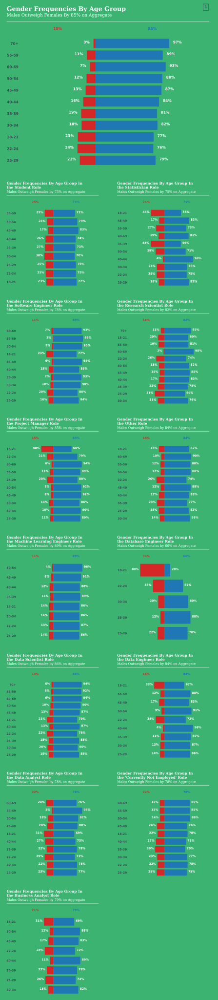

In [8]:
#Figure 1 Code
fig1 = plt.figure(figsize = (10, 50))
gs1 = gs.GridSpec(nrows = 16, ncols = 2, height_ratios = ([0.5,5,0.5,3,0.5,3,0.5,3,0.5,3,0.5,3,0.5,3,0.5,3]))

#ax1 - Title: Graph Main
ax1 = plt.subplot(gs1[0, :2])


#Border Exapansion
ax1.text(x = -0.02 , y = 0.6 , s = "Gender Distribution For Each Age Group Across All Role", color = "mediumseagreen", size = 15, fontfamily = "serif", weight = "bold")
ax1.text(x = 0.18 , y = 1.1 , s = "Gender Distribution For Each Age Group Across All Role", color = "mediumseagreen", size = 15, fontfamily = "serif", weight = "bold")


#Main Title and Subtitle
ax1.text(x = 0 , y = 0.8 , s = "Gender Frequencies By Age Group", color = "white", size = 17, fontfamily = "serif", weight = "bold")
ax1.text(x = 0 , y = 0.4 , s = "Males Outweigh Females By 85% on Aggregate", color = "white", size = 12, fontfamily = "serif")
ax1.axhline(y = 0, xmin = 0, xmax = 1, c = "white", linewidth = 3, alpha = 0.5)

#Adding Figure Number
ax1.text(x = 0.99, y = 1, s = "1", transform = ax1.transAxes, color = "darkslategrey", ha = "right", weight = "bold", bbox = dict(fc = "none", ec = "darkslategrey"))    

#Cosmetics
cosmetics(ax1, "both")

    
#ax2  Graph: Main
ax2 = plt.subplot(gs1[1, :2])

survey_data_copy = survey_data.copy()

#Preparing Data For Graphing
male = survey_data_copy[survey_data_copy["Q2"] == "Man"]
female = survey_data_copy[survey_data_copy["Q2"] == "Woman"]

male_age_counts = male["Q1"].value_counts()
female_age_counts = female["Q1"].value_counts()

combined = pd.merge(left = pd.DataFrame(male_age_counts), right = pd.DataFrame(female_age_counts), left_index = True, right_index = True)
combined.columns = ["male", "female"]
combined["sum"] = combined.sum(axis = 1)
combined["male_perc"] = round((combined["male"] / combined["sum"]) * 100, 2)
combined["female_perc"] = round((combined["female"] / combined["sum"]) * 100, 2)

#Graphing Data
ax2.barh(combined.index, combined["male_perc"], color = "tab:blue")
ax2.barh(combined.index, -combined["female_perc"], color = "tab:red")

ax2.set_xlim([-100, 150])
ax2.set_yticklabels(combined.index, size = 10, color = "darkslategrey", weight = "bold")

#Adding Percentages For Male and Female
y = 0
for index, row in combined.iterrows():
    ax2.text(x = row["male_perc"] + 5, y = y , s = str(round(row["male_perc"])) + "%", color = "white", weight = "bold", size = 10, ha = "left")
    ax2.text(x = -row["female_perc"] - 5, y = y , s = str(round(row["female_perc"])) + "%", color = "white", weight = "bold", size = 10, ha = "right")
    y += 1

#Adding Total Percentages For Male and Female
ax2.text(x = 75, y = ax2.get_ylim()[1] + (ax2.get_ylim()[1]*0.02), s = str(round(combined["male_perc"].sum()/combined.shape[0])) + "%", color = "tab:blue", weight = "bold", ha = "center", size = 10)
ax2.text(x = -50, y = ax2.get_ylim()[1] + (ax2.get_ylim()[1]*0.02), s = str(round(combined["female_perc"].sum()/combined.shape[0])) + "%", color = "tab:red", weight = "bold", ha = "center", size = 10)

#Cosmetics
cosmetics(ax2, "x")

bbax = ax2.get_position()
bbax.x0 = 0.175
ax2.set_position(bbax)

#ax3 - Title: Student
ax3 = plt.subplot(gs1[2, 0])
title_maker_1(ax3, "Student", "75")

#ax4 - Title: Statistician
ax4 = plt.subplot(gs1[2, 1])
title_maker_1(ax4, "Statistician", "75")

#ax5 - Graph: Student
ax5 = plt.subplot(gs1[3, 0])
age_gender(ax5, "Student")

#ax6 - Graph: Statistician
ax6 = plt.subplot(gs1[3, 1])
age_gender(ax6, "Statistician")

#ax7 - Title: Software Engineer
ax7 = plt.subplot(gs1[4, 0])
title_maker_1(ax7, "Software Engineer", "78")

#ax8 - Title: Research Scientist
ax8 = plt.subplot(gs1[4, 1])
title_maker_1(ax8, "Research Scientist", "82")

#ax9 - Graph: Software Engineer
ax9 = plt.subplot(gs1[5, 0])
age_gender(ax9, "Software Engineer")

#ax10 - Graph: Research Scientist
ax10 = plt.subplot(gs1[5, 1])
age_gender(ax10, "Research Scientist")

#ax11 - Title: Product/Project Manager
ax11 = plt.subplot(gs1[6, 0])
title_maker_1(ax11, "Project Manager", "85")

#ax12 - Title: Other
ax12 = plt.subplot(gs1[6, 1])
title_maker_1(ax12, "Other", "84")

#ax13 - Graph: Prodcut/Project Manager
ax13 = plt.subplot(gs1[7, 0])
age_gender(ax13, "Product/Project Manager")

#ax14 - Graph: Other
ax14 = plt.subplot(gs1[7, 1])
age_gender(ax14, "Other")

#ax15 - Title: Machine Learning Engineer
ax15 = plt.subplot(gs1[8, 0])
title_maker_1(ax15, "Machine Learning Engineer", "89")

#ax16 - Title: Database Engineer
ax16 = plt.subplot(gs1[8, 1])
title_maker_1(ax16, "Database Engineer", "66")

#ax17 - Graph: Machine Learning Engineer
ax17 = plt.subplot(gs1[9, 0])
age_gender(ax17, "Machine Learning Engineer")

#ax18 - Graph: Database Engineer
ax18 = plt.subplot(gs1[9, 1])
age_gender(ax18, "Database Engineer")

#ax19 - Title: Data Scientist
ax19 = plt.subplot(gs1[10, 0])
title_maker_1(ax19, "Data Scientist", "86")

#ax20 - Title: Data Engineer
ax20 = plt.subplot(gs1[10, 1])
title_maker_1(ax20, "Data Engineer", "84")

#ax21 - Graph: Data Scientist
ax21 = plt.subplot(gs1[11, 0])
age_gender(ax21, "Data Scientist")

#ax22 - Graph: Data Engineer
ax22 = plt.subplot(gs1[11, 1])
age_gender(ax22, "Data Engineer")

#ax23 - Title: Data Analyst
ax23 = plt.subplot(gs1[12, 0])
title_maker_1(ax23, "Data Analyst", "78")

#ax24 - Title: Currently not employed
ax24 = plt.subplot(gs1[12, 1])
title_maker_1(ax24, "'Currently Not Employed'", "78")

#ax25 - Graph: Data Analyst
ax25 = plt.subplot(gs1[13, 0])
age_gender(ax25, "Data Analyst")

#ax26 - Graph: Currently not employed
ax26 = plt.subplot(gs1[13, 1])
age_gender(ax26, "Currently not employed")

#ax27 - Title: Business Analyst
ax27 = plt.subplot(gs1[14, 0])
title_maker_1(ax27, "Business Analyst", "79")


#ax28 - Title: Blank
ax28 = plt.subplot(gs1[14, 1])

#Cosmetics
cosmetics(ax28, "both")

#ax29 - Graph: Business Analyst
ax29 = plt.subplot(gs1[15, 0])
age_gender(ax29, "Business Analyst")

#ax30 - Graph: Blank
ax30 = plt.subplot(gs1[15, 1])

#Cosmetics
cosmetics(ax30, "both")

fig1.set_facecolor("mediumseagreen")

plt.show()

>#### Figure 1 Analysis
>- Across all roles and age groups, 85% of surveyees are male with females making up the remaining 15%.
>- Staggeringly, males account for nearly 100% of the 70+ age interval.
>- Notably, the highest percentage of females within an age bracket is 24% in the 22-24 age interval.
>- For all roles, females are underrepresented, with aggregate averages ranging from 11% to 34%.
>- Females are most under-represented in the Software Engineering Role(11%) and the Machine Learning Role(11%).
>- Females are most represented in the Database Engineering role with an aggregate average of 34%.

### Roles vs. Salary

In [9]:
#Figure 2 Subplot Code
def not_null_converter(x):
    if str(x) not in ["nan", "None"]:
        return 1
    else:
        return x

def midpoint_sal(x):
    if str(x) != "nan":
        split = x.split("-")
        midpoint = (int(split[0]) + int(split[1])) / 2
        return midpoint
    else:
        return x
        
def skill_grapher(ax, role, direc, mag):
    
    #Preparing Data
    survey_data_copy = survey_data.copy()
    survey_data_copy = survey_data_copy.loc[:, ["Q24", "Q5", "Q4", "Q6", "Q7_Part_1", "Q7_Part_2", "Q7_Part_3", "Q7_Part_4", "Q7_Part_5", "Q7_Part_6", "Q7_Part_7", "Q7_Part_8", "Q7_Part_9", "Q7_Part_10", "Q7_Part_11", "Q7_Part_12", "Q7_OTHER"]]
    
    #Giving 1 point per language known
    for column in survey_data_copy.loc[:, "Q7_Part_1":]:
        survey_data_copy[column] = survey_data_copy[column].apply(not_null_converter)
    
    #Scoring Criteria for Years of Experience
    yoe_dict = {"< 1" : 1, "1-2" : 2, "3-5" : 3, "5-10" : 4, "10-20" : 5, "20+" : 6}
    
    #Scoring Criteria for Education Level
    edu_dict = {"I prefer not to answer" : 0, "No formal education past high school" : 1," Some college - no degree" : 2, "Bachelor’s degree" : 3, "Professional degree" : 4, "Master’s degree" : 5, "Doctoral degree" : 6}
    
    #Creating a Skill Sum column that ads up all the scores
    survey_data_copy["Q6"] = survey_data_copy["Q6"].map(yoe_dict)
    survey_data_copy["Q4"] = survey_data_copy["Q4"].map(edu_dict)
    survey_data_copy["skill_sum"] = survey_data_copy.loc[:, "Q4":].sum(axis = 1)
    
    #Isolating the Role data
    role_data = survey_data_copy[survey_data_copy["Q5"] == role]
    
    #Find the midpoint salary between the ranges
    role_data["Q24"] = role_data["Q24"].apply(midpoint_sal)
    
    #Creating a pivot table, where we get the average salary for each skill score
    role_data_pivot_table = role_data.pivot_table("Q24", "skill_sum", aggfunc = np.mean)
    role_data_pivot_table = role_data_pivot_table.sort_index()
    role_data_pivot_table.index = role_data_pivot_table.index.map(lambda x : int(x))
    role_data_pivot_table["index"] = role_data_pivot_table.index

    
    #Graphing Data
    ax.plot(role_data_pivot_table.index, role_data_pivot_table["Q24"], marker = "o",markersize = 11, linewidth = 2, color = "darkslategrey")
    
    #Preparing Data for Connection Lines
    min_mid_max = role_data_pivot_table.iloc[[0, int(len(role_data_pivot_table)/2) - 1, -1], :]
    min_mid_max["direc"] = direc
    min_mid_max["mag"] = mag
    
    #Adding Skill Score to Graph
    for index, row in role_data_pivot_table.iterrows():
        ax.text(x = row["index"], y = row["Q24"], s = str(int(row["index"])), color = "white", size = 6, ha = "center", va = "center", weight = "bold")
    
    #Adding Connection Lines
    for index, row in min_mid_max.iterrows():
        
        if row["direc"] == "up":
            ax.vlines(x = row["index"], ymin = row["Q24"], ymax = row["mag"], color = "darkslategrey", linewidth = 2, ls = "--")
            ax.text(x = row["index"], y = row["mag"], s = str(round(int(row["Q24"])/1000, 2)) + "K", color = "white", weight = "bold", size = 8, ha = "center", bbox = dict(facecolor ='mediumseagreen', edgecolor ='darkslategrey', linewidth = 1.7))
            
        if row["direc"] == "left":
            ax.axhline(y = row["Q24"], xmin = row["mag"] , xmax = 0.95  , c = "darkslategrey", linewidth = 2, ls = "--")
            ax.text(x = row["index"] * 0.66, y = row["Q24"], s = str(round(int(row["Q24"])/1000, 2)) + "K", color = "white", weight = "bold", size = 8, ha = "right", va = "center", bbox = dict(facecolor ='mediumseagreen', edgecolor ='darkslategrey', linewidth = 1.7))
            
        if row["direc"] == "down":
            ax.vlines(x = row["index"] , ymin = row["mag"] , ymax = row["Q24"] , color = "darkslategrey", linewidth = 2, ls = "--")
            ax.text(x = row["index"], y = row["mag"], s = str(round(int(row["Q24"])/1000, 2)) + "K", color = "white", weight = "bold", size = 8, ha = "center", bbox = dict(facecolor ='mediumseagreen', edgecolor ='darkslategrey', linewidth = 1.7))
 

    #Cosmetics
    cosmetics(ax, "both")

    if role in ["Statistician", "Research Scientist", "Other", "Database Engineer", "Data Engineer", "Business Analyst"]:
        bbax = ax.get_position()
        bbax.x0 = 0.14
        bbax.x1 = 0.46
        ax.set_position(bbax)
    else:
        bbax = ax.get_position()
        bbax.x0 = 0.56
        bbax.x1 = 0.88
        ax.set_position(bbax)


def title_maker_2(ax, role, skill_score):
    #Main Title and Subtitle
    ax.text(x = 0 , y = 0.5, s = "Skill Score vs. Average Salary (USD) In The\n{} Role".format(role), weight = "bold", color = "white", fontfamily = "serif", size = 10)
    ax.text(x = 0 , y = 0.2, s = "Surveyees With a Skill Score of {} Earn The Most".format(skill_score), color = "white", fontfamily = "serif", size = 9)
    ax.axhline(y = 0, xmin = 0, xmax = 1, c = "white", linewidth = 3, alpha = 0.5)
    
    #Cosmetics
    cosmetics(ax, "both")


>#### Figure 2 Description

>This figure depicts the average salaries for the lowest, midway, and highest skill scores in each role. A surveyee’s skill score is based on 3 criteria: his/her level of formal education, years of programming experience, and number of programming languages used.

>Level of formal education scoring criteria:
0 - I prefer not to answer, 1 - No formal Education past High School, 3 - Bachelor’s Degree, 4 - Master’s Degree, 5 - Professional Degree, 6 - Doctoral Degree

>Years of programming experience:
1 - “< 1 year”, 2 - “1 - 2 years”, 3 - “3 - 5 years”, 4 - “5 - 10 years”, 6 - “20+ years”

>Number of programming languages used:
Each surveyee was given 1 point for each programming language used.

>A surveyee’s skill score was calculated by summing the scores they received for each criterion.

>The **aim** of this figure is to determine whether being more skillful corresponds to earning a higher salary.

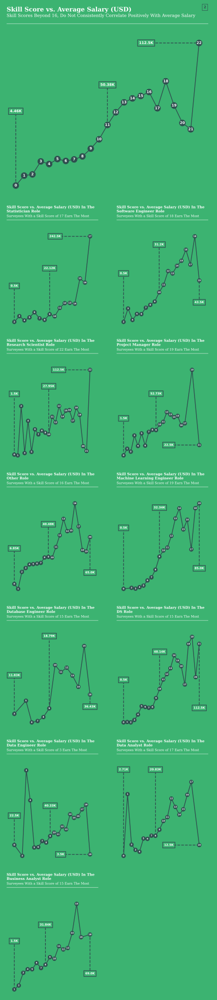

In [10]:
#Figure 2 Code
fig2 = plt.figure(figsize = (10, 50))
gs2 = gs.GridSpec(nrows = 14, ncols = 2, height_ratios = ([0.5,5,0.5,3,0.5,3,0.5,3,0.5,3,0.5,3,0.5,3]))

#ax1 - Title: Graph Main
ax1 = plt.subplot(gs2[0, :2])

#Border Expansion
ax1.text(x = -0.02 , y = 0.6 , s = "Gender Distribution For Each Age Group Across All Role", color = "mediumseagreen", size = 15, fontfamily = "serif", weight = "bold")
ax1.text(x = 0.18 , y = 1.1 , s = "Gender Distribution For Each Age Group Across All Role", color = "mediumseagreen", size = 15, fontfamily = "serif", weight = "bold")
    
#Main Title and Subtitle
ax1.text(x = 0 , y = 0.8, s = "Skill Score vs. Average Salary (USD)", weight = "bold", color = "white", fontfamily = "serif", size = 17)
ax1.text(x = 0 , y = 0.45, s = "Skill Scores Beyond 16, Do Not Consistently Correlate Positively With Average Salary", color = "white", fontfamily = "serif", size = 12)
ax1.axhline(y = 0, xmin = 0, xmax = 1, c = "white", linewidth = 3, alpha = 0.5) 

#Adding Figure Number
ax1.text(x = 0.99, y = 1, s = "2", transform = ax1.transAxes, color = "darkslategrey", ha = "right", weight = "bold", bbox = dict(fc = "none", ec = "darkslategrey"))    

#Cosmetics
cosmetics(ax1, "both")

#ax2  Graph: Main
ax2 = plt.subplot(gs2[1, :2])

#Preparing The Data
survey_data_copy = survey_data.copy()
survey_data_copy = survey_data_copy.loc[:, ["Q24", "Q5", "Q4", "Q6", "Q7_Part_1", "Q7_Part_2", "Q7_Part_3", "Q7_Part_4", "Q7_Part_5", "Q7_Part_6", "Q7_Part_7", "Q7_Part_8", "Q7_Part_9", "Q7_Part_10", "Q7_Part_11", "Q7_Part_12", "Q7_OTHER"]]

#Giving 1 point per language known
for column in survey_data_copy.loc[:, "Q7_Part_1":]:
    survey_data_copy[column] = survey_data_copy[column].apply(not_null_converter)

#Scoring Criteria for Years of Experience
yoe_dict = {"< 1" : 1, "1-2" : 2, "3-5" : 3, "5-10" : 4, "10-20" : 5, "20+" : 6}

#Scoring Criteria for Education Level
edu_dict = {"I prefer not to answer" : 0, "No formal education past high school" : 1," Some college - no degree" : 2, "Bachelor’s degree" : 3, "Professional degree" : 4, "Master’s degree" : 5, "Doctoral degree" : 6}

#Creating a Skill Sum column that ads up all the scores
survey_data_copy["Q6"] = survey_data_copy["Q6"].map(yoe_dict)
survey_data_copy["Q4"] = survey_data_copy["Q4"].map(edu_dict)
survey_data_copy["skill_sum"] = survey_data_copy.loc[:, "Q4":].sum(axis = 1)


main_graph_data = survey_data_copy.copy()
main_graph_data["midpoint_sal"] = main_graph_data["Q24"]
main_graph_data["midpoint_sal"] = main_graph_data["midpoint_sal"].apply(midpoint_sal)
main_graph_data_pivot_table = main_graph_data.pivot_table("midpoint_sal", "skill_sum", aggfunc = np.mean)
main_graph_data_pivot_table = main_graph_data_pivot_table.sort_index()
main_graph_data_pivot_table.index = main_graph_data_pivot_table.index.map(lambda x : int(x))
main_graph_data_pivot_table["index"] = main_graph_data_pivot_table.index

#Graphing the Data
ax2.plot(main_graph_data_pivot_table.index, main_graph_data_pivot_table["midpoint_sal"], marker = "o",markersize = 17, linewidth = 2, color = "darkslategrey")

#Adding The Skill Scores
for index, row in main_graph_data_pivot_table.iterrows():
    ax2.text(x = row["index"], y = row["midpoint_sal"], s = str(int(row["index"])), color = "white", size = 10, ha = "center", va = "center", weight = "bold")
    
#Adding the Connection Lines
ax2.vlines(x = main_graph_data_pivot_table.iloc[0,1], ymin = main_graph_data_pivot_table.iloc[0,0], ymax = 60000, color = "darkslategrey", linewidth = 2, ls = "--")
ax2.vlines(x = main_graph_data_pivot_table.iloc[11,1] , ymin = main_graph_data_pivot_table.iloc[11,0] , ymax = 80000 , color = "darkslategrey", linewidth = 2, ls = "--")
ax2.axhline(y = main_graph_data_pivot_table.iloc[22,0], xmin = 0.7 , xmax = 0.95  , c = "darkslategrey", linewidth = 2, ls = "--")

#Adding the Min, Mid, Max
ax2.text(x = main_graph_data_pivot_table.iloc[0,1], y = 60000, s = str(round(int(main_graph_data_pivot_table.iloc[0,0])/1000, 2)) + "K", color = "white", weight = "bold", size = 10, ha = "center", bbox = dict(facecolor ='mediumseagreen', edgecolor ='darkslategrey', linewidth = 1.7))
ax2.text(x = main_graph_data_pivot_table.iloc[11,1], y = 80000, s = str(round(int(main_graph_data_pivot_table.iloc[11,0])/1000, 2)) + "K", color = "white", weight = "bold", size = 10, ha = "center", bbox = dict(facecolor ='mediumseagreen', edgecolor ='darkslategrey', linewidth = 1.7))
ax2.text(x = main_graph_data_pivot_table.iloc[22,1] * 0.75, y = main_graph_data_pivot_table.iloc[22,0], s = str(round(int(main_graph_data_pivot_table.iloc[22,0])/1000, 2)) + "K", color = "white", weight = "bold", size = 10, ha = "right", va = "center", bbox = dict(facecolor ='mediumseagreen', edgecolor ='darkslategrey', linewidth = 1.7))
 
#Cosmetics
cosmetics(ax2, "both")

    
#ax3 - Title: Statistician
ax3 = plt.subplot(gs2[2, 0])
title_maker_2(ax3, "Statistician", "17")

#ax4 - Title: Software Engineer
ax4 = plt.subplot(gs2[2, 1])
title_maker_2(ax4, "Software Engineer", "18")

#ax5 - Graph: Statistician
ax5 = plt.subplot(gs2[3, 0])
skill_grapher(ax5, "Statistician", ["up", "up", "left"], [100000, 150000, 0.6])


#ax6 - Graph: Software Engineer
ax6 = plt.subplot(gs2[3, 1])
skill_grapher(ax6, "Software Engineer", ["up", "up", "down"], [50000, 80000, 20000])

#ax7 - Title: Research Scientist
ax7 = plt.subplot(gs2[4, 0])
title_maker_2(ax7, "Research Scientist", "22")

#ax8 - Title: Product/Project Manager
ax8 = plt.subplot(gs2[4, 1])
title_maker_2(ax8, "Project Manager", "19")

#ax9 - Graph: Research Scientist
ax9 = plt.subplot(gs2[5, 0])
skill_grapher(ax9, "Research Scientist", ["up", "up", "left"], [80000, 90000, 0.6])

#ax10 - Graph: Product/Project Manager
ax10 = plt.subplot(gs2[5, 1])
skill_grapher(ax10, "Product/Project Manager", ["up", "up", "left"], [75000, 125000, 0.6])

#ax11 - Title: Other
ax11 = plt.subplot(gs2[6, 0])
title_maker_2(ax11, "Other", "16")

#ax12 - Title: Machine Learning Engineer
ax12 = plt.subplot(gs2[6, 1])
title_maker_2(ax12, "Machine Learning Engineer", "19")

#ax13 - Graph: Other
ax13 = plt.subplot(gs2[7, 0])
skill_grapher(ax13, "Other", ["up", "up", "down"], [50000, 80000, 20000])

#ax14 - Graph: Machine Learning Engineer
ax14 = plt.subplot(gs2[7, 1])
skill_grapher(ax14, "Machine Learning Engineer", ["up", "up", "down"], [60000, 80000, 20000])

#ax15 - Title: Database Engineer
ax15 = plt.subplot(gs2[8, 0])
title_maker_2(ax15, "Database Engineer", "15")

#ax16 - Title: Data Scientist
ax16 = plt.subplot(gs2[8, 1])
title_maker_2(ax16, "DS", "15")

#ax17 - Graph: Database Engineer
ax17 = plt.subplot(gs2[9, 0])
skill_grapher(ax17, "Database Engineer", ["up", "up", "down"], [60000, 110000, 20000])

#ax18 - Graph: Data Scientist
ax18 = plt.subplot(gs2[9, 1])
skill_grapher(ax18, "Data Scientist", ["up", "up", "down"], [60000, 100000, 20000])

#ax19 - Title: Data Engineer
ax19 = plt.subplot(gs2[10, 0])
title_maker_2(ax19, "Data Engineer", "3")

#ax20 - Title: Data Analyst
ax20 = plt.subplot(gs2[10, 1])
title_maker_2(ax20, "Data Analyst", "17")

#ax21 - Graph: Data Engineer
ax21 = plt.subplot(gs2[11, 0])
skill_grapher(ax21, "Data Engineer", ["up", "up", "left"], [80000, 100000, 0.6])

#ax22 - Graph: Data Analyst
ax22 = plt.subplot(gs2[11, 1])
skill_grapher(ax22, "Data Analyst", ["up", "up", "left"], [80000, 80000, 0.6])

#ax23 - Title: Business Analyst
ax23 = plt.subplot(gs2[12, 0])
title_maker_2(ax23, "Business Analyst", "15")

#ax24 - Title: Blank
ax24 = plt.subplot(gs2[12, 1])

#Cosmetics
cosmetics(ax24, "both")


#ax25 - Graph: Business Analyst
ax25 = plt.subplot(gs2[13, 0])
skill_grapher(ax25, "Business Analyst", ["up", "up", "down"], [60000, 80000, 20000])


#ax26 - Graph: Blank
ax26 = plt.subplot(gs2[13, 1])

ax26.text(x = 0, y = -0.03, s = "extender", color = "mediumseagreen", size = 12)

#Cosmetics
cosmetics(ax26, "both")

fig2.set_facecolor("mediumseagreen")

plt.show()

>#### Figure 2 Analysis
>- For statisticians, the two largest salary increases are found in skills scores from 16 to 17 (USD 120K) and from 14 to 15 (USD 70K).
>- Statisticians represent the highest earners among the data set, with a salary of USD 242K at a skill score of 17.
>- Surprisingly, for Software Engineers, skill scores of 3 and 7 are equal to each other in terms of salary compensation (USD 18K). Furthermore, beyond a skill score of 16, the correlation between skill score and compensation fluctuates for Software Engineers.
>- Research Scientists, in contrast to the broader data set, present a high inverse correlation between skill score and salary, with a skill score of 2 equating to USD 70K
>- Project Managers exhibit the largest decrease in salary between two skill scores, with a sharp decrease of USD 150K between skill scores 19 to 21.
>- Data Engineers exhibit the largest increase in salary between two skill scores, with a stark increase of USD 175K  between skill scores 2 and 3.
>- The lowest salary is shared among, Statisticians, Software Engineers, and Machine Learning Engineers, with a salary of 0.5K at a skill score of 2.

In [11]:
#Figure 3 Subplot Code
def midpoint_sal(x):
    if str(x) != "nan":
        split = x.split("-")
        midpoint = (int(split[0]) + int(split[1])) / 2
        return midpoint
    else:
        return x

def compensation_dif_graph(ax, role):
    
    survey_data_copy = survey_data.copy()
    
    #Preparing The Data
    role_data = survey_data_copy[survey_data_copy["Q5"] == role]
    role_data["midpoint_sal"] = role_data["Q24"].apply(midpoint_sal)

    #Creating pivot table showing the average salary in each continent for the role 
    cont_avg_salary_role = role_data.pivot_table("midpoint_sal", "Continent", aggfunc = np.mean)
    cont_avg_salary_role = cont_avg_salary_role.sort_values("midpoint_sal").reset_index()
    
    #Preparing Table Showing the percentage increase from Africa(Country with the Lowest Average Salary)
    table = cont_avg_salary_role.copy()
    table["midpoint_sal"] = table["midpoint_sal"].apply(lambda x : str(round((((x - table.iloc[0,1])/table.iloc[0,1]) * 100))) + "%")
    table = table.replace("0%", "-")
    table = table.T
    table.columns = table.iloc[0]
    table = table.drop(index = "Continent")
    table = table.reset_index().iloc[:, 1:]
    
    
    #Converting Table to Text for Graphing
    cell_text = table.values.tolist()
    cell_text.append(cont_avg_salary_role["midpoint_sal"].apply(lambda x : "{:,}".format(int(x))).values.tolist())

    #Prepaing Data for Plotting Lines between Bars
    lines = cont_avg_salary_role.copy()
    lines["diff"] = cell_text[0]
    next_col = lines.iloc[1:,1].values.tolist()
    next_col.append(0)
    lines["next"] = next_col
    perc_diff = lines.iloc[1:, 2].values.tolist()
    perc_diff.append("")
    lines["perc_diff"] = perc_diff
    lines = lines[["midpoint_sal", "next", "perc_diff"]].iloc[:-1]
    lines["next_perc"] = ((lines["next"] - lines["midpoint_sal"]) / lines["midpoint_sal"]) * 100
    lines["next_perc"] = lines["next_perc"].apply(lambda x : str(round(x)) + "%")

    #Graphing The Data
    ax.bar(cont_avg_salary_role.index, cont_avg_salary_role["midpoint_sal"], color = "darkslategrey", width = 0.5)

    #Plotting The Table
    the_table = ax.table(cellText=cell_text,
                          cellLoc = "center",
                          colLabels=cont_avg_salary_role["Continent"],
                          loc='bottom',
                          cellColours = [["mediumseagreen"] * 7, ["darkslategrey"] * 7],
                          colColours = ["tab:grey"] * 7,
                          bbox=[0.03,-0.23,0.94,0.2]) #x,y,w,h
    
    #Formatting the Table
    for key, cell in the_table.get_celld().items():
        cell.set_edgecolor("None")
        cell.get_text().set_color('w')
        cell.get_text().set_weight('bold')
        cell.set_linewidth(1)
        cell.set_fontsize(8)



    #Plotting Lines Between Bars
    x = 0.5
    xmin = 0.4
    xmax = 0.6
    for index,row in lines.iterrows():
        ax.vlines(x = x, ymin = row["midpoint_sal"] , ymax = row["next"], color = "darkslategrey", linewidth = 1)
        ax.hlines(y = row["midpoint_sal"], xmin = xmin , xmax = xmax, color = "darkslategrey", linewidth = 1)
        ax.hlines(y = row["next"], xmin = xmin , xmax = xmax, color = "darkslategrey", linewidth = 1)
        ax.text(x = x , y = row["next"] + 1000 , s = row["next_perc"], color = "white", size = 6, va = "bottom", ha = "center", weight = "bold")
        x += 1
        xmin += 1
        xmax += 1
  

    #Cosmetics
    cosmetics(ax, "both")

    if role in ["Statistician", "Research Scientist", "Other", "Database Engineer", "Data Engineer", "Business Analyst"]:
        bbax = ax.get_position()
        bbax.x0 = 0.116
        bbax.x1 = 0.495
        ax.set_position(bbax)
    else:
        bbax = ax.get_position()
        bbax.x0 -= 0.009
        bbax.x1 += 0.018
        ax.set_position(bbax)

    
def title_maker_3(ax, role):
    #Main Title and Subtitle
    ax.text(x = 0 , y = 0.5, s = "Average Salaries (USD) By Continent In The \n{} Role".format(role), color = "white", size = 10, fontfamily = "serif", weight = "bold")
    ax.text(x = 0 , y = 0.2, s = "The Highest Average Salaries Are In North America", color = "white", size = 9, fontfamily = "serif")
    ax.axhline(y = 0, xmin = 0, xmax = 1, c = "white", alpha = 0.5, linewidth = 3)
    
    cosmetics(ax, "both")


>#### Figure 3 Description
>The figure depicts the average salaries for each continent in each role. Surveyee’s who responded with “other” for Q3 (In which country do you currently reside?), were assigned “Other” as their designated continent. The first row of each table represents the percentage increase in salary from the base continent (the continent with the lowest average salary). The second row represents the average salary for the continent. The vertical lines show the percentage increases in salary from the preceding continent.

>The **aim** of this figure is to highlight the significant salary increase between continents.

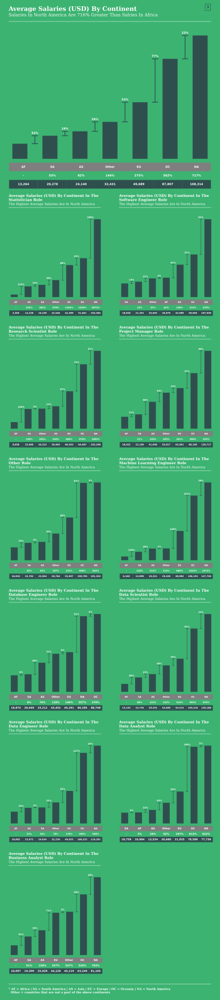

In [12]:
#Figure 3 Code
fig3 = plt.figure(figsize = (10, 50))
gs3 = gs.GridSpec(nrows = 22, ncols = 2, height_ratios = ([0.5,5,0.5,0.5,3,0.5,0.5,3,0.5,0.5,3,0.5,0.5,3,0.5,0.5,3,0.5,0.5,3, 0.5, 0.5]))

#ax1 - Title: Graph Main
ax1 = plt.subplot(gs3[0, :2])

#Border Expansion
ax1.text(x = -0.02 , y = 0.6 , s = "Gender Distribution For Each Age Group Across All Role", color = "mediumseagreen", size = 15, fontfamily = "serif", weight = "bold")
ax1.text(x = 0.18 , y = 1.1 , s = "Gender Distribution For Each Age Group Across All Role", color = "mediumseagreen", size = 15, fontfamily = "serif", weight = "bold")
    
#Main Title and Subtitle    
ax1.text(x = 0 , y = 0.8, s = "Average Salaries (USD) By Continent", weight = "bold", color = "white", fontfamily = "serif", size = 17)
ax1.text(x = 0 , y = 0.4, s = "Salaries In North America Are 716% Greater Than Salries In Africa", color = "white", fontfamily = "serif", size = 12)
ax1.axhline(y = 0, xmin = 0, xmax = 1, c = "white", linewidth = 3, alpha = 0.5) 

#Adding Figure Number
ax1.text(x = 0.99, y = 1, s = "3", transform = ax1.transAxes, color = "darkslategrey", ha = "right", weight = "bold", bbox = dict(fc = "none", ec = "darkslategrey"))    

#Cosmetics
cosmetics(ax1, "both")

#ax2  Graph: Main
ax2 = plt.subplot(gs3[1, :2], zorder = 2)

#Preparing Data
main_data = survey_data.copy()
main_data["midpoint_sal"] = main_data["Q24"].apply(midpoint_sal)


cont_avg_salary = main_data.pivot_table("midpoint_sal", "Continent", aggfunc = np.mean)
cont_avg_salary = cont_avg_salary.sort_values("midpoint_sal").reset_index()

#Preparing Data For Cell Text
table = cont_avg_salary.copy()
table["midpoint_sal"] = table["midpoint_sal"].apply(lambda x : str(round((((x - table.iloc[0,1])/table.iloc[0,1]) * 100))) + "%")
table = table.replace("0%", "-")
table = table.T
table.columns = table.iloc[0]
table = table.drop(index = "Continent")
table = table.reset_index().iloc[:, 1:]

#Converting Table to Cell Text
cell_text = table.values.tolist()
cell_text.append(cont_avg_salary["midpoint_sal"].apply(lambda x : "{:,}".format(int(x))).values.tolist())

#Preparing Data For Plotting Lines Between Bars
lines = cont_avg_salary.copy()
lines["diff"] = cell_text[0]
next_col = lines.iloc[1:,1].values.tolist()
next_col.append(0)
lines["next"] = next_col
perc_diff = lines.iloc[1:, 2].values.tolist()
perc_diff.append("")
lines["perc_diff"] = perc_diff
lines = lines[["midpoint_sal", "next", "perc_diff"]].iloc[:-1]
lines["next_perc"] = ((lines["next"] - lines["midpoint_sal"]) / lines["midpoint_sal"]) * 100
lines["next_perc"] = lines["next_perc"].apply(lambda x : str(round(x)) + "%")

#Graphing Data
ax2.bar(cont_avg_salary.index, cont_avg_salary["midpoint_sal"], color = "darkslategrey", width = 0.5)

#Plotting The Table
the_table = ax2.table(cellText=cell_text,
                        cellLoc = "center",
                        colLabels=cont_avg_salary["Continent"],
                        loc='bottom',
                        cellColours = [["mediumseagreen"] * 7, ["darkslategrey"] * 7],
                        colColours = ["tab:grey"] * 7,
                        bbox=[0.03,-0.23,0.94,0.2]) #x,y,w,h

#Formatting The Table
for key, cell in the_table.get_celld().items():
    cell.set_edgecolor("None")
    cell.get_text().set_color('w')
    cell.get_text().set_weight('bold')
    cell.set_linewidth(1)
    cell.set_fontsize(8)

#PLotting the Lines Between the Bars
x = 0.5
xmin = 0.4
xmax = 0.6
for index,row in lines.iterrows():
    ax2.vlines(x = x, ymin = row["midpoint_sal"] , ymax = row["next"], color = "darkslategrey", linewidth = 2)
    ax2.hlines(y = row["midpoint_sal"], xmin = xmin , xmax = xmax, color = "darkslategrey", linewidth = 2)
    ax2.hlines(y = row["next"], xmin = xmin , xmax = xmax, color = "darkslategrey", linewidth = 2)
    ax2.text(x = x , y = row["next"] + 1000 , s = row["next_perc"], color = "white", size = 8, va = "bottom", ha = "center", weight = "bold")
    x += 1
    xmin += 1
    xmax += 1

#Cosmetics
cosmetics(ax2, "both")

bbax = ax2.get_position()
bbax.x0 = 0.102
bbax.x1 += 0.024
bbax.y0 = 0.765
ax2.set_position(bbax)    
    


#ax3 - Title: Statistician
ax3 = plt.subplot(gs3[2, 0])
cosmetics(ax3, "both")

#ax4 - Title: Software Engineer
ax4 = plt.subplot(gs3[2, 1])
cosmetics(ax4, "both")

#ax5 - Title2: Statistician
ax5 = plt.subplot(gs3[3, 0])
title_maker_3(ax5, "Statistician")

#ax6 - Title2: Software Engineer
ax6 = plt.subplot(gs3[3, 1])
title_maker_3(ax6, "Software Engineer")

#ax7 - Graph: Statistician
ax7 = plt.subplot(gs3[4, 0], zorder = 2)
compensation_dif_graph(ax7, "Statistician")

#ax8 - Graph: Software Engineer
ax8 = plt.subplot(gs3[4, 1], zorder = 2)
compensation_dif_graph(ax8, "Software Engineer")

#ax9 - Title: Research Scientist
ax9 = plt.subplot(gs3[5, 0])
cosmetics(ax9, "both")

#ax10 - Title: Product/Project Manager
ax10 = plt.subplot(gs3[5, 1])
cosmetics(ax10, "both")

#ax11 - Title2: Research Scientist
ax11 = plt.subplot(gs3[6, 0])
title_maker_3(ax11, "Research Scientist")

#ax12 - Title2: Product/Project Manager
ax12 = plt.subplot(gs3[6, 1])
title_maker_3(ax12, "Project Manager")

#ax13 - Graph: Research Scientist
ax13 = plt.subplot(gs3[7, 0], zorder = 2)
compensation_dif_graph(ax13, "Research Scientist")

#ax14 - Graph: Product/Project Manager
ax14 = plt.subplot(gs3[7, 1], zorder = 2)
compensation_dif_graph(ax14, "Product/Project Manager")

#ax15 - Title: Other
ax15 = plt.subplot(gs3[8, 0])
cosmetics(ax15, "both")

#ax16 - Title: Machine Learning Engineer
ax16 = plt.subplot(gs3[8, 1])
cosmetics(ax16, "both")

#ax17 - Title2: Other
ax17 = plt.subplot(gs3[9, 0])
title_maker_3(ax17, "Other")

#ax18 - Title2: Machine Learning Engineer
ax18 = plt.subplot(gs3[9, 1])
title_maker_3(ax18, "Machine Learning Engineer")

#ax19 - Graph: Other
ax19 = plt.subplot(gs3[10, 0], zorder = 2)
compensation_dif_graph(ax19, "Other")

#ax20 - Graph: Machine Learning Engineer
ax20 = plt.subplot(gs3[10, 1], zorder = 2)
compensation_dif_graph(ax20, "Machine Learning Engineer")

#ax21 - Title: Database Engineer
ax21 = plt.subplot(gs3[11, 0])
cosmetics(ax21, "both")

#ax22 - Title: Data Scientist
ax23 = plt.subplot(gs3[11, 1])
cosmetics(ax23, "both")

#ax24 - Title2: Database Engineer
ax24 = plt.subplot(gs3[12, 0])
title_maker_3(ax24, "Database Engineer")

#ax25 - Title2: Data Scientist
ax25 = plt.subplot(gs3[12, 1])
title_maker_3(ax25, "Data Scientist")


#ax26 - Graph: Database Engineer
ax26 = plt.subplot(gs3[13, 0], zorder = 2)
compensation_dif_graph(ax26, "Database Engineer")

#ax27 - Graph: Data Scientist
ax27 = plt.subplot(gs3[13, 1], zorder = 2)
compensation_dif_graph(ax27, "Data Scientist")

#ax28 - Title: Data Engineer
ax28 = plt.subplot(gs3[14, 0])
cosmetics(ax28, "both")

#ax29 - Title: Data Analyst
ax29 = plt.subplot(gs3[14, 1])
cosmetics(ax29, "both")


#ax30 - Title2: Data Engineer
ax30 = plt.subplot(gs3[15, 0])
title_maker_3(ax30, "Data Engineer")

#ax31 - Title2: Data Analyst
ax31 = plt.subplot(gs3[15, 1])
title_maker_3(ax31, "Data Analyst")

#ax32 - Graph: Data Engineer
ax32 = plt.subplot(gs3[16, 0], zorder = 2)
compensation_dif_graph(ax32, "Data Engineer")

#ax33 - Graph: Data Analyst
ax33 = plt.subplot(gs3[16, 1], zorder = 2)
compensation_dif_graph(ax33, "Data Analyst")

#ax34 - Title: Business Analyst
ax34 = plt.subplot(gs3[17, 0])
cosmetics(ax34, "both")

#ax35 - Title: Blank
ax35 = plt.subplot(gs3[17, 1])
cosmetics(ax35, "both")

#ax36 - Title2: Business Analyst
ax36 = plt.subplot(gs3[18, 0])
title_maker_3(ax36, "Business Analyst")

#ax38 - Graph: Business Analyst
ax38 = plt.subplot(gs3[19, 0], zorder = 2)
compensation_dif_graph(ax38, "Business Analyst")

#ax39 - Graph: Blank
ax39 = plt.subplot(gs3[18:, 1])

#Cosmetics
cosmetics(ax39, "both")

#ax40 - Legend Plot
ax40 = plt.subplot(gs3[21, :2])

ax40.axhline(y = 1, xmin = 0, xmax = 1, c = "white", alpha = 0.5, linewidth = 3)
ax40.text(x = 0, y = 0.3, s = "* AF = Africa | SA = South America | AS = Asia | EU = Europe | OC = Oceania | NA = North America\n  Other = countries that are not a part of the above continents", color = "white", weight = "bold", size = 8, fontfamily = "serif")

#Cosmetics
cosmetics(ax40, "both")

fig3.set_facecolor("mediumseagreen")

plt.show()

>#### Figure 3 Analysis
>- North America comprises of the highest earners, across most roles, when compared to the other continents.
>- Statisticians show the greatest variation in salary, with an increase of nearly 3,000% between those who work in Africa and in North America.
>- Machine Learning Engineers also mimic this trend, with an increase of 1,973% between those who work in Africa and in North America.
>- For Database Engineer salaries, Oceania marginally outperforms North America by 3%. Also, Database Engineers, are the highest earners in Oceania, unlike those in other continents.
>- Data Scientists in North America earn the most of the data set, with an average salary of USD 128K.
>- Software Engineers in South America earn the least out of the data set, with an average salary of USD 19K.

### Roles vs. Age

In [13]:
#Figure 4 Subplot Code
def subplot_gen(ax, role_title, total_num):
    
    survey_data_copy = survey_data.copy()
 
    #Preparing The Data For Graphing
    age_bools = survey_data_copy["Q1"].str.get_dummies().astype(bool)
    age_bools["Roles"] = survey_data_copy["Q5"]
    
    #Creating a pivot Table to get the proportions of age ranges for each role
    roles_age_pivot_table = age_bools.pivot_table([col for col in age_bools.columns if "-" or "+" in col], "Roles", aggfunc = np.sum)
    roles_age_pivot_table["total"] = roles_age_pivot_table.sum(axis = 1)
    roles_age_pivot_table.iloc[:, :11] = (roles_age_pivot_table.iloc[:, :11].div(roles_age_pivot_table.total, axis=0))
    roles_age_pivot_table["Roles"] = roles_age_pivot_table.index
    roles_dict = {"Software Engineer" : "SW Eng.", "Research Scientist" : "Researcher", "Product/Project Manager" : "Product Mgr.", "Machine Learning Engineer" : "ML Eng.", "Database Engineer" : "DB Eng.", "Data Engineer" : "Data Eng.", "Currently not employed" : "Unemployed"}
    roles_age_pivot_table["Roles"] = roles_age_pivot_table["Roles"].replace(roles_dict).str.upper()

    {"18-21" : "#94A6BB", "22-24" : "#D0CAC0", "25-29" : "#3A5874", "30-34" : "#998B7B", "35-39" : "#3C4B40", "40-44" : "#637167", "45-49" : "#FFF6E0", "50-54" : "#554E68", "55-59" : "#C99999", "60-69" : "#B1B8BB", "70+" : "#CB99C9"}  

    #Plotting The Data
    ax.barh(role_title, roles_age_pivot_table.loc[role_title]["total"], color = "mediumseagreen")
    
    #Creating a new Condensed DF and Adding a color Column
    graphing_df = pd.DataFrame(roles_age_pivot_table.loc[role_title, :"70+"])
    graphing_df["color"] = graphing_df.index.map(color_dict)
    
    #Storing the Top 3 Largest Age Groups In a List
    top_3 = list(graphing_df.sort_values(role_title, ascending = False).iloc[:3, 0].astype(float))
    
    
    ax.set_ylim([0,1])
    
    #Adding the Rectangles to the Graph which will replicate the Bars
    x = 0
    for index, row in graphing_df.iterrows():
        width  = row[role_title] * total_num
        rect = mpatches.Rectangle((x, -0.1), width, 1, zorder = 2, color = row["color"])
        ax.add_patch(rect)
        x += width

        if row[role_title] in top_3:
            rect_x = rect.get_x()
            widyo = rect.get_x()+rect.get_width()
            ax.text(x = (rect_x + widyo) / 2, y = 0.4 , s = str(round(row[role_title] * 100)) + "%", weight = "bold", size = 9, color = "white", ha = "center")
        
    #Cosmetics
    cosmetics(ax, "both")
    
    
    
def title_maker_4(ax, role, group):
 
    #Main Title
    ax.text(x = 0 ,y = 0.65 ,s = "Age Distribution In The {} Role".format(role), color = "white", weight = "bold", size = 10, fontfamily = "serif")
    ax.text(x = 0, y = 0.2, s = "The {} Age Group Comprise of The Highest\nNumber of Surveyees".format(group), size = 9, fontfamily = "serif", color = "white")
    ax.axhline(y = 0, xmin  = 0 , xmax = 0.95, c = "white", alpha = 0.5, linewidth = 3)
    
    #Cosmetics
    cosmetics(ax, "both")

>#### Figure 4 Description
>The main graph shows the frequencies of each role in the dataset. The subplots show the frequencies of each age group in each role (the 3 largest age group frequencies are displayed).

>The **aim** of this figure is to show whether roles are heavily skewed towards certain age groups.

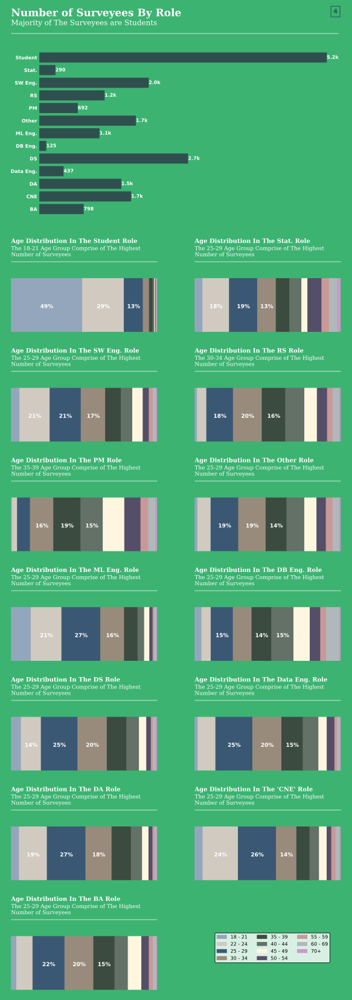

In [14]:
#Figure 4 Code
fig4 = plt.figure(figsize = (10, 30), facecolor = "mediumseagreen")
gs4 = gs.GridSpec(nrows = 16, ncols = 2, height_ratios=([0.5,3, 0.5, 1, 0.5, 1, 0.5, 1, 0.5, 1, 0.5, 1, 0.5, 1, 0.5, 1]))

#ax1 - Main title
ax1 = plt.subplot(gs4[0, :2])

#Border Expansion
ax1.text(x = -0.02 , y = 0.5 , s = "Number of Surveyees in Each Role", color = "mediumseagreen", size = 17, weight = "bold", fontfamily = "serif")

#Main Title and Subtitle
ax1.text(x = 0 , y = 0.6 , s = "Number of Surveyees By Role", color = "white", size = 17, weight = "bold", fontfamily = "serif")
ax1.text(x = 0 , y = 0.3 , s = "Majority of The Surveyees are Students", color = "white", size = 12, fontfamily = "serif")
ax1.axhline(y = 0, xmin = 0, xmax = 0.97, c = "white", alpha = 0.5, linewidth = 3)

#Adding Figure Number
ax1.text(x = 0.97, y = 0.7, s = "4", transform = ax1.transAxes, color = "darkslategrey", ha = "right", weight = "bold", bbox = dict(fc = "none", ec = "darkslategrey"))    

#Cosmetics
cosmetics(ax1, "both")

#ax3 - Main Graph
ax3 = plt.subplot(gs4[1, :2], zorder = 2)

survey_data_copy2 = survey_data.copy()

#Preparig The Data
age_bools = survey_data_copy2["Q1"].str.get_dummies().astype(bool)
age_bools["Roles"] = survey_data_copy2["Q5"]

roles_age_pivot_table = age_bools.pivot_table([col for col in age_bools.columns if "-" or "+" in col], "Roles", aggfunc = np.sum)
roles_age_pivot_table["total"] = roles_age_pivot_table.sum(axis = 1)
roles_age_pivot_table.iloc[:, :11] = (roles_age_pivot_table.iloc[:, :11].div(roles_age_pivot_table.total, axis=0))
roles_age_pivot_table["Roles"] = roles_age_pivot_table.index
roles_dict = {"Software Engineer" : "SF Eng.", "Research Scientist" : "Researcher", "Product/Project Manager" : "Product Mgr.", "Machine Learning Engineer" : "ML Eng.", "Database Engineer" : "DB Eng.", "Data Engineer" : "Data Eng.", "Currently not employed" : "Unemployed"}
roles_age_pivot_table["Roles"] = roles_age_pivot_table["Roles"].replace(roles_dict).str.upper()

color_dict = {"18-21" : "#94A6BB", "22-24" : "#D0CAC0", "25-29" : "#3A5874", "30-34" : "#998B7B", "35-39" : "#3C4B40", "40-44" : "#637167", "45-49" : "#FFF6E0", "50-54" : "#554E68", "55-59" : "#C99999", "60-69" : "#B1B8BB", "70+" : "#CB99C9"}  

#Plotting the Graph
ax3.barh(roles_age_pivot_table.index, roles_age_pivot_table["total"], color = "darkslategrey")

#Adding Totals For Each Role
main_y = 0
for index, row in roles_age_pivot_table.iterrows():
    total = row["total"]
    if total > 1000:
        ax3.text(x = total, y = main_y , s = str(round((total/1000),1)) + "k", weight = "bold", color = "white", size = 8, va = "center", ha = "left")
    else:
        ax3.text(x = total, y = main_y , s = str(total), weight = "bold", color = "white", size = 8, va = "center", ha = "left")
    main_y += 1

ax3.set_yticklabels(["Student", "Stat.", "SW Eng.", "RS", "PM", "Other", "ML Eng.", "DB Eng.", "DS", "Data Eng.", "DA", "CNE", "BA"][::-1], ha = "right", color = "white", size = 8, weight = "bold")

#Cosmetics
cosmetics(ax3, "x")

bbax3 = ax3.get_position()
bbax3.x0 = 0.19
bbax3.x1 = 0.885
ax3.set_position(bbax3)
  
#ax4 - tile: Student
ax4 = plt.subplot(gs4[2, 0])
title_maker_4(ax4, "Student", "18-21")


#ax5 - title: Statstician
ax5 = plt.subplot(gs4[2, 1])
title_maker_4(ax5, "Stat.", "25-29") 
    
#ax6 - student graph
ax6 = plt.subplot(gs4[3, 0])
subplot_gen(ax6, "Student", 5171)
    
#ax7 - statstician graph
ax7 = plt.subplot(gs4[3, 1])
subplot_gen(ax7, "Statistician", 290)

#ax8 - title: software Engineer
ax8 = plt.subplot(gs4[4, 0])
title_maker_4(ax8, "SW Eng.", "25-29")

#ax9 - title: Research Scientist
ax9 = plt.subplot(gs4[4, 1])
title_maker_4(ax9, "RS", "30-34")

#ax10 - software Engineer graph
ax10 = plt.subplot(gs4[5, 0])
subplot_gen(ax10, "Software Engineer", 1968)

#ax11 - research scientis graph
ax11 = plt.subplot(gs4[5, 1])
subplot_gen(ax11, "Research Scientist", 1174)
    
#ax12 - title: Prohect manager title
ax12 = plt.subplot(gs4[6, 0])
title_maker_4(ax12, "PM", "35-39")

#ax13 - title: other
ax13 = plt.subplot(gs4[6, 1])
title_maker_4(ax13, "Other", "25-29")

#ax14 - Project manager graph
ax14 = plt.subplot(gs4[7, 0])
subplot_gen(ax14, "Product/Project Manager", 692)

#ax15 - Other graph
ax15 = plt.subplot(gs4[7, 1])    
subplot_gen(ax15, "Other", 1737)

#ax16 - title: Machin learning engineer
ax16 = plt.subplot(gs4[8, 0])
title_maker_4(ax16, "ML Eng.", "25-29")

#ax17 - title: Database Engineer
ax17 = plt.subplot(gs4[8, 1])
title_maker_4(ax17, "DB Eng.", "25-29")


#ax18 - Mahcine Learning graph
ax18 = plt.subplot(gs4[9, 0])
subplot_gen(ax18, "Machine Learning Engineer", 1082)
    

#ax19 - databse Engineer graph
ax19 = plt.subplot(gs4[9, 1])
subplot_gen(ax19, "Database Engineer", 125)
    
#ax20 - title: Data Sceintsit
ax20 = plt.subplot(gs4[10, 0])
title_maker_4(ax20, "DS", "25-29")    
    
#ax21  - title: Data Engineer
ax21 = plt.subplot(gs4[10, 1])
title_maker_4(ax21, "Data Eng.", "25-29")    

#ax22 - Data Scientist graph
ax22 = plt.subplot(gs4[11, 0])
subplot_gen(ax22, "Data Scientist", 2676)

#ax23 - Data Engineer graph
ax23 = plt.subplot(gs4[11, 1])
subplot_gen(ax23, "Data Engineer", 437)

#ax24 - title: Data Analyst
ax24 = plt.subplot(gs4[12, 0])
title_maker_4(ax24, "DA", "25-29")

#ax25 - title: CNE
ax25 = plt.subplot(gs4[12, 1])
title_maker_4(ax25, "'CNE'", "25-29")

#ax26 - Data Analyst graph
ax26 = plt.subplot(gs4[13, 0])
subplot_gen(ax26, "Data Analyst", 1475)


#ax27 - CNE graph
ax27 = plt.subplot(gs4[13, 1])
subplot_gen(ax27, "Currently not employed", 1652)

#ax28 - title: Business Analyst
ax28 = plt.subplot(gs4[14, 0])
title_maker_4(ax28, "BA", "25-29")    
    
#ax29 - title: blank
ax29 = plt.subplot(gs4[14, 1])

#Cosmetics
cosmetics(ax29, "both")
    
#ax30 - Business Analyst graph
ax30 = plt.subplot(gs4[15, 0])
subplot_gen(ax30, "Business Analyst", 798)


#ax31 = blank graph
ax31 = plt.subplot(gs4[15, 1])

ax31.text(x = 0, y = 0, s = "extend", color = "mediumseagreen", va = "top")

#manually putting a legend
pop_1 = mpatches.Patch(color = "#94A6BB", label='18 - 21')
pop_2 = mpatches.Patch(color = "#D0CAC0", label='22 - 24')
pop_3 = mpatches.Patch(color = "#3A5874", label='25 - 29')
pop_4 = mpatches.Patch(color = "#998B7B", label='30 - 34')
pop_5 = mpatches.Patch(color = "#3C4B40", label='35 - 39')
pop_6 = mpatches.Patch(color = "#637167", label='40 - 44')
pop_7 = mpatches.Patch(color = "#FFF6E0", label='45 - 49')
pop_8 = mpatches.Patch(color = "#554E68", label='50 - 54')
pop_9 = mpatches.Patch(color = "#C99999", label='55 - 59')
pop_10 = mpatches.Patch(color = "#B1B8BB", label='60 - 69')
pop_11 = mpatches.Patch(color = "#CB99C9", label='70+')

ax31.legend(handles = [pop_1, pop_2, pop_3, pop_4, pop_5, pop_6, pop_7, pop_8, pop_9, pop_10, pop_11], ncol = 3, loc = 1, bbox_to_anchor = (0.9, 1), frameon = True, facecolor = "white", edgecolor = "black", fontsize = 8)

#Cosmetics
cosmetics(ax31, "both")

plt.show()

>#### Figure 4 Analysis
>- The frequency spread of surveyees across age groups is generally consistent for most roles, however, Project Managers and Database Engineers show a high frequency for the 40 - 44 age group.
>- Project Managers, unlike other roles, also have the highest frequency for age groups of 30 and above.

### Roles vs. Education

In [15]:
#Figure 5 Subplot Code
def Insert_row_(row_number, df, row_value):
    # Slice the upper half of the dataframe
    df1 = df[0:row_number]
    # Store the result of lower half of the dataframe
    df2 = df[row_number:]
    # Inser the row in the upper half dataframe
    df1.loc[row_number]=row_value
    # Concat the two dataframes
    df_result = pd.concat([df1, df2])
    # Reassign the index labels
    df_result.index = [*range(df_result.shape[0])]
    # Return the updated dataframe
    return df_result



def subplot_gen2(ax, role_title):
    
    survey_data_copy = survey_data.copy()
    
    role = survey_data_copy[survey_data_copy["Q5"] == role_title]
    
    #Creating Pivot Table where Index is Education Level and Columns are Years of Experience
    role_years_prog_bools = role["Q6"].str.get_dummies().astype(bool)
    role_years_prog_bools["education level"] = role["Q4"]
    
    #When making the pivot table we don't account for those who did not report their education level and Years of Experience
    pivot_table = role_years_prog_bools.pivot_table([col for col in role_years_prog_bools.columns if "education level" not in col], "education level", aggfunc = np.sum)
    pivot_table["total"] = pivot_table.sum(axis = 1)
    pivot_table["Roles"] = pivot_table.index
    pivot_table = pivot_table[["never written code", "< 1", "1-2", "3-5", "5-10", "10-20", "20+", "total", "Roles"]]
    
    if role_title == "Statistician":
        pivot_table = Insert_row_(3, pivot_table, [0, 0, 0, 0, 0, 0, 0, 0, "I prefer not to answer"])
        pivot_table.index = [" Some college - no degree", "Bachelor’s degree", "Doctoral degree", "I prefer not to answer", "Master’s degree", "No formal education past high school", "Professional degree"]
        pivot_table.index.name = "education level"


    #Plotting the Data    
    r = [1,40,80,120,160,200,240]
    width = 4
    width_dist = 4
   
    colors = ["#94A6BB", "#D0CAC0", "#3A5874", "#998B7B", "#3C4B40", "#637167", "#554E68"]
    
    yoe_sums = pd.DataFrame(pivot_table.loc[:, :"20+"].sum())
    yoe_sums["perc"] = round((yoe_sums / yoe_sums.sum()) * 100, 0)
    
    sums_list = yoe_sums[0].tolist()
    
    pivot_table = pivot_table.reindex(["I prefer not to answer", "No formal education past high school", " Some college - no degree" ,"Bachelor’s degree", "Master’s degree", "Doctoral degree", "Professional degree"])
    
    i = 0
    for index, row in pivot_table.iterrows():
        #Plotting the Graph
        ax.bar(r, pivot_table.loc[row["Roles"], :"20+"], width = width, color = colors[i])        
        
        #Adding the text for Respective Percentages of the Total for Years of Experience
        ax.text(x = r[0] , y = row["never written code"], s = str(int((row["never written code"] / sums_list[0]) * 100)) + "%", ha = "center", color = "darkslategrey", size = 5, weight = "bold", va = "bottom", rotation = 45)
        ax.text(x = r[1] , y = row["< 1"], s = str(int((row["< 1"] / sums_list[1]) * 100)) + "%", ha = "center", color = "darkslategrey", size = 5, weight = "bold", va = "bottom", rotation = 45)
        ax.text(x = r[2] , y = row["1-2"], s = str(int((row["1-2"] / sums_list[2]) * 100)) + "%", ha = "center", color = "darkslategrey", size = 5, weight = "bold", va = "bottom", rotation = 45)
        ax.text(x = r[3] , y = row["3-5"], s = str(int((row["3-5"] / sums_list[3]) * 100)) + "%", ha = "center", color = "darkslategrey", size = 5, weight = "bold", va = "bottom", rotation = 45)
        ax.text(x = r[4] , y = row["5-10"], s = str(int((row["5-10"] / sums_list[4]) * 100)) + "%", ha = "center", color = "darkslategrey", size = 5, weight = "bold", va = "bottom", rotation = 45)
        ax.text(x = r[5] , y = row["10-20"], s = str(int((row["10-20"] / sums_list[5]) * 100)) + "%", ha = "center", color = "darkslategrey", size = 5, weight = "bold", va = "bottom", rotation = 45)
        ax.text(x = r[6] , y = row["20+"], s = str(int((row["20+"] / sums_list[6]) * 100)) + "%", ha = "center", color = "darkslategrey", size = 5, weight = "bold", va = "bottom", rotation = 45)
    
        r = [num + 4 for num in r]
        i += 1
    
    #Adding the Totals for Each Year of Experience and their respective percentae of the Total Frequency for The Role
    x = 12
    ymax = ax.get_ylim()[1]
    for index, row in yoe_sums.iterrows():
        ax.text(x = x, y = ymax + 0.05*ymax, s = "{:,}".format(int(row[0])) + " (", size = 7, va = "bottom", ha = "right", color = "white", weight = "bold")
        ax.text(x = x, y = ymax + 0.05*ymax, s = str(int(row["perc"])) + "%)", size = 7, va = "bottom", ha = "left", color = "white", weight = "bold")
        x += 40
    
    
    ax.set_xlim([0, 270])
    
    #Cosmetics
    cosmetics(ax, "both")
    
def title_maker_5(ax, role, degree):
    
    #Title and Subtitle
    ax.text(x = 0 , y = 0.4, s = "Frequency of Each Education Level By Years of Experience In The {} Role".format(role), weight = "bold", color = "white", size = 9.5, fontfamily = "serif")
    ax.text(x = 0 , y = 0.2, s = "{} Is The Most Frequent Education Level".format(degree), color = "white", size = 9, fontfamily = "serif")
    
    ax.axhline(y = 0.1, xmin  = 0 , xmax = 0.98, c = "white", alpha = 0.5, linewidth = 1.5)
    
    #Adding the x-axis for the Graphs
    if role != "Student":
        ax.text(x = 0, y = 1, s = "      NWC                      < 1                       1 - 2                       3 - 5                      5 - 10                    10 - 20                      20+", color = "white", size = 8, weight = "bold", style = "italic")
    
    #Cosmetics
    cosmetics(ax, "both")
    

>#### Figure 5 Description
>The main graph depicts the frequencies of education levels in each role (the 3 largest age frequencies are displayed for each role). The subplots depict the frequencies of all education levels for each “year of programming experience” interval in each role. Surveyees who did not report their education level and “years of programming experience” were not included in this graph.

>The **aim** of this figure is to determine whether roles favor a certain amount of programming experience and a particular level of education.

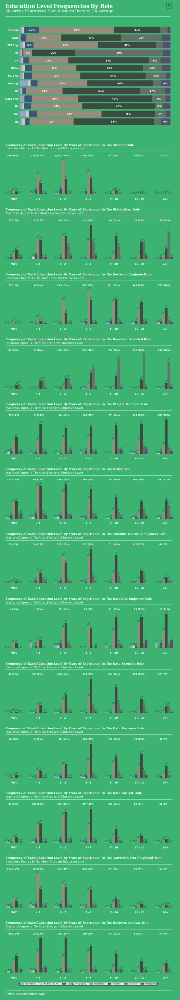

In [16]:
#Figure 5 Code
fig5 = plt.figure(figsize = (10, 60), facecolor = "mediumseagreen")
gs5 = gs.GridSpec(nrows = 30, ncols = 2, height_ratios=([0.4,3, 0.5, 1, 0.5, 1, 0.5, 1, 0.5, 1, 0.5, 1, 0.5, 1, 0.5, 1, 0.5, 1, 0.5, 1, 0.5, 1, 0.5, 1, 0.5, 1, 0.5, 1, 0.1, 0.3]))


#ax1 - Main title
ax1 = plt.subplot(gs5[0, :2])

#Border Expansion
ax1.text(x = -0.02, y = 0.5 , s = "Number of Surveyees in Each Role", color = "mediumseagreen", size = 17, weight = "bold", fontfamily = "serif")

#Main Title and Subtitle
ax1.text(x = 0 , y = 0.6 , s = "Education Level Frequencies By Role", color = "white", size = 17, weight = "bold", fontfamily = "serif")
ax1.text(x = 0 , y = 0.3 , s = "Majority of Surveyees Have Master's Degrees On Average", color = "white", size = 12, fontfamily = "serif")
ax1.axhline(y = 0, xmin = 0, xmax = 0.97, c = "white", alpha = 0.5, linewidth = 3)

#Adding Figure Number
ax1.text(x = 0.97, y = 0.7, s = "5", transform = ax1.transAxes, color = "darkslategrey", ha = "right", weight = "bold", bbox = dict(fc = "none", ec = "darkslategrey"))    

#Cosmetics
cosmetics(ax1, "both")

#ax3 - Main Graph
ax3 = plt.subplot(gs5[1, :2], zorder = 2)

#Creating Bars to be out of 100 so that we acn fill them in with proprtions
roles_full_hbars = pd.DataFrame(survey_data["Q5"].value_counts())
roles_full_hbars["Q5"] = 100
roles_full_hbars.columns = ["full"]
roles_full_hbars["Roles"] = roles_full_hbars.index

#Preapring Data for Pivot Table Creation
edu_bools = survey_data["Q4"].str.get_dummies().astype(bool)
edu_bools["Roles"] = survey_data["Q5"]

#Creating a Pivot Table Where Index is Role and Columns are Educaion Level and Values are Frequencies then converted to Proportions
roles_edu_pivot_table = edu_bools.pivot_table([col for col in edu_bools.columns if "Roles" not in col], "Roles", aggfunc = np.sum)
roles_edu_pivot_table = roles_edu_pivot_table[["Doctoral degree", "Master’s degree", "Bachelor’s degree", "Professional degree", " Some college - no degree", "No formal education past high school", "I prefer not to answer"]]
roles_edu_pivot_table["total"] = roles_edu_pivot_table.sum(axis = 1)
roles_edu_pivot_table.iloc[:, :7] = (roles_edu_pivot_table.iloc[:, :7].div(roles_edu_pivot_table.total, axis=0))
roles_dict = {"Software Engineer" : "SW Eng.", "Research Scientist" : "Researcher", "Product/Project Manager" : "Product Mgr.", "Machine Learning Engineer" : "ML Eng.", "Database Engineer" : "DB Eng.", "Data Engineer" : "Data Eng.", "Currently not employed" : "Unemployed"}
roles_full_hbars["Roles"] = roles_full_hbars["Roles"].replace(roles_dict).str.upper()



#Graphing The Data
ax3.barh(roles_full_hbars["Roles"], roles_full_hbars["full"])

roles_edu_pivot_table = roles_edu_pivot_table[["I prefer not to answer", "No formal education past high school", " Some college - no degree" ,"Bachelor’s degree", "Master’s degree", "Doctoral degree", "Professional degree"]]

#Plotting the Rectangles to act as bars
y = -0.38
y_2 = -0.1
for index, row in roles_edu_pivot_table.iterrows():
    cols = [col for col in roles_edu_pivot_table if "total" not in col]
    colors = ["#94A6BB", "#D0CAC0", "#3A5874", "#998B7B", "#3C4B40", "#637167", "#554E68"]
    
    top_3 = roles_edu_pivot_table.loc[index, :"Professional degree"].sort_values(ascending = False).iloc[:3].astype(float)
    
    x = 0
    for col, color in zip(cols, colors):
        width = row[col] * 100
        rect = mpatches.Rectangle((x, y), width, 0.78, zorder = 2, color = color)
        ax3.add_patch(rect)
        x += width
        
        if row[col] in list(top_3):
            rect_x = rect.get_x()
            widyo = rect.get_x() + rect.get_width()
            ax3.text(x = (rect_x + widyo) / 2, y = y_2, s = str(round(row[col] * 100)) + "%", weight = "bold", size = 8, color = "white", ha = "center")
        
            
    y += 1    
    y_2 += 1

#Formatting the y-axis
ax3.set_yticklabels(["Student", "Stat.", "SW Eng.", "RS", "PM", "Other", "ML Eng.", "DB Eng.", "DS", "Data Eng.", "DA", "CNE", "BA"][::-1], ha = "right", color = "white", size = 8, weight = "bold")

#Cosmetics
cosmetics(ax3, "x")

bbax3 = ax3.get_position()
bbax3.x1 = 0.912
bbax3.x0 = 0.19
ax3.set_position(bbax3)

    
#ax4 - Title: Student
ax4 = plt.subplot(gs5[2, :2])
title_maker_5(ax4, "Student", "Bachelor's Degree")


#ax5 - Graph: Student
ax5 = plt.subplot(gs5[3, :2])
subplot_gen2(ax5, "Student")
    
#ax6 - Title: Statistician
ax6 = plt.subplot(gs5[4, :2])
title_maker_5(ax6, "Statistician", "Masters's Degree")
    
#ax7 - Graph: Statistician
ax7 = plt.subplot(gs5[5, :2])
subplot_gen2(ax7, "Statistician")

#ax8 - Title: Software Engineer
ax8 = plt.subplot(gs5[6, :2])
title_maker_5(ax8, "Sostware Engineer", "Bachelor's Degree")

#ax9 - Graph: Software Engineer
ax9 = plt.subplot(gs5[7, :2])
subplot_gen2(ax9, "Software Engineer")

#ax10 - Title: Research Scientist
ax10 = plt.subplot(gs5[8, :2])
title_maker_5(ax10, "Research Scientist", "Doctoral Degree")

#ax11 - Graph: Research Scientist
ax11 = plt.subplot(gs5[9, :2])
subplot_gen2(ax11, "Research Scientist")
    
#ax12 - Title: Product/Project Manager
ax12 = plt.subplot(gs5[10, :2])
title_maker_5(ax12, "Project Manager", "Master's Degree")

#ax13 - Graph: Product/Project Manager
ax13 = plt.subplot(gs5[11, :2])
subplot_gen2(ax13, "Product/Project Manager")

#ax14 - Title: Other
ax14 = plt.subplot(gs5[12, :2])
title_maker_5(ax14, "Other", "Master's Degree")

#ax15 - Graph: Other
ax15 = plt.subplot(gs5[13, :2])    
subplot_gen2(ax15, "Other")

#ax16 - Title: ML ENG.
ax16 = plt.subplot(gs5[14, :2])
title_maker_5(ax16, "Machine Learning Engineer", "Master's Degree")

#ax17 - Graph: ML ENG.
ax17 = plt.subplot(gs5[15, :2])
subplot_gen2(ax17, "Machine Learning Engineer")

#ax18 - Title: Database Engineer
ax18 = plt.subplot(gs5[16, :2])
title_maker_5(ax18, "Database Engineer", "Master's Degree")    

#ax19 - Graph: Database Engineer
ax19 = plt.subplot(gs5[17, :2])
subplot_gen2(ax19, "Database Engineer")
    
#ax20 - Title: Data Scientist
ax20 = plt.subplot(gs5[18, :2])
title_maker_5(ax20, "Data Scientist", "Master's Degree")  
    
#ax21  - Graph: Data Scientist
ax21 = plt.subplot(gs5[19, :2])
subplot_gen2(ax21, "Data Scientist")   

#ax22 - Title: Data Engineer
ax22 = plt.subplot(gs5[20, :2])
title_maker_5(ax22, "Data Engineer", "Master's Degree")

#ax23 - Graph: Data Engineer
ax23 = plt.subplot(gs5[21, :2])
subplot_gen2(ax23, "Data Engineer")

#ax24 - Title: Data Analyst
ax24 = plt.subplot(gs5[22, :2])
title_maker_5(ax24, "Data Analyst", "Master's Degree")

#ax25 - Graph: Data Analyst
ax25 = plt.subplot(gs5[23, :2])
subplot_gen2(ax25, "Data Analyst")


#ax26 - Title: Currently not employed
ax26 = plt.subplot(gs5[24, :2])
title_maker_5(ax26, "'Currently Not Employed'", "Bachelor's Degree")


#ax27 - Graph: Currently not employed
ax27 = plt.subplot(gs5[25, :2])
subplot_gen2(ax27, "Currently not employed")

#ax28 - Title: Business Analyst
ax28 = plt.subplot(gs5[26, :2])
title_maker_5(ax28, "Business Analyst", "Master's Degree")
  
#ax29 - Graph: Business Analyst
ax29 = plt.subplot(gs5[27, :2])
subplot_gen2(ax29, "Business Analyst")


# ax30 - Legend 
ax30 = plt.subplot(gs5[28, :2])

#manually putting a legend
pop_1 = mpatches.Patch(color = "#94A6BB", label='No Answer')
pop_2 = mpatches.Patch(color = "#D0CAC0", label='No Edu. Past HS')
pop_3 = mpatches.Patch(color = "#3A5874", label='College - No Degree')
pop_4 = mpatches.Patch(color = "#998B7B", label="Bachelor's")
pop_5 = mpatches.Patch(color = "#3C4B40", label="Master's")
pop_6 = mpatches.Patch(color = "#637167", label='Doctoral')
pop_7 = mpatches.Patch(color = "#554E68", label='Professional')

ax30.legend(handles = [pop_1, pop_2, pop_3, pop_4, pop_5, pop_6, pop_7], ncol = 7, loc = 1, bbox_to_anchor = (0.9, 0), frameon = True, facecolor = "white", edgecolor = "black", fontsize = 6)

ax30.text(x = 0, y = 0.9, s = "      NWC                      < 1                       1 - 2                       3 - 5                      5 - 10                    10 - 20                      20+", color = "white", size = 8, weight = "bold", style = "italic")
    
#Cosmetics
cosmetics(ax30, "both")
    
ax31 = plt.subplot(gs5[29, :2])

ax31.axhline(y = 0.7, xmin = 0, xmax = 0.98, c = "white", alpha = 0.5, linewidth = 1.5)

ax31.text(x = 0, y = 0.3, s = "* NWC = Never Written Code", color = "white", weight = "bold", size = 8, fontfamily = "serif")

#Cosmetics
cosmetics(ax31, "both")
    
plt.show()

>#### Figure 5 Analysis
>- Across all roles, there are varying levels of required programming experience.
>- Expectedly, Students largely consist of surveyees with 1 - 2 years of experience, with only 1% of them having 10 or more years of experience.
>- Statisticians and Project Managers exhibit a generally even spread of surveyees across all years of experience groups.
>- Research Scientist frequencies are geared more towards greater years of experience, with education level requirements heavily skewed for those with doctoral degrees.
>- For Software Engineers, surveyees with bachelor’s degrees are the most prominent up until 5 years of experience, after which doctoral degrees become the most prominent.

In [17]:
#Figure 6 Subplot Code
def course_grapher(ax, role):
    
    survey_data_copy = survey_data.copy()
    
    #Preparing the Data
    role_data = survey_data[survey_data["Q5"] == role]
    role_data = role_data.loc[:, ["Q4", "Q37_Part_1", "Q37_Part_2", "Q37_Part_3", "Q37_Part_4", "Q37_Part_5", "Q37_Part_6", "Q37_Part_7", "Q37_Part_8", "Q37_Part_9", "Q37_Part_11", "Q37_OTHER"]]
    role_data.columns = ["degree", "Coursera", "edX", "KLC", "DC", "Fast.ai", "Udacity", "Udemy", "LI", "Cloud", "None", "Other"]

    for col in role_data.columns:
        if col != "degree":
            role_data[col] = role_data[col].str.get_dummies().astype(bool)
    
    #Creating a pivot table where we get the frequency of each cloud course taken per education level
    role_data = role_data.pivot_table([course for course in role_data.columns if course != "degree"], "degree", aggfunc = np.sum)
    
    if role == "Statistician":
        role_data = role_data.loc[["No formal education past high school", " Some college - no degree", "Bachelor’s degree", "Master’s degree", "Doctoral degree", "Professional degree"]]
    else:
        role_data = role_data.loc[["I prefer not to answer", "No formal education past high school", " Some college - no degree", "Bachelor’s degree", "Master’s degree", "Doctoral degree", "Professional degree"]]

    
    #Graphing The Data
    ax = sns.heatmap(role_data, annot = True, cbar = False, fmt = "g", annot_kws={"fontsize" : 6, "fontweight" : "bold"})

    y_labels_dict = {" Some college - no degree" : "SC","Bachelor’s degree" : "B","Doctoral degree" : "D","I prefer not to answer" : "N/A","Master’s degree" : "M", "No formal education past high school" : "HS","Professional degree" : "P"}

    ax.set_yticklabels(pd.Series(role_data.index).replace(y_labels_dict), rotation = 45, size = 6, color = "white", weight = "bold")
    ax.set_xticklabels(role_data.columns, rotation = 45 , size = 6, color = "white", weight = "bold")
   

    #Cosmetics
    cosmetics(ax, "none")
    
    ax.set_xlabel("")
    ax.set_ylabel("")
    
    if role in ["Student", "Software Engineer", "Product/Project Manager", "Machine Learning Engineer", "Data Scientist", "Data Analyst", "Business Analyst"]:
        bbax = ax.get_position()
        bbax.x0 = 0.15
        ax.set_position(bbax)
    else:
        bbax = ax.get_position()
        bbax.x0 = 0.57
        ax.set_position(bbax)
    

def title_maker_18(ax, role):

    ax.text(x = 0, y = 0.55, s = "Frequency of Education Level and Course\nPlatform In The {} Role".format(role), color = "white", fontfamily = "serif", weight = "bold", size = 9.5)
    ax.text(x = 0, y = 0.1, s = "Surveyees With a Master's Degree Tend to Seek\nExternal Courses", color = "white", fontfamily = "serif", size = 9)
    ax.axhline(y = 0, xmin = 0, xmax = 1, linewidth = 3, c = "white", alpha = 0.5)

    #Cosmetics
    cosmetics(ax, "both")

>#### Figure 6 Description
>This figure depicts the densities of education level-course platform combinations. Each cell represents the count for an education level-course platform combination.

>The **aim** of this figure is to determine whether or not the knowledge acquired through a degree is sufficient enough for a data-related role.

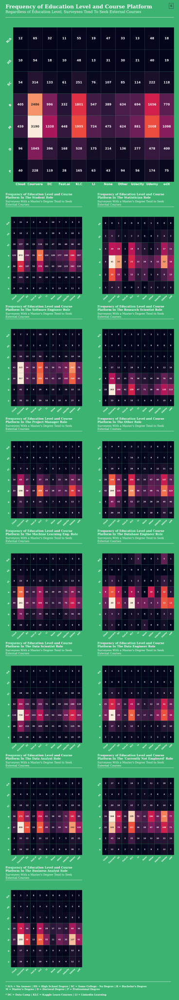

In [18]:
#Figure 6 Code
fig18 = plt.figure(figsize = (10, 60), facecolor = "mediumseagreen")
gs18 = gs.GridSpec(nrows = 17, ncols = 2, height_ratios=([0.5,5, 0.5, 2.5, 0.5, 2.5, 0.5, 2.5, 0.5, 2.5, 0.5, 2.5, 0.5, 2.5, 0.5, 2.5, 0.5]))

#ax1 - Main title
ax1 = plt.subplot(gs18[0, :2])

#Border Expansion
ax1.text(x = -0.02 , y = 0.5 , s = "Number of Surveyees in Each Role", color = "mediumseagreen", size = 17, weight = "bold", fontfamily = "serif")
ax1.text(x = 0.6 , y = 0.75 , s = "Number of Surveyees in Each Role", color = "mediumseagreen", size = 12, weight = "bold", fontfamily = "serif")

#Main Title and Subtitle
ax1.text(x = 0 , y = 0.6 , s = "Frequency of Education Level and Course Platform", color = "white", size = 17, weight = "bold", fontfamily = "serif")
ax1.text(x = 0 , y = 0.3 , s = "Regardless of Education Level, Surveyees Tend To Seek External Courses", color = "white", size = 12, fontfamily = "serif")

ax1.axhline(y = 0, xmin = 0, xmax = 1, c = "white", alpha = 0.5, linewidth = 3)
 
#Adding the Figure Number    
ax1.text(x = 0.99, y = 0.7, s = "6", transform = ax1.transAxes, color = "darkslategrey", ha = "right", weight = "bold", bbox = dict(fc = "none", ec = "darkslategrey"))    

#Cosmetics
cosmetics(ax1, "both")
    
#ax2 - Main Graph 
ax2 = plt.subplot(gs18[1, :2])

#Preparing the Data
main_data = survey_data.loc[:, ["Q4", "Q37_Part_1", "Q37_Part_2", "Q37_Part_3", "Q37_Part_4", "Q37_Part_5", "Q37_Part_6", "Q37_Part_7", "Q37_Part_8", "Q37_Part_9", "Q37_Part_11", "Q37_OTHER"]]
main_data.columns = ["degree", "Coursera", "edX", "KLC", "DC", "Fast.ai", "Udacity", "Udemy", "LI", "Cloud", "None", "Other"]

for col in main_data.columns:
    if col != "degree":
        main_data[col] = main_data[col].str.get_dummies().astype(bool)

main_data = main_data.pivot_table([course for course in main_data.columns if course != "degree"], "degree", aggfunc = np.sum)
main_data = main_data.loc[["I prefer not to answer", "No formal education past high school", " Some college - no degree", "Bachelor’s degree", "Master’s degree", "Doctoral degree", "Professional degree"]]

#Graphing The Data
ax2 = sns.heatmap(main_data, annot = True, cbar = False, fmt = "g", annot_kws={"fontsize" : 10, "fontweight" : "bold"})

y_labels_dict = {" Some college - no degree" : "SC","Bachelor’s degree" : "B","Doctoral degree" : "D","I prefer not to answer" : "N/A","Master’s degree" : "M", "No formal education past high school" : "HS","Professional degree" : "P"}


ax2.set_yticklabels(pd.Series(main_data.index).replace(y_labels_dict), rotation = 45, size = 10, color = "white", weight = "bold")
ax2.set_xticklabels(main_data.columns, rotation = 0 , size = 10, color = "white", weight = "bold")


#Cosmetics
cosmetics(ax2, "none")

ax2.set_xlabel("")
ax2.set_ylabel("")

bbax22 = ax2.get_position()
bbax22.x0 = 0.16
ax2.set_position(bbax22)



#ax3 - Title: Student
ax3 = plt.subplot(gs18[2, 0])
title_maker_18(ax3, "Student")

#ax4 - Title: Statistician
ax4 = plt.subplot(gs18[2, 1])
title_maker_18(ax4, "Statistician")

#ax5 - Graph: Student
ax5 = plt.subplot(gs18[3, 0])
course_grapher(ax5, "Student")

    
#ax6 - Graph: Statistician
ax6 = plt.subplot(gs18[3, 1])
course_grapher(ax6, "Statistician")


#ax7 - Title: Software Engineer
ax7 = plt.subplot(gs18[4, 0])
title_maker_18(ax7, "Software Engineer")

#ax8 - Title: Research Scientist
ax8 = plt.subplot(gs18[4, 1])
title_maker_18(ax8, "Research Scientist")

#ax9 - Graph: Software Engineer
ax9 = plt.subplot(gs18[5, 0])
course_grapher(ax9, "Software Engineer")

#ax10 - Graph: Research Scientist
ax10 = plt.subplot(gs18[5, 1])
course_grapher(ax10, "Research Scientist")

#ax11 - Title: Product/Project Manager
ax11 = plt.subplot(gs18[6, 0])
title_maker_18(ax11, "Project Manager")
    
#ax12 - Title: Other
ax12 = plt.subplot(gs18[6, 1])
title_maker_18(ax12, "Other")


#ax13 - Graph: Product/Project Manager
ax13 = plt.subplot(gs18[7, 0])
course_grapher(ax13, "Product/Project Manager")


#ax14 - Graph: Other
ax14 = plt.subplot(gs18[7, 1])
course_grapher(ax14, "Other")


#ax15 - Title: Machine Learning Engineer
ax15 = plt.subplot(gs18[8, 0])
title_maker_18(ax15, "Machine Learning Eng.")

#ax16 - Title: Database Engineer
ax16 = plt.subplot(gs18[8, 1])
title_maker_18(ax16, "Database Engineer")

#ax17 - Graph: Machine Learning Engineer
ax17 = plt.subplot(gs18[9, 0])
course_grapher(ax17, "Machine Learning Engineer")


#ax18 - Graph: Database Engineer
ax18 = plt.subplot(gs18[9, 1])
course_grapher(ax18, "Database Engineer")


#ax19 - Title: Data Scientist
ax19 = plt.subplot(gs18[10, 0])
title_maker_18(ax19, "Data Scientist")    
    
#ax20 - Title: Data Engineer
ax20 = plt.subplot(gs18[10, 1])
title_maker_18(ax20, "Data Engineer")
    
#ax21  - Graph: Data Scientist
ax21 = plt.subplot(gs18[11, 0])
course_grapher(ax21, "Data Scientist")


#ax22 - Graph: Data Engineer
ax22 = plt.subplot(gs18[11, 1])
course_grapher(ax22, "Data Engineer")


#ax23 - Title: Data Analyst
ax23 = plt.subplot(gs18[12, 0])
title_maker_18(ax23, "Data Analyst")

#ax24 - Title: CNE
ax24 = plt.subplot(gs18[12, 1])
title_maker_18(ax24, "'Currently Not Employed'")

#ax25 - Graph: Data Analyst
ax25 = plt.subplot(gs18[13, 0])
course_grapher(ax25, "Data Analyst")


#ax26 - Graph: CNE
ax26 = plt.subplot(gs18[13, 1])
course_grapher(ax26, "Currently not employed")

#ax27 - Title: Business Analyst
ax27 = plt.subplot(gs18[14, 0])
title_maker_18(ax27, "Business Analyst")


#ax28 - Title: Blank
ax28 = plt.subplot(gs18[14, 1])

#Cosmetics
cosmetics(ax28, "both")

#ax29 - Graph: Business Analyst
ax29 = plt.subplot(gs18[15, 0])
course_grapher(ax29, "Business Analyst")



#ax30 - Graph: Blank
ax30 = plt.subplot(gs18[15, 1])

#Cosmetics
cosmetics(ax30, "both")

ax31 = plt.subplot(gs18[16, :2])

ax31.axhline(y = 0.7, xmin = 0, xmax = 0.98, c = "white", alpha = 0.5, linewidth = 1.5)

ax31.text(x = 0, y = -0.3, s = "extender", color = "mediumseagreen", size = 12)

ax31.text(x = 0, y = -0.2, s = "* N/A = No Answer | HS = High School Degree | SC = Some College - No Degree | B = Bachelor's Degree\nM = Master's Degree | D = Doctoral Degree | P = Professional Degree\n \n* DC = Data Camp | KLC = Kaggle Learn Courses | LI = LinkedIn Learning", color = "white", weight = "bold", size = 8, fontfamily = "serif")

#Cosmetics
cosmetics(ax31, "both")


plt.show()

>#### Figure 6 Analysis
>- Across all roles, surveyees seeking external courses are those with either a bachelor’s, master’s, or doctoral degree.
>- Around 35% of all surveyees seek external courses.
>- The preferred platforms for most roles are Coursera, KLC, and Udemy.

### Roles vs. Continents

In [19]:
#Figure 7 Subplot Code
def grapher(continent, ax):
    colorz = {"Student" : "#94A6BB","Software Engineer": "#D0CAC0","Business Analyst" : "#3A5874", "Data Analyst": "#998B7B","Data Engineer" : "#3C4B40", "Database Engineer" :"#F8DBAA", "Data Scientist" :"#554E68", "Research Scientist": "#FFF6E0", "Currently not employed": "#C99999", "Other" :"#B1B8BB", "Statistician" :"#CB99C9", "Product/Project Manager" : "teal","Machine Learning Engineer": "#C3D2AE"}
    
    #Preparing Data
    continent_data = survey_data[survey_data["Continent"] == continent]
    continent_graph = pd.DataFrame(continent_data["Q5"].value_counts())
    continent_graph["color"] = continent_graph.index.map(colorz)
    
    #Graphing The Data
    squarify.plot(continent_graph["Q5"].sort_values(ascending = False), color = continent_graph["color"])
    for location in ["top", "bottom", "left", "right"]:
        ax.spines[location].set_visible(False)
        
    ax.axis("off")
    
    center_list = []
    
    #Gathering the the center point coordinates for the top 3 largest Roles
    for rect in ax.patches:
        coord22 = rect.get_bbox().get_points()
        coord_list = []
        for element in coord22:
            for num in element:
                coord_list.append(num)
                
        center = [(coord_list[0] + coord_list[2]) / 2, (coord_list[1] + coord_list[3]) /2]
        center_list.append(center)
    

    #Adding the center list and creating role percent column in the DF
    continent_graph["center"] = center_list
    continent_graph["perc"] = ((continent_graph["Q5"] / continent_data["Q5"].value_counts(dropna = False).sum()) * 100).astype(int).astype(str) + "%"
    
    #Creating a top 3 DF for the 3 largest roles in each continent
    top_3 = continent_graph.sort_values("Q5", ascending = False).iloc[:3]
    
    #Adding the percentage texts to the graph
    for index, row in top_3.iterrows():
        ax.text(x = row["center"][0], y = row["center"][1], s = row["perc"], color = "white", size = 8, weight = "bold", ha = "center", va = "center")
    


def title_maker_6(continent, role, ax):
    
    ax.text(x = 0 , y = 0.7, s = "Frequency of Roles In {}".format(continent), color = "white", size = 10, fontfamily = "serif", weight = "bold")
    ax.text(x = 0 , y = 0.3, s = "Majority Are {}".format(role), color = "white", size = 9, fontfamily = "serif")
    ax.axhline(y = 0, xmin = 0, xmax  = 1, linewidth = 3, c = "white", alpha = 0.5)
    
    #Cosmetics
    cosmetics(ax, "both")


>#### Figure 7  Description
>This figure depicts the frequencies of roles in each continent (the 3 largest role frequencies are displayed for each continent).

>The **aim** of this figure is to explore whether or not continents are heavily skewed towards a certain role.

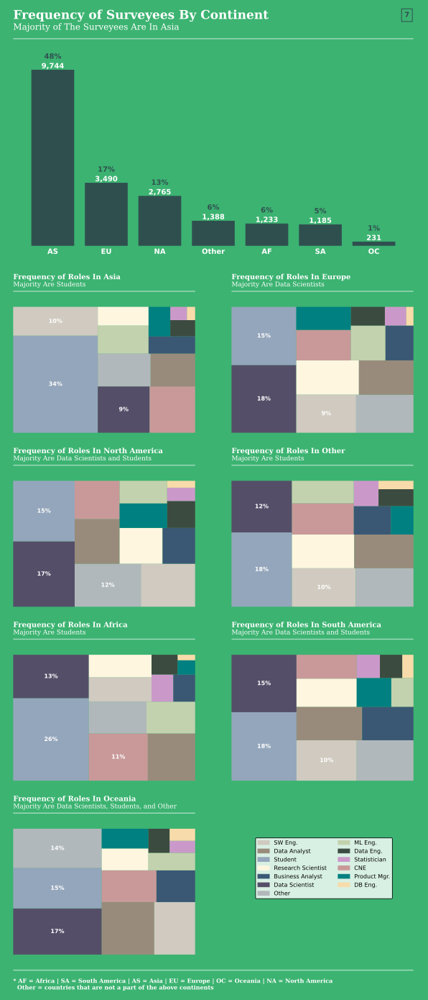

In [20]:
#Figure 7 Code
fig6 = plt.figure(figsize = (10, 25))
gs6 = gs.GridSpec(nrows = 11, ncols = 2, height_ratios=([2,11, 1, 7, 1, 7, 1, 7, 1, 7, 1]))

#ax1 - Title: Main Graph
ax1 = plt.subplot(gs6[0, :2])

#Border Extension
ax1.text(x = -0.02, y = 0.5, s ="The Spread of Surveyees Across Continents" , weight = "bold", color = "mediumseagreen", size = 17, fontfamily = "serif")
ax1.text(x = 0.5, y = 0.95, s ="The Spread of Surveyees Across Continents" , weight = "bold", color = "mediumseagreen", size = 12, fontfamily = "serif")

#Main Title and Subtitle
ax1.text(x = 0, y = 0.75, s ="Frequency of Surveyees By Continent" , weight = "bold", color = "white", size = 17, fontfamily = "serif")
ax1.text(x = 0, y = 0.45, s ="Majority of The Surveyees Are In Asia", color = "white", size = 12, fontfamily = "serif")

ax1.axhline(y = 0.2, xmin = 0, xmax = 1, c = "white", alpha = 0.5, linewidth = 1.5)

#Adding Figure Number to Graph
ax1.text(x = 0.99, y = 0.8, s = "7", transform = ax1.transAxes, color = "darkslategrey", ha = "right", weight = "bold", bbox = dict(fc = "none", ec = "darkslategrey"))    

#Cosmetics
cosmetics(ax1, "both")


#ax2 - Graph: Main
ax2 = plt.subplot(gs6[1, :2])

survey_data_copy = survey_data.copy()

#Preparing the Data
main_graph = survey_data_copy["Continent"].value_counts()

#Graphing the Data
ax2.bar(main_graph.index, main_graph, color = "darkslategrey")

#Adding percentage column to DF
main_graph = pd.DataFrame(main_graph)
main_graph["perc"] = ((main_graph / main_graph.sum()) * 100).astype(int).astype(str) + "%"

#Adding total and percentage texts to the Graph
x = 0
for index, row in main_graph.iterrows():
    ax2.text(x = x, y = row["Continent"], s = "{:,}".format(row["Continent"]), color = "white", weight = "bold", size = 10, ha = "center", va = "bottom")
    ax2.text(x = x, y = row["Continent"] + (ax2.get_ylim()[1] * 0.06), s = row["perc"], color = "darkslategrey", weight = "bold", size = 10, ha = "center")
    x += 1

ax2.set_xticklabels(main_graph.index, color = "white", weight = "bold", size = 10)

#Cosmetics
cosmetics(ax2, "y")

bbax = ax2.get_position()
bbax.y0 += 0.01
ax2.set_position(bbax)


#ax3 - Title: Asia
ax3 = plt.subplot(gs6[2, 0])
title_maker_6("Asia", "Students", ax3)


#ax4 - Title: Europe
ax4 = plt.subplot(gs6[2, 1])
title_maker_6("Europe", "Data Scientists", ax4)

#ax5 - Graph: Asia
ax5 = plt.subplot(gs6[3, 0])
grapher("AS", ax5)

#ax6 - Graph: Europe
ax6 = plt.subplot(gs6[3, 1])
grapher("EU", ax6)

#ax7 - Title: North America
ax7 = plt.subplot(gs6[4, 0])
title_maker_6("North America", "Data Scientists and Students", ax7)


#ax8 - Title: Other
ax8 = plt.subplot(gs6[4, 1])
title_maker_6("Other", "Students", ax8)

#ax9 - Graph: North America
ax9 = plt.subplot(gs6[5, 0])
grapher("NA", ax9)

#ax10 - Graph: Other
ax10 = plt.subplot(gs6[5, 1])
grapher("Other", ax10)
    
#ax11 - Title: Africa
ax11 = plt.subplot(gs6[6, 0])
title_maker_6("Africa", "Students", ax11)

#ax12 - Title: South America
ax12 = plt.subplot(gs6[6, 1])
title_maker_6("South America", "Data Scientists and Students", ax12)


#ax13 - Graph: Africa
ax13 = plt.subplot(gs6[7, 0])
grapher("AF", ax13)

#ax14 - Graph: South America
ax14 = plt.subplot(gs6[7, 1])
grapher("SA", ax14)
    
#ax15 - Title: Oceania
ax15 = plt.subplot(gs6[8, 0])
title_maker_6("Oceania", "Data Scientists, Students, and Other", ax15)

#ax16 - Title: N/A
ax16 = plt.subplot(gs6[8, 1])

#Cosmetics
cosmetics(ax16, "both")


#ax17 - Graph: Oceania
ax17 = plt.subplot(gs6[9, 0])
grapher("OC", ax17)
        
#ax18 - Graph: N/A
ax18 = plt.subplot(gs6[9, 1])
pop_1 = mpatches.Patch(color="#D0CAC0", label='SW Eng.')
pop_2 = mpatches.Patch(color="#998B7B", label='Data Analyst')
pop_3 = mpatches.Patch(color="#94A6BB", label='Student')
pop_4 = mpatches.Patch(color="#FFF6E0", label='Research Scientist')
pop_5 = mpatches.Patch(color="#3A5874", label='Business Analyst')
pop_6 = mpatches.Patch(color="#554E68", label='Data Scientist')
pop_7 = mpatches.Patch(color="#B1B8BB", label='Other')
pop_8 = mpatches.Patch(color="#C3D2AE", label='ML Eng.')
pop_9 = mpatches.Patch(color="#3C4B40", label='Data Eng.')
pop_10 = mpatches.Patch(color="#CB99C9", label='Statistician')
pop_11 = mpatches.Patch(color="#C99999", label='CNE')
pop_12 = mpatches.Patch(color='teal', label='Product Mgr.')
pop_13 = mpatches.Patch(color="#F8DBAA", label='DB Eng.')

ax18.legend(handles = [pop_1, pop_2, pop_3, pop_4, pop_5, pop_6, pop_7, pop_8, pop_9, pop_10, pop_11, pop_12, pop_13], ncol = 2, loc = 1, bbox_to_anchor = (0.9, 0.95), frameon = True, facecolor = "white", edgecolor = "black", fontsize = 8)

ax18.text(x = 0, y = -0.05, s ="extender" , weight = "bold", color = "mediumseagreen", size = 12, fontfamily = "serif")

#Cosmetics
cosmetics(ax18, "both")

#ax19 - Legend
ax19 = plt.subplot(gs6[10, :2])

ax19.axhline(y = 1, xmin = 0, xmax = 1, c = "white", alpha = 0.5, linewidth = 3)

ax19.text(x = 0, y = -0.3, s = "extender", color = "mediumseagreen", size = 12)

ax19.text(x = 0, y = -0.1, s = "* AF = Africa | SA = South America | AS = Asia | EU = Europe | OC = Oceania | NA = North America\n  Other = countries that are not a part of the above continents", color = "white", weight = "bold", size = 8, fontfamily = "serif")

#Cosmetics
cosmetics(ax19, "both")


fig6.set_facecolor("mediumseagreen")

plt.show()

>#### Figure 7 Analysis
>- Across all continents, the most frequent roles are Students and Data Scientists.
>- Africa has the highest percentage of unemployed surveyees at 11%.

In [21]:
#Figure 8 Subplot Code
def upper_lower_income_grapher(ax, role):
    
    #Organzing countries in to their Income Group
    high_income = ["USA", "Japan", "Russia", "UK", "Germany", "Spain", "France", "Canada", "Taiwan", "Italy", "South Korea", "Australia", "Netherlands", "Singapore", "Poland", "Portugal", "Greece", "Israel", "Chile", "Sweden", "Saudi Arabia", "Switzerland", "Belgium", "UAE", "Ireland"]
    upper_middle_income = ["Brazil", "China", "Turkey", "Mexico", "Colombia", "Iran", "South Africa", "Argentina", "Malaysia", "Thailand", "Tunisia", "Peru", "Romania", "Belarus"]
    lower_middle_income = ["India", "Nigeria", "Indonesia", "Pakistan", "Egypt", "Ukraine", "Viet Nam", "Morocco", "Philippines", "Sri Lanka", "Ghana"]
    low_income = ["Kenya", "Bangladesh", "Nepal"]
    other_income = ["Other"]

    survey_data_copy = survey_data.copy()
    
    #Preparing Data - Splitting Income column into Min and Mac ranges
    role_data = survey_data_copy[survey_data_copy["Q5"] == role]
    role_data["income_level"] = role_data["Q3"].apply(income_level)
    role_data["Q24"] = role_data["Q24"].astype(str)
    role_data["lower_income"] = role_data["Q24"].apply(lambda x : x.split("-")[0] if str(x) != "nan" else x).astype(float)
    role_data["upper_income"] = role_data["Q24"].apply(lambda x : x.split("-")[1] if str(x) != "nan" else x).astype(float)
    
    #Creating a pivot table where index is the Income an the values are the means for upper and lower income
    role_data_pt = role_data.pivot_table(["upper_income", "lower_income"], "income_level", aggfunc = np.mean).sort_values("upper_income", ascending = False)
    role_data_pt = role_data_pt[::-1]
    role_data_pt["yomin"] = [-0.1, 0.9, 1.9, 2.9, 3.9]
    role_data_pt["yomax"] = [0.1, 1.1, 2.1, 3.1, 4.1]
    
    #Preparing Data so that we can add connecting dotted lines
    next_lower_income = role_data_pt["lower_income"][1:].values.tolist()
    next_lower_income.append(np.nan)
    role_data_pt["next_lower_income"] = next_lower_income

    next_upper_income = role_data_pt["upper_income"][1:].values.tolist()
    next_upper_income.append(np.nan)
    role_data_pt["next_upper_income"] = next_upper_income

    next_yomin = role_data_pt["yomin"][1:].values.tolist()
    next_yomin.append(np.nan)
    role_data_pt["next_yomin"] = next_yomin
    
    #Filling in the NaN so that we can perform vectorized operations
    role_data_pt = role_data_pt.fillna(1)
    
    #Calculting the percentage chages between income groups
    role_data_pt["perc_diff_lower_income"] = round(((role_data_pt["next_lower_income"] - role_data_pt["lower_income"]) / role_data_pt["lower_income"]) * 100).astype(int).astype(str) + "%"
    role_data_pt["perc_diff_upper_income"] = round(((role_data_pt["next_upper_income"] - role_data_pt["upper_income"]) / role_data_pt["upper_income"]) * 100).astype(int).astype(str) + "%"
    
    #Filling back with NaN so that we can Graph
    role_data_pt.iloc[-1, -5:] = np.nan
    
    #Setting the x limits
    lower = role_data_pt["lower_income"].min() - 2000
    upper = role_data_pt["upper_income"].max() + 2000
    
    ax.set_xlim([lower, upper])
    
    index = role_data_pt.index
    index = index.insert(0,"NaN")

    #Graphing the Data
    y = 0
    yomin = -0.1
    yomax = 0.1
    for index, row in role_data_pt.iterrows():
      
        ax.hlines(y = y, xmin = row["lower_income"] , xmax = row["upper_income"], color = "tab:blue", linewidth = 1.5)

        ax.vlines(x = row["lower_income"], ymin = yomin, ymax = yomax , color = "tab:blue", linewidth = 1.5)
        ax.vlines(x = row["upper_income"], ymin = yomin, ymax = yomax , color = "tab:blue", linewidth = 1.5)

        ax.plot([row["lower_income"], row["next_lower_income"]], [row["yomax"], row["next_yomin"]], linewidth = 1, ls = "--", color = "darkslategrey")
        ax.plot([row["upper_income"], row["next_upper_income"]], [row["yomax"], row["next_yomin"]], linewidth = 1, ls = "--", color = "darkslategrey")

        ax.text(x = ((row["lower_income"] + row["next_lower_income"]) / 2) - 1000, y = ((row["yomax"] + row["next_yomin"]) / 2) + 0.05, s = row["perc_diff_lower_income"], size = 8, ha = "right", va = "bottom", color = "darkslategrey", weight = "bold")
        ax.text(x = ((row["upper_income"] + row["next_upper_income"]) / 2) + 1000, y = ((row["yomax"] + row["next_yomin"]) / 2) - 0.05, s = row["perc_diff_upper_income"], size = 8, ha = "left", va = "top", color = "darkslategrey", weight = "bold")
        
        
        if index != "HI":
            ax.text(x = row["upper_income"] + 1000, y = y, s = index.upper(), color = "white", ha = "left", size = 8, weight = "bold", va = "center")
        
        elif index == "HI":
            ax.text(x = row["lower_income"] - 1000, y = y, s = index, color = "white", ha = "right", size = 8, weight = "bold", va = "center")
        
        
        y += 1
        yomin += 1
        yomax += 1


    #Fromating the x-tick labels    
    plt.draw()
    labels = ax.get_xticklabels()
    final_labels = []
    for label in labels:
        final_labels.append(label.get_text())
    
    final_labels = pd.Series(final_labels).astype(int)
    
    ax.set_xticklabels(final_labels.apply(lambda x : str(int(x/1000)) + "K"), color = "white", size = 10, weight = "bold")
    
    #Cosmetics
    cosmetics(ax, "y")
    
    if role in ["Statistician", "Research Scientist", "Other", "Database Engineer", "Data Engineer", "Business Analyst"]:
        bbax = ax.get_position()
        bbax.x0 = 0.17
        bbax.x1 = 0.46
        ax.set_position(bbax)
    else:
        bbax = ax.get_position()
        bbax.x0 = 0.59
        bbax.x1 = 0.88
        ax.set_position(bbax)
    

def title_maker_7(ax, role, diff, second):

    ax.text(x = 0, y = 0.6, s = "Average Min and Max Salaries (USD) For HI, UMI,\nOTHER, LMI and LI Countries In The {} Role".format(role), color = "white", size = 8.5, fontfamily = "serif", weight = "bold")
    ax.text(x = 0, y = 0.15, s = "There Is Around a USD {} Difference Between The Averages\nof {} Countries and HI Countries".format(diff, second), color = "white", size = 8, fontfamily = "serif")

    ax.axhline(y = 0, xmin = 0, xmax = 1, c = "white", alpha = 0.5, linewidth = 3)
    
    #Cosmetics
    cosmetics(ax, "both")


>#### Figure 8 Description
>This figure depicts the minimum and maximum average salaries for each income group in each role. The vertical lines at either end of the horizontal lines represent the minimum and maximum average salaries for each income group. The dotted lines represent the percent increases in minimum and maximum average salaries from the preceding income group. Each surveyee was assigned an income group based on the 2014 UN Income Country Classification report.

>The **aim** of this figure is to show the average salary ranges for different income groups and to highlight the staggering average salaries between high-income countries and lower-income countries in each role. 

posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and pos

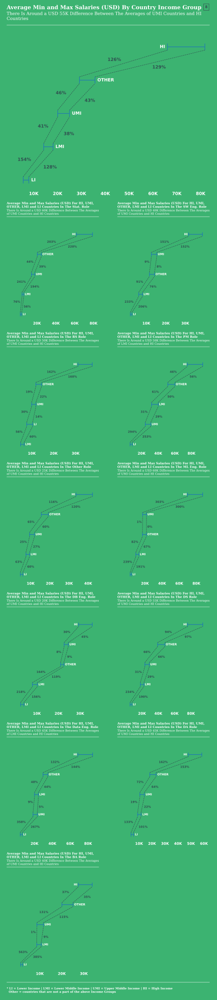

In [22]:
#Figure 8 Code
fig7 = plt.figure(figsize = (10, 50))
gs7 = gs.GridSpec(nrows = 15, ncols = 2, height_ratios = ([0.7,5,0.5,3,0.5,3,0.5,3,0.5,3,0.5,3,0.5,3, 0.5]))

#ax1 - Title: Graph Main
ax1 = plt.subplot(gs7[0, :2])

#Border Expansion
ax1.text(x = -0.02, y = 0.5, s ="The Spread of Surveyees Across Continents" , weight = "bold", color = "mediumseagreen", size = 17, fontfamily = "serif")
ax1.text(x = 0.5, y = 0.9, s ="The Spread of Surveyees Across Continents" , weight = "bold", color = "mediumseagreen", size = 12, fontfamily = "serif")   
    
#Main Title and Subtitle    
ax1.text(x = 0 , y = 0.75, s = "Average Min and Max Salaries (USD) By Country Income Group", weight = "bold", color = "white", fontfamily = "serif", size = 15)
ax1.text(x = 0 , y = 0.25, s = "There Is Around a USD 55K Difference Between The Averages of UMI Countries and HI\nCountries", color = "white", fontfamily = "serif", size = 12)

ax1.axhline(y = 0, xmin = 0, xmax = 1, c = "white", linewidth = 3, alpha = 0.5) 

#Adding Figure Number
ax1.text(x = 0.99, y = 0.8, s = "8", transform = ax1.transAxes, color = "darkslategrey", ha = "right", weight = "bold", bbox = dict(fc = "none", ec = "darkslategrey"))    

#Cosmetics
cosmetics(ax1, "both")

#ax2  Graph: Main
ax2 = plt.subplot(gs7[1, :2])

#Organzing countries in to their Income Group
high_income = ["USA", "Japan", "Russia", "UK", "Germany", "Spain", "France", "Canada", "Taiwan", "Italy", "South Korea", "Australia", "Netherlands", "Singapore", "Poland", "Portugal", "Greece", "Israel", "Chile", "Sweden", "Saudi Arabia", "Switzerland", "Belgium", "UAE", "Ireland"]
upper_middle_income = ["Brazil", "China", "Turkey", "Mexico", "Colombia", "Iran", "South Africa", "Argentina", "Malaysia", "Thailand", "Tunisia", "Peru", "Romania", "Belarus"]
lower_middle_income = ["India", "Nigeria", "Indonesia", "Pakistan", "Egypt", "Ukraine", "Viet Nam", "Morocco", "Philippines", "Sri Lanka", "Ghana"]
low_income = ["Kenya", "Bangladesh", "Nepal"]
other_income = ["Other"]

main_data = survey_data.copy()

#Preparing the Data
main_data["income_level"] = main_data["Q3"].apply(income_level)
main_data["Q24"] = main_data["Q24"].astype(str)
main_data["lower_income"] = main_data["Q24"].apply(lambda x : x.split("-")[0] if str(x) != "nan" else x).astype(float)
main_data["upper_income"] = main_data["Q24"].apply(lambda x : x.split("-")[1] if str(x) != "nan" else x).astype(float)

#Creating a pivot table where index is the Income an the values are the means for upper and lower income
main_data_pt = main_data.pivot_table(["upper_income", "lower_income"], "income_level", aggfunc = np.mean).sort_values("upper_income", ascending = False)
main_data_pt = main_data_pt[::-1]
main_data_pt["yomin"] = [-0.1, 0.9, 1.9, 2.9, 3.9]
main_data_pt["yomax"] = [0.1, 1.1, 2.1, 3.1, 4.1]

#Preparing Data so that we can add connecting dotted lines
next_lower_income = main_data_pt["lower_income"][1:].values.tolist()
next_lower_income.append(np.nan)
main_data_pt["next_lower_income"] = next_lower_income

next_upper_income = main_data_pt["upper_income"][1:].values.tolist()
next_upper_income.append(np.nan)
main_data_pt["next_upper_income"] = next_upper_income

next_yomin = main_data_pt["yomin"][1:].values.tolist()
next_yomin.append(np.nan)
main_data_pt["next_yomin"] = next_yomin


#Filling in the NaN so that we can perform vectorized operations
main_data_pt = main_data_pt.fillna(1) # Apparntly you can't fill with 0's

#Calculting the percentage chages between income groups
main_data_pt["perc_diff_lower_income"] = round(((main_data_pt["next_lower_income"] - main_data_pt["lower_income"]) / main_data_pt["lower_income"]) * 100).astype(int).astype(str) + "%"
main_data_pt["perc_diff_upper_income"] = round(((main_data_pt["next_upper_income"] - main_data_pt["upper_income"]) / main_data_pt["upper_income"]) * 100).astype(int).astype(str) + "%"

#Filling back with NaN so that we can Graph
main_data_pt.iloc[-1, -5:] = np.nan #This is used for "skipping" over cells

#Setting the x-limits
lower = main_data_pt["lower_income"].min() - 2000
upper = main_data_pt["upper_income"].max() + 2000
ax2.set_xlim([lower, upper])
    

index = main_data_pt.index
index = index.insert(0,"NaN")
  
#Graphing the Data
y = 0
yomin = -0.1
yomax = 0.1
for index, row in main_data_pt.iterrows():
      
    ax2.hlines(y = y, xmin = row["lower_income"] , xmax = row["upper_income"], color = "tab:blue", linewidth = 1.5)

    ax2.vlines(x = row["lower_income"], ymin = yomin, ymax = yomax , color = "tab:blue", linewidth = 1.5)
    ax2.vlines(x = row["upper_income"], ymin = yomin, ymax = yomax , color = "tab:blue", linewidth = 1.5)

    ax2.plot([row["lower_income"], row["next_lower_income"]], [row["yomax"], row["next_yomin"]], linewidth = 1, ls = "--", color = "darkslategrey")
    ax2.plot([row["upper_income"], row["next_upper_income"]], [row["yomax"], row["next_yomin"]], linewidth = 1, ls = "--", color = "darkslategrey")

    ax2.text(x = ((row["lower_income"] + row["next_lower_income"]) / 2) - 1000, y = ((row["yomax"] + row["next_yomin"]) / 2) + 0.05, s = row["perc_diff_lower_income"], size = 12, ha = "right", va = "bottom", color = "darkslategrey", weight = "bold")
    ax2.text(x = ((row["upper_income"] + row["next_upper_income"]) / 2) + 1000, y = ((row["yomax"] + row["next_yomin"]) / 2) - 0.05, s = row["perc_diff_upper_income"], size = 12, ha = "left", va = "top", color = "darkslategrey", weight = "bold")
        
        
    if index != "HI":
        ax2.text(x = row["upper_income"] + 1000, y = y, s = index.upper(), color = "white", ha = "left", size = 12, weight = "bold", va = "center")
        
    elif index == "HI":
        ax2.text(x = row["lower_income"] - 1000, y = y, s = index, color = "white", ha = "right", size = 12, weight = "bold", va = "center")
        
        
    y += 1
    yomin += 1
    yomax += 1


#Formatting the x-ticks       
plt.draw()
labels = ax2.get_xticklabels()
final_labels = []
for label in labels:
    final_labels.append(label.get_text())
    
final_labels = pd.Series(final_labels).astype(int)
ax2.set_xticklabels(final_labels.apply(lambda x : str(int(x/1000)) + "K"), color = "white", size = 12, weight = "bold")

#Cosmetics
cosmetics(ax2, "y")

bbax = ax2.get_position()
bbax.x0 = 0.17
ax2.set_position(bbax)
    
#ax3 - Title: Statistician
ax3 = plt.subplot(gs7[2, 0])
title_maker_7(ax3, "Stat.", "60K", "UMI")

#ax4 - Title: Software Engineer
ax4 = plt.subplot(gs7[2, 1])
title_maker_7(ax4, "SW Eng.", "40K", "UMI")

#ax5 - Graph: Statistician
ax5 = plt.subplot(gs7[3, 0])
upper_lower_income_grapher(ax5, "Statistician")


#ax6 - Graph: Software Engineer
ax6 = plt.subplot(gs7[3, 1])
upper_lower_income_grapher(ax6, "Software Engineer")

#ax7 - Title: Research Scientist
ax7 = plt.subplot(gs7[4, 0])
title_maker_7(ax7, "RS", "50K", "UMI")

#ax8 - Title: Product/Project Manager
ax8 = plt.subplot(gs7[4, 1])
title_maker_7(ax8, "PM", "50K", "LMI")

#ax9 - Graph: Research Scientist
ax9 = plt.subplot(gs7[5, 0])
upper_lower_income_grapher(ax9, "Research Scientist")

#ax10 - Graph: Product/Project Manager
ax10 = plt.subplot(gs7[5, 1])
upper_lower_income_grapher(ax10, "Product/Project Manager")

#ax11 - Title: Other
ax11 = plt.subplot(gs7[6, 0])
title_maker_7(ax11, "Other", "25K", "UMI")

#ax12 - Title: Machine Learning Engineer
ax12 = plt.subplot(gs7[6, 1])
title_maker_7(ax12, "ML Eng.", "60K", "UMI")

#ax13 - Graph: Other
ax13 = plt.subplot(gs7[7, 0])
upper_lower_income_grapher(ax13, "Other")

#ax14 - Graph: Machine Learning Engineer
ax14 = plt.subplot(gs7[7, 1])
upper_lower_income_grapher(ax14, "Machine Learning Engineer")

#ax15 - Title: Database Engineer
ax15 = plt.subplot(gs7[8, 0])
title_maker_7(ax15, "DB Eng.", "20K", "UMI")

#ax16 - Title: Data Scientist
ax16 = plt.subplot(gs7[8, 1])
title_maker_7(ax16, "DS", "55K", "UMI")

#ax17 - Graph: Database Engineer
ax17 = plt.subplot(gs7[9, 0])
upper_lower_income_grapher(ax17, "Database Engineer")

#ax18 - Graph: Data Scientist
ax18 = plt.subplot(gs7[9, 1])
upper_lower_income_grapher(ax18, "Data Scientist")

#ax19 - Title: Data Engineer
ax19 = plt.subplot(gs7[10, 0])
title_maker_7(ax19, "Data Eng.", "45K", "LMI")

#ax20 - Title: Data Analyst
ax20 = plt.subplot(gs7[10, 1])
title_maker_7(ax20, "DA", "45K", "UMI")

#ax21 - Graph: Data Engineer
ax21 = plt.subplot(gs7[11, 0])
upper_lower_income_grapher(ax21, "Data Engineer")

#ax22 - Graph: Data Analyst
ax22 = plt.subplot(gs7[11, 1])
upper_lower_income_grapher(ax22, "Data Analyst")

#ax23 - Title: Business Analyst
ax23 = plt.subplot(gs7[12, 0])
title_maker_7(ax23, "BA", "40K", "UMI")

#ax24 - Title: Blank
ax24 = plt.subplot(gs7[12, 1])

#Cosmetics
cosmetics(ax24, "both")

#ax25 - Graph: Business Analyst
ax25 = plt.subplot(gs7[13, 0])
upper_lower_income_grapher(ax25, "Business Analyst")


#ax26 - Graph: Blank
ax26 = plt.subplot(gs7[13, 1])

ax26.text(x = 0, y = -0.07, s ="extender" , weight = "bold", color = "mediumseagreen", size = 12, fontfamily = "serif")

#Cosmetics
cosmetics(ax26, "both")

#ax27 - Legend
ax27 = plt.subplot(gs7[14, :2])

ax27.axhline(y = 1, xmin = 0, xmax = 1, c = "white", alpha = 0.5, linewidth = 3)

ax27.text(x = 0, y = 0.3, s = "* LI = Lower Income | LMI = Lower Middle Income | UMI = Upper Middle Income | HI = High Income\n  Other = countries that are not a part of the above Income Groups", color = "white", weight = "bold", size = 8, fontfamily = "serif")

#Cosmetics
cosmetics(ax27, "both")


fig7.set_facecolor("mediumseagreen")

plt.show()

#Get rid of posx and posy warning
from IPython.display import HTML
HTML('''<script>
code_show_err=false; 
function code_toggle_err() {
 if (code_show_err){
 $('div.output_stderr').hide();
 } else {
 $('div.output_stderr').show();
 }
 code_show_err = !code_show_err
} 
$( document ).ready(code_toggle_err);
</script>
To toggle on/off output_stderr, click <a href="javascript:code_toggle_err()">here</a>.''')

>#### Figure 8 Analysis
>- Across all roles, high-income countries have the greatest variation in average salaries.
>- Machine Learning Engineers exhibit the greatest difference in average salary, with an increase of 300% between upper-middle-income and high-income countries.
>- Database Engineers and Business Analysts exhibit the smallest increase in salary for their respective highest two earning country groups (38% and 36% respectively).
>- Surprisingly, Data Engineers earn a higher salary in lower-middle-income countries rather than in upper-middle-income countries.

## Part 2: Programming Factors

### Roles vs. Programming Languages

In [25]:
#Figure 9 Subplot Code
def image_total(lang, x, y):
    logo = Image.open('/Users/omarstinner/Data Files/Personal Project Files/logos_2/{}.png'.format(lang))
    imagebox = OffsetImage(logo, zoom = 0.05)
    ab_logo = AnnotationBbox(imagebox, [x, y], xybox = (30, -15), boxcoords = "offset points", frameon = False, box_alignment=(1.1, 0))
    ax2.add_artist(ab_logo)
    
    
def grapher(ax, role):
    
    survey_data_copy = survey_data.copy()
    
    #Preparing the Data
    role_data = survey_data_copy[survey_data_copy["Q5"] == role]
    
    prog_langs_role = role_data.loc[:, "Q7_Part_1" : "Q7_OTHER"]
    prog_langs_role = prog_langs_role[["Q7_Part_1", "Q7_Part_2", "Q7_Part_3", "Q7_Part_4", "Q7_Part_5", "Q7_Part_6", "Q7_Part_7", "Q7_Part_8", "Q7_Part_9", "Q7_Part_10", "Q7_Part_11", "Q7_OTHER", "Q7_Part_12"]]
    prog_langs_role["Q7_Part_12"] = prog_langs_role.loc[:, "Q7_Part_1" : "Q7_OTHER"].apply(lambda x : "None" if x.isnull().all() else np.nan, axis = 1)
    prog_langs_role.columns = ["Python", "R", "SQL", "C", "C++", "Java", "Javascript", "Julia", "Swift", "Bash", "MATLAB", "Other", "None"]
    
    
    
    #Counting the Frequency
    langs_count = prog_langs_role.count()
    
    
    #Creating  DF, Sorting it and adding the order column for graphing purposes
    prog_langs_role_totals = pd.DataFrame(langs_count.sort_values(ascending = False))
    prog_langs_role_totals["order"] = [1,2,3,4,5,6,7,8,9,10,11,12,13]
    
    #Making a percentage column
    prog_langs_role_totals["perc"] = (round((prog_langs_role_totals[0] / role_data.shape[0]) * 100)).astype(int).astype(str) + "%"
    
    #Graphing The Data
    ax.bar(pd.Series(prog_langs_role_totals.index).replace({"Javascript" : "JS"}), prog_langs_role_totals[0], color = "darkslategrey")
    
    ax.set_xticklabels(pd.Series(prog_langs_role_totals.index).replace({"Javascript" : "JS"}), rotation = 45, fontsize = 6, weight = "bold", color = "white")
    
    #Adding the percentage texts to the graphs
    i = 0
    for index, row in prog_langs_role_totals.iterrows():
        ax.text(x = i, y = row[0], s = row["perc"], color = "white", size = 6, weight = "bold", ha = "center", va = "bottom")
        i += 1
     
    
    #Adding the Total to the graph
    ax.text(x = prog_langs_role_totals.iloc[-1,1] - 0.25, y = prog_langs_role_totals.iloc[0,0], s = "{:,}".format(role_data.shape[0]), color = "white", weight = "bold", size = 10, ha = "right", bbox = dict(facecolor='none', edgecolor='white'))

    #Cosmetics
    cosmetics(ax, "y")

def title_maker_8(ax, role, pop):

    ax.text(x = 0 ,y = 0.5 ,s = "Frequency of Prog. Langs In The {} Role".format(role), color = "white", weight = "bold", size = 9.5, fontfamily = "serif")
    ax.text(x = 0, y = 0.2, s = "{} Is The Most Frequently Used Language".format(pop), size = 9, fontfamily = "serif", color = "white")

    ax.axhline(y = 0, xmin  = 0 , xmax = 1, c = "white", alpha = 0.5, linewidth = 3)
    
    #Cosmetics
    cosmetics(ax, "both")
  

>#### Figure 9 Description
>The main graph represents the frequency of each programming language in the whole dataset. The percentages along the line show the decrease in frequency from the preceding language. The first row of the table shows the average frequencies of each programming language. The second row shows the percentage frequency decreases of each programming language from the base language (Python - the language with the highest frequency). The subplots shows the frequencies of each programming language in each role. Surveyees who did not report whether or not they used a programming language were included in the “None” category.

>The **aim** of this figure is to show which programming language is favored in each role and highlight the dominance of Python across data-related roles.

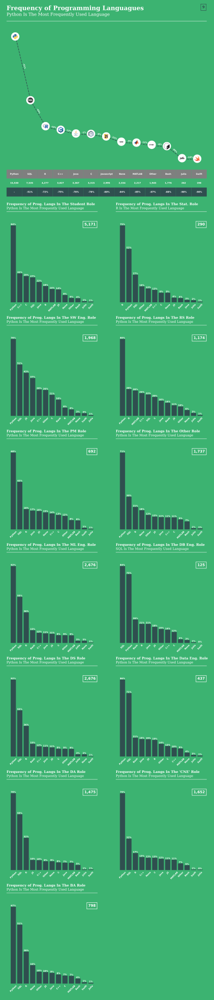

In [26]:
#Figure 9 Code
fig8 = plt.figure(figsize = (10, 50), facecolor = "mediumseagreen")
gs8 = gs.GridSpec(nrows = 17, ncols = 2, height_ratios=([0.7,5, 0.5, 0.5, 3, 0.5, 3, 0.5, 3, 0.5, 3, 0.5, 3, 0.5, 3, 0.5, 3]))

#ax1 - Main title
ax1 = plt.subplot(gs8[0, :2])

#Border Expansion
ax1.text(x = -0.02 , y = 0.5 , s = "Number of Surveyees in Each Role", color = "mediumseagreen", size = 17, weight = "bold", fontfamily = "serif")
ax1.text(x = 0.433, y = 0.3 , s = "Number of Surveyees in Each Role", color = "mediumseagreen", size = 17, weight = "bold", fontfamily = "serif")

#Title and Subtitle
ax1.text(x = 0 , y = 0.6 , s = "Frequency of Programming Languagues", color = "white", size = 17, weight = "bold", fontfamily = "serif")
ax1.text(x = 0 , y = 0.3 , s = "Python Is The Most Frequently Used Language", color = "white", size = 12, fontfamily = "serif")

ax1.axhline(y = 0, xmin = 0, xmax = 1, c = "white", alpha = 0.5, linewidth = 3)

#Adding Figure Number
ax1.text(x = 0.99, y = 0.7, s = "9", transform = ax1.transAxes, color = "darkslategrey", ha = "right", weight = "bold", bbox = dict(fc = "none", ec = "darkslategrey"))    

#Cosmetics
cosmetics(ax1, "both")
    
#ax2 - Main Graph 
ax2 = plt.subplot(gs8[1, :2], zorder = 2)

survey_data_copy = survey_data.copy()

#Preparing Data
prog_langs = survey_data_copy.loc[:, "Q7_Part_1" : "Q7_OTHER"]
prog_langs = prog_langs[["Q7_Part_1", "Q7_Part_2", "Q7_Part_3", "Q7_Part_4", "Q7_Part_5", "Q7_Part_6", "Q7_Part_7", "Q7_Part_8", "Q7_Part_9", "Q7_Part_10", "Q7_Part_11", "Q7_OTHER", "Q7_Part_12"]]
prog_langs["Q7_Part_12"] = prog_langs.loc[:, "Q7_Part_1" : "Q7_OTHER"].apply(lambda x : "None" if x.isnull().all() else np.nan, axis = 1)
prog_langs.columns = ["Python", "R", "SQL", "C", "C++", "Java", "Javascript", "Julia", "Swift", "Bash", "MATLAB", "Other", "None"]

#Counting the Frequency
langs_count = prog_langs.count()

#Creating  DF, Sorting it and adding the order column for graphing purposes
progs_totals = pd.DataFrame(langs_count.sort_values(ascending = False))
progs_totals["order"] = [1,2,3,4,5,6,7,8,9,10,11,12,13]

#Making a percentage column
progs_totals["perc_diff"] = "-" + (((progs_totals.iloc[0,0] - progs_totals[0]) / progs_totals.iloc[0,0]) * 100).astype(int).astype(str) + "%"
progs_totals.iloc[0, -1] = "-"

#Creating table DF 
table_text = progs_totals.iloc[:, [0, 2]]
table_text[0] = table_text[0].apply(lambda x : "{:,}".format(int(x)))

#Converting Table to cell text
cell_text = table_text.T.values.tolist()

#Adding the Table to Graph
the_table = ax2.table(cellText=cell_text,
                        cellLoc = "center",
                        colLabels=progs_totals.index,
                        loc='bottom',
                        cellColours = [["mediumseagreen"] * 13, ["darkslategrey"] * 13],
                        colColours = ["tab:grey"] * 13,
                        bbox=[0,-0.23,1,0.2]) #x,y,w,h

#Formatting the Table
for key, cell in the_table.get_celld().items():
    cell.set_edgecolor("None")
    cell.get_text().set_color('w')
    cell.get_text().set_weight('bold')
    cell.set_linewidth(1)
    cell.set_fontsize(8)

#Plotting the Graph
ax2.plot(progs_totals["order"], progs_totals[0], color = "darkslategrey", ls = "--")


#Adding Images to Graph
image_total("Python", 0.6, 15530)
image_total("SQL", 1.6, 7535)
image_total("R", 2.6, 4277)
image_total("C++", 3.6, 3827)
image_total("Java", 4.6, 3367)
image_total("C", 5.6, 3315)
image_total("JavaScript", 6.6, 2995)
image_total("None", 7.6, 2334)
image_total("MATLAB", 8.6, 2217)
image_total("Other", 9.6, 1945)
image_total("Bash", 10.6, 1776)
image_total("Julia", 11.6, 262)
image_total("Swift", 12.6, 198)


#Preparing percentage difference between languages DF
differences = progs_totals.iloc[:-1, 0].values.tolist()
differences = [0] + differences
progs_totals["next_col"] = differences
progs_totals["next_diff"] = (((progs_totals[0] - progs_totals["next_col"]) / progs_totals["next_col"]) * 100) 
progs_totals.iloc[0,4] = 0
progs_totals["next_diff"] = progs_totals["next_diff"].astype(int).astype(str) + "%"

#Preparing data to Calculate slope of lines between two points(Data lang frequencies)
next_order = progs_totals.iloc[:-1, 1].values.tolist()
next_order = [0] + next_order
progs_totals["next_order"] = next_order
progs_totals["slope"] = (progs_totals[0] - progs_totals["next_col"]) / (progs_totals["order"] - progs_totals["next_order"])

#Function to find the right rotation angle for the percentages texts
def angle_calc(x1, y1, x2, y2):
    dx, dy = np.array((x1, y1)) - np.array((x2, y2))
    # --- retrieve the 'abstract' size
    x_min, x_max = ax2.get_xlim()
    y_min, y_max = ax2.get_ylim()
    # --- apply the proportional conversion
    Dx = dx / (x_max - x_min)
    Dy = dy / (y_max - y_min)
    # --- convert gaps into an angle
    angle = (180/np.pi)*np.arctan( Dy / Dx)
    
    return angle

#Adding the Percentages to the Graph
for index, row in progs_totals.iloc[1:].iterrows():
    if index in ["C", "Other", "Bash", "Swift"]:
        ax2.text(x = (row["order"] + row["next_order"]) /2, y = ((row[0] + row["next_col"]) / 2) + 100, s = row["next_diff"], rotation = angle_calc(row["next_order"], row["next_col"], row["order"], row[0]) + 6, color = "white", weight = "bold", size = 5.5, va = "bottom", ha = "center" )
    elif index == "SQL":
        ax2.text(x = ((row["order"] + row["next_order"]) /2) + 0.07, y = ((row[0] + row["next_col"]) / 2), s = row["next_diff"], rotation = angle_calc(row["next_order"], row["next_col"], row["order"], row[0]) + 6, color = "white", weight = "bold", size = 5.5, va = "bottom", ha = "center" )
    elif index == "MATLAB":
        ax2.text(x = (row["order"] + row["next_order"]) /2, y = ((row[0] + row["next_col"]) / 2) + 100, s = row["next_diff"], rotation = angle_calc(row["next_order"], row["next_col"], row["order"], row[0]) + 6, color = "white", weight = "bold", size = 5.5, va = "bottom", ha = "center" )
    elif index == "Julia":
        ax2.text(x = (row["order"] + row["next_order"]) /2, y = ((row[0] + row["next_col"]) / 2) - 40, s = row["next_diff"], rotation = angle_calc(row["next_order"], row["next_col"], row["order"], row[0]) + 6, color = "white", weight = "bold", size = 5.5, va = "bottom", ha = "center" )
    elif index == "Javascript":
        ax2.text(x = (row["order"] + row["next_order"]) /2, y = ((row[0] + row["next_col"]) / 2) + 50, s = row["next_diff"], rotation = angle_calc(row["next_order"], row["next_col"], row["order"], row[0]) + 6, color = "white", weight = "bold", size = 5.5, va = "bottom", ha = "center" )
    else:
        ax2.text(x = (row["order"] + row["next_order"]) /2, y = ((row[0] + row["next_col"]) / 2), s = row["next_diff"], rotation = angle_calc(row["next_order"], row["next_col"], row["order"], row[0]) + 6, color = "white", weight = "bold", size = 5.5, va = "bottom", ha = "center" )
    

#Cosmetics
cosmetics(ax2, "both")

#ax40 - space for table
ax40 = plt.subplot(gs8[2, :2])

#Cosmetics
cosmetics(ax40, "both")

#ax3 - Title: Student
ax3 = plt.subplot(gs8[3, 0])
title_maker_8(ax3, "Student", "Python")


#ax4 - Title: Statistician
ax4 = plt.subplot(gs8[3, 1])
title_maker_8(ax4, "Stat.", "R")

#ax5 - Graph: Student
ax5 = plt.subplot(gs8[4, 0])
grapher(ax5, "Student")

    
#ax6 - Graph: Statistician
ax6 = plt.subplot(gs8[4, 1])
grapher(ax6, "Statistician")

#ax7 - Title: Software Engineer
ax7 = plt.subplot(gs8[5, 0])
title_maker_8(ax7, "SW Eng.", "Python")


#ax8 - Title: Research Scientist
ax8 = plt.subplot(gs8[5, 1])
title_maker_8(ax8, "RS", "Python")

#ax9 - Graph: Software Engineer
ax9 = plt.subplot(gs8[6, 0])
grapher(ax9, "Software Engineer")

#ax10 - Graph: Research Scientist
ax10 = plt.subplot(gs8[6, 1])
grapher(ax10, "Research Scientist")

#ax11 - Title: Product/Project Manager
ax11 = plt.subplot(gs8[7, 0])
title_maker_8(ax11, "PM", "Python")    
    
#ax12 - Title: Other
ax12 = plt.subplot(gs8[7, 1])
title_maker_8(ax12, "Other", "Python")

#ax13 - Graph: Product/Project Manager
ax13 = plt.subplot(gs8[8, 0])
grapher(ax13, "Product/Project Manager")

#ax14 - Graph: Other
ax14 = plt.subplot(gs8[8, 1])
grapher(ax14, "Other")

#ax15 - Title: Machine Learning Engineer
ax15 = plt.subplot(gs8[9, 0])    
title_maker_8(ax15, "ML Eng.", "Python")

#ax16 - Title: Database Engineer
ax16 = plt.subplot(gs8[9, 1])
title_maker_8(ax16, "DB Eng.", "SQL")

#ax17 - Graph: Data Scientist
ax17 = plt.subplot(gs8[10, 0])
grapher(ax17, "Data Scientist")

#ax18 - Graph: Database Engineer
ax18 = plt.subplot(gs8[10, 1])
grapher(ax18, "Database Engineer")

#ax19 - Title: Data Scientist
ax19 = plt.subplot(gs8[11, 0])
title_maker_8(ax19, "DS", "Python")
    
#ax20 - Title: Data Engineer
ax20 = plt.subplot(gs8[11, 1])
title_maker_8(ax20, "Data Eng.", "Python")
    
#ax21  - Graph: Data Scientist
ax21 = plt.subplot(gs8[12, 0])
grapher(ax21, "Data Scientist")

#ax22 - Graph: Data Engineer
ax22 = plt.subplot(gs8[12, 1])
grapher(ax22, "Data Engineer")

#ax23 - Title: Data Analyst
ax23 = plt.subplot(gs8[13, 0])
title_maker_8(ax23, "DA", "Python")

#ax24 - Title: CNE
ax24 = plt.subplot(gs8[13, 1])
title_maker_8(ax24, "'CNE'", "Python")

#ax25 - Graph: Data Analyst
ax25 = plt.subplot(gs8[14, 0])
grapher(ax25, "Data Analyst")

#ax26 - Graph: CNE
ax26 = plt.subplot(gs8[14, 1])
grapher(ax26, "Currently not employed")

#ax27 - Title: Business Analyst
ax27 = plt.subplot(gs8[15, 0])
title_maker_8(ax27, "BA", "Python")

#ax28 - Title: Blank
ax28 = plt.subplot(gs8[15, 1])

#Cosmetics
cosmetics(ax28, "both")
    
#ax29 - Graph: Business Analyst
ax29 = plt.subplot(gs8[16, 0])
grapher(ax29, "Business Analyst")


#ax30 - Graph: Blank
ax30 = plt.subplot(gs8[16, 1])

#Border Expansion
ax30.text(x = 0 , y = -0.16, s = "extender", color = "mediumseagreen", size = 12)

#Cosmetics
cosmetics(ax30, "both")

plt.show()



>#### Figure 9 Analysis:
>- Across all roles, Juila and Swift are only utilized by less than 3% of the surveyees.
>- Python is the most popular program, with a minimum frequency of 52% (Statisticians) and a maximum frequency of 92% (Machine Learning Engineers).
>- SQL is the second most popular programming language with an average frequency of 50% across all roles.
>- Amongst Data Engineers, SQL is the preferred programming language with a frequency of 84%.
>- Javascript is most utilized by Software Engineers, with a frequency of 43%.
>- R is also popular amongst most roles placing in the top 4, with a minimum frequency of 18% (Project Managers) and a maximum frequency of 75% (Statisticians).
>- Bash is most utilized by Database Engineers and Data Engineers, with frequencies of 26% and 21% respectively; this is relatively high compared to the aggregate average frequency of 12% across all roles.
>- MATLAB is mostly used by Research Scientists with a frequency of 26% compared to the aggregate average frequency of 15% across all roles.

In [29]:
#Figure 10 Subplot Code
def combo_gen(ax, role, main = False):
    
    survey_data_copy = survey_data.copy()
    
    #Preparing the Data
    role_dataframe = survey_data_copy[survey_data_copy["Q5"] == role]
    
    if main:
        role_dataframe = survey_data_copy
        cosmetics(ax, "x")
    
    #Creating a list of Combos for each row
    data_combo_list = []
    for index, row in role_dataframe.iterrows():
        combo = []
        cleaned_combo = []
        python = row["Q7_Part_1"]
        R = row["Q7_Part_2"]
        SQL = row["Q7_Part_3"]
        combo.append(python)
        combo.append(R)
        combo.append(SQL)
        for x in combo:
            if str(x) != "nan":
                cleaned_combo.append(x)
        data_combo_list.append(cleaned_combo)
    

    #Creating a data combo column
    role_dataframe["data_combo"] = data_combo_list
    role_data_combo = role_dataframe[["Q5", "data_combo"]]
    
    #Calcultaing the Frequencies fo each Data Combo
    bool_df = role_data_combo.join(role_data_combo["data_combo"].str.get_dummies().astype(bool))
    bool_df.columns = ["Role", "data_combo", "Python, R, SQL", "Python, R", "Python, SQL", "Python", "R, SQL", "R", "SQL", "No Data Lang."]
    bool_df["data_combo"] = bool_df["data_combo"].apply(lambda x : ",".join(x) if len(x) != 0 else "none")
    combo_sums = bool_df.iloc[:, 2:].sum()
    
    #Function to format index
    def shorten(x):
        if "Python" in x:
            return x.replace("Python", "P")
        elif "No Data Lang." in x:
            return x.replace("No Data Lang.", "NDPL")
        else:
            return x
    
    #Sorting the Sums in Descending Order
    combo_sums = combo_sums.sort_values(ascending = False)
    
    #Graphing the Data
    ax.bar(combo_sums.index.map(shorten), combo_sums, width = 0.3, color = "darkslategrey")
    
    #Adding the total to the main graph
    if main:
        ax.text(x = ax.get_xlim()[1] - 0.08, y = ax.get_ylim()[1], s = "{:,}".format(combo_sums.sum()), color = "white", weight = "bold", size = 10, ha = "right", bbox = dict(facecolor = "none", edgecolor = "white"))



    #Adding Percentages and Totals of Data Stacks
    if main == False:
        i = 0
        for total in combo_sums:
            #Adding Data Stack Percentages
            ax.text(x = i, y = total, s = str(int((total/combo_sums.sum())*100)) + "%", color = "white", size = 7, weight = "bold", ha = "center", va = "bottom")
            i += 1        
        
        ax.set_xticklabels(combo_sums.index.map(shorten), rotation = 35, fontsize = 6, weight = "bold", color = "white")  
         
        #Adding total to subplot    
        ax.text(x = ax.get_xlim()[1] - 0.5, y = ax.get_ylim()[1], s = "{:,}".format(combo_sums.sum()), color = "white", weight = "bold", size = 8, ha = "right", bbox = dict(facecolor = "none", edgecolor = "white"))
    
    #Cosmetics
    cosmetics(ax, "y")
    
        
def image_total_2(lang_list, x, y, text):
    if len(lang_list) == 1:
        logo1 = Image.open('/Users/omarstinner/Data Files/Personal Project Files/{}.png'.format(lang_list[0]))
        imagebox1 = OffsetImage(logo1, zoom = 0.05)
        ab_logo1 = AnnotationBbox(imagebox1, [x, y], xybox = (30, -30), boxcoords = "offset points", frameon = False, box_alignment=(1.1, 0))
        ax2.add_artist(ab_logo1)
        ax2.text(x = x + 0.26, y = y + 200 , s = text, color = "white", size = 8, ha = "center", weight = "bold")
    
    if len(lang_list) == 2:
        logo1 = Image.open('/Users/omarstinner/Data Files/Personal Project Files/{}.png'.format(lang_list[0]))
        logo2 = Image.open('/Users/omarstinner/Data Files/Personal Project Files/{}.png'.format(lang_list[1]))
        imagebox1 = OffsetImage(logo1, zoom = 0.05)
        imagebox2 = OffsetImage(logo2, zoom = 0.05)
        ab_logo1 = AnnotationBbox(imagebox1, [x, y], xybox = (30, -30), boxcoords = "offset points", frameon = False, box_alignment=(1.1, 0))
        ab_logo2 = AnnotationBbox(imagebox2, [x, y + 600], xybox = (30, -30), boxcoords = "offset points", frameon = False, box_alignment=(1.1, 0))
        ax2.add_artist(ab_logo1)
        ax2.add_artist(ab_logo2)
        ax2.text(x = x + 0.26, y = y + 800 , s = text, color = "white", size = 8, ha = "center", weight = "bold")
        
    if len(lang_list) == 3:
        logo1 = Image.open('/Users/omarstinner/Data Files/Personal Project Files/{}.png'.format(lang_list[0]))
        logo2 = Image.open('/Users/omarstinner/Data Files/Personal Project Files/{}.png'.format(lang_list[1]))
        logo3 = Image.open('/Users/omarstinner/Data Files/Personal Project Files/{}.png'.format(lang_list[2]))
        imagebox1 = OffsetImage(logo1, zoom = 0.05)
        imagebox2 = OffsetImage(logo2, zoom = 0.05)
        imagebox3 = OffsetImage(logo3, zoom = 0.05)
        ab_logo1 = AnnotationBbox(imagebox1, [x, y], xybox = (30, -30), boxcoords = "offset points", frameon = False, box_alignment=(1.1, 0))
        ab_logo2 = AnnotationBbox(imagebox2, [x, y + 600], xybox = (30, -30), boxcoords = "offset points", frameon = False, box_alignment=(1.1, 0))
        ab_logo3 = AnnotationBbox(imagebox3, [x, y + 1200], xybox = (30, -30), boxcoords = "offset points", frameon = False, box_alignment=(1.1, 0))
        ax2.add_artist(ab_logo1)
        ax2.add_artist(ab_logo2)
        ax2.add_artist(ab_logo3)
        ax2.text(x = x + 0.26, y = y + 1380 , s = text, color = "white", size = 8, ha = "center", weight = "bold")
        
        
        
        

def title_maker_9(ax, role, pop):

    ax.text(x = 0 ,y = 0.5 ,s = "Frequency of Data Stacks In The {} Role".format(role), color = "white", weight = "bold", size = 9, fontfamily = "serif")
    ax.text(x = 0, y = 0.25, s = "{} Is The Most Frequently Used Data Stack".format(pop), size = 8, fontfamily = "serif", color = "white")

    ax.axhline(y = 0, xmin  = 0 , xmax = 0.95, c = "white", alpha = 0.5, linewidth = 3)
    
    #Cosmetics
    cosmetics(ax, "both")
   


>#### Figure 10 Description
>This figure shows the frequencies of different data stack combinations used in each role. Data stacks are a combination of the 3 main languages used across data-related roles. The combinations can either consist of 1, 2, or 3 languages. The 3 main data-related languages are Python, R, and SQL.

>#### Figure 11 Description
>This figure is an extension of figure 10 and shows the 3 most popular non-coding tools used amongst surveyees who reported “None” to Q3 (What programming languages do you use on a regular basis?) for each role. Basic statistical software refers to programs such as Microsoft Excel and Google Sheets. Advanced statistical software refers to programs such as SPSS and SAS.

>The **aim** of these figures is to identify which data stack combination is mostly used in each role and to understand which non-coding tools are used amongst those who do not code.

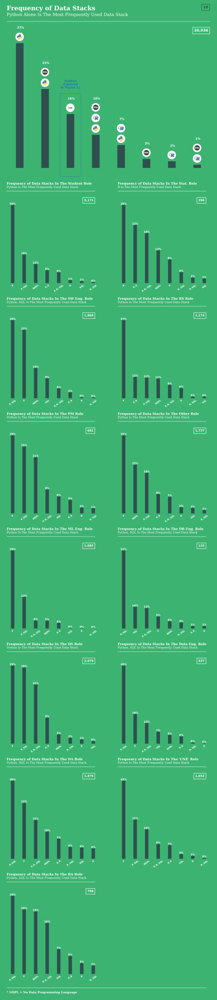

In [30]:
#Figure 10 Code
fig9 = plt.figure(figsize = (10, 50), facecolor = "mediumseagreen")
gs9 = gs.GridSpec(nrows = 17, ncols = 2, height_ratios=([0.7,5, 0.5, 3, 0.5, 3, 0.5, 3, 0.5, 3, 0.5, 3, 0.5, 3, 0.5, 3, 0.5]))

#ax1 - Main title
ax1 = plt.subplot(gs9[0, :2])

#Border Expansion
ax1.text(x = -0.02 , y = 0.5 , s = "Number of Surveyees in Each Role", color = "mediumseagreen", size = 17, weight = "bold", fontfamily = "serif")
ax1.text(x = 0.43 , y = 0.7 , s = "Number of Surveyees in Each Role", color = "mediumseagreen", size = 17, weight = "bold", fontfamily = "serif")

#Main Title and Subtitle
ax1.text(x = 0 , y = 0.6 , s = "Frequency of Data Stacks", color = "white", size = 17, weight = "bold", fontfamily = "serif")
ax1.text(x = 0 , y = 0.3 , s = "Python Alone Is The Most Frequently Used Data Stack", color = "white", size = 12, fontfamily = "serif")
ax1.axhline(y = 0, xmin = 0, xmax = 1, c = "white", alpha = 0.5, linewidth = 3)

#Adding Figure Number
ax1.text(x = 0.99, y = 0.7, s = "10", transform = ax1.transAxes, color = "darkslategrey", ha = "right", weight = "bold", bbox = dict(fc = "none", ec = "darkslategrey"))    

#Cosmetics
cosmetics(ax1, "both")
   
#ax2 - Main Graph 
ax2 = plt.subplot(gs9[1, :2])
combo_gen(ax2, "Student", main = True)

#Adding Images to the Main Graph
image_total_2(["Python"], -0.23, 7700, "37%")
image_total_2(["Python","SQL"], 0.77, 5100, "23%")
image_total_2(["None"], 1.77, 3679, "16%")
image_total_2(["Python","R","SQL"], 2.77, 2500, "10%")
image_total_2(["Python","R"], 3.77, 1920, "7%")
image_total_2(["SQL"], 4.77, 1130, "3%")
image_total_2(["R"], 5.77, 1000, "2%")
image_total_2(["R", "SQL"], 6.77, 800, "1%")

#Adding annotation to Graph
ax2.text(x = 2, y = 4500, s = "Further\nExplored\nIn Figure 11", color = "tab:blue", weight = "bold", size = 8, ha = "center")    
 
#ax3 - Title: Student
ax3 = plt.subplot(gs9[2, 0])
title_maker_9(ax3, "Student", "Python")

#ax4 - Title: Statistician
ax4 = plt.subplot(gs9[2, 1])
title_maker_9(ax4, "Stat.", "R")

#ax5 - Graph: Student
ax5 = plt.subplot(gs9[3, 0])
combo_gen(ax5, "Student")

    
#ax6 - Graph: Statistician
ax6 = plt.subplot(gs9[3, 1])
combo_gen(ax6, "Statistician")


#ax7 - Title: Software Engineer
ax7 = plt.subplot(gs9[4, 0])
title_maker_9(ax7, "SW Eng.", "Python, SQL")

#ax8 - Title: Research Scientist
ax8 = plt.subplot(gs9[4, 1])
title_maker_9(ax8, "RS", "Python")

#ax9 - Graph: Software Engineer
ax9 = plt.subplot(gs9[5, 0])
combo_gen(ax9, "Software Engineer")

#ax10 - Graph: Research Scientist
ax10 = plt.subplot(gs9[5, 1])
combo_gen(ax10, "Research Scientist")

#ax11 - Title: Product/Project Manager
ax11 = plt.subplot(gs9[6, 0])
title_maker_9(ax11, "PM", "Python")
    
#ax12 - Title: Other
ax12 = plt.subplot(gs9[6, 1])
title_maker_9(ax12, "Other", "Python")

#ax13 - Graph: Product/Project Manager
ax13 = plt.subplot(gs9[7, 0])
combo_gen(ax13, "Product/Project Manager")

#ax14 - Graph: Other
ax14 = plt.subplot(gs9[7, 1])
combo_gen(ax14, "Other")

#ax15 - Title: Machine Learning Engineer
ax15 = plt.subplot(gs9[8, 0])
title_maker_9(ax15, "ML Eng.", "Python")

#ax16 - Title: Database Engineer
ax16 = plt.subplot(gs9[8, 1])
title_maker_9(ax16, "DB Eng.", "Python, SQL")

#ax17 - Graph: Machine Learning Engineer
ax17 = plt.subplot(gs9[9, 0])
combo_gen(ax17, "Machine Learning Engineer")

#ax18 - Graph: Database Engineer
ax18 = plt.subplot(gs9[9, 1])
combo_gen(ax18, "Database Engineer")


#ax19 - Title: Data Scientist
ax19 = plt.subplot(gs9[10, 0])
title_maker_9(ax19, "DS", "Python")
    
#ax20 - Title: Data Engineer
ax20 = plt.subplot(gs9[10, 1])
title_maker_9(ax20, "Data Eng.", "Python, SQL")
    
#ax21  - Graph: Data Scientist
ax21 = plt.subplot(gs9[11, 0])
combo_gen(ax21, "Data Scientist")

#ax22 - Graph: Data Engineer
ax22 = plt.subplot(gs9[11, 1])
combo_gen(ax22, "Data Engineer")

#ax23 - Title: Data Analyst
ax23 = plt.subplot(gs9[12, 0])
title_maker_9(ax23, "DA", "Python, SQL")

#ax24 - Title: CNE
ax24 = plt.subplot(gs9[12, 1])
title_maker_9(ax24, "'CNE'", "Python")

#ax25 - Graph: Data Analyst
ax25 = plt.subplot(gs9[13, 0])
combo_gen(ax25, "Data Analyst")

#ax26 - Graph: CNE
ax26 = plt.subplot(gs9[13, 1])
combo_gen(ax26, "Currently not employed")

#ax27 - Title: Business Analyst
ax27 = plt.subplot(gs9[14, 0])
title_maker_9(ax27, "BA", "Python, SQL")

#ax28 - Title: Blank
ax28 = plt.subplot(gs9[14, 1])

cosmetics(ax28, "both")   
    
#ax29 - Graph: Business Analyst
ax29 = plt.subplot(gs9[15, 0])
combo_gen(ax29, "Business Analyst")

#ax30 - Graph: Blank
ax30 = plt.subplot(gs9[15, 1])

cosmetics(ax30, "both")

#Ax31 - Legend
ax31 = plt.subplot(gs9[16, :2])

ax31.axhline(y = 0.7, xmin = 0, xmax = 0.98, c = "white", alpha = 0.5, linewidth = 1.5)

ax31.text(x = 0, y = 0.3, s = "* NDPL = No Data Programming Language", color = "white", weight = "bold", size = 8, fontfamily = "serif")

#Cosmetics
cosmetics(ax31, "both")

#Adding dotted box arounnd None
fig9.patches.extend([plt.Rectangle((0.328,0.748),0.08,0.063,
                                  fill=False, edgecolor='tab:blue', ls = "--", zorder=1,
                                  transform=fig9.transFigure, figure=fig9)])

plt.show()

In [31]:
#Figure 11 Subplot Code
def row_addition(x):
    cleaned_row_sum = []
    row_sum = []
    for row in x:
        row_sum.append(row)
    for x in row_sum:
        if str(x) != "nan":
            cleaned_row_sum.append(x)
    
    return cleaned_row_sum

def row_combos(row):
    combo_list = []
    for element in row:
        combo_list.append(element)

    flat_list = []
    for element in combo_list:
        if isinstance(element, list):
            for thing in element:
                flat_list.append(thing)
        else:
            flat_list.append(element)

    final_list = []
    for element in flat_list:
        if element not in  ["No / None", "None"]:
            final_list.append(element)

    return final_list

def combo_cleaner(row):
    cleaned_combo = []
    combo = row.split(",")
    for tool in combo:
        cleaned_combo.append(tool.strip())
    
    return cleaned_combo

def none_analyzer(role):
    
    survey_data_copy = survey_data.copy()
    
    #Preparing the Data
    role_data = survey_data_copy[survey_data_copy["Q5"] == role]

    data_combo_list = []
    
    #Creating the Data Stack Combo list for each row
    for index, row in role_data.iterrows():
        combo = []
        cleaned_combo = []
        python = row["Q7_Part_1"]
        R = row["Q7_Part_2"]
        SQL = row["Q7_Part_3"]
        combo.append(python)
        combo.append(R)
        combo.append(SQL)

        for x in combo:
            if str(x) != "nan":
                cleaned_combo.append(x)
        data_combo_list.append(cleaned_combo)
    
    #Creating a combo list columna and colapsing the list
    role_data["data_combo"] = data_combo_list
    role_data["data_combo"] = role_data["data_combo"].apply(lambda x : ",".join(x) if len(x) != 0 else "none")
    
    #Isolating the surveyees who use none of the languages in the Data Stack
    role_data_no_lang = role_data[role_data["data_combo"] == "none"]
    
    #Creating a DF of combo related information for the "non_code_grapher" function to use as an input
    combos_df = pd.DataFrame()

    for number in ["27", "28", "29", "31", "34", "35", "38"]:
        if number == "38":
            combos_df["Q38"] = role_data_no_lang["Q38"].fillna("None")
        else:
            combos_df["Q{}_combo".format(number)] = role_data_no_lang.loc[:, "Q{}_A_Part_1".format(number) : "Q{}_A_OTHER".format(number)].apply(row_addition, axis =1)
    
    combos_df["all_combo"] = combos_df.apply(row_combos, axis = 1)
    combos_df["all_combo"] = combos_df["all_combo"].apply(lambda x : ",".join(x))
    combos_df["all_combo"] = combos_df["all_combo"].apply(combo_cleaner)
    combos_df["combo_number"] = combos_df["all_combo"].apply(lambda x : "YES" if "" in x else "NO")

    return combos_df

def non_code_grapher(ax, role):
    
    #Creating a Dictionary to store role and their respective surveyees who dont use a Data Stack Language
    no_data_langs = {}

    for role_name in survey_data_copy["Q5"].unique():
        no_data_langs[role_name] = none_analyzer(role)
  
    #Gathering the Top 3 non data lang tools and summing the rest up
    top_3_non_data_lang_tools = {}
    
    sums = None
    
    for role_name, df in no_data_langs.items():
        unique_tools = {}
        for tool_list in df["all_combo"]:
            for tool in tool_list:
                if tool not in unique_tools:
                    unique_tools[tool] = 1
                else:
                    unique_tools[tool] += 1
        
        
        unique_tools = pd.Series(unique_tools).sort_values(ascending = False)
        index = list(unique_tools[:3].index.map(lambda x : "None" if x == "" else x)) + ["Rest"]
        unique_tools = pd.DataFrame(unique_tools[:3].append(pd.Series(unique_tools[3:].sum())))
        unique_tools.index = index
        top_3_non_data_lang_tools[role_name] = unique_tools
        
        if sums == None:
            sums = unique_tools[0].sum()
        else:
            continue
      
    #Graphing the Data
    ax.bar([label.replace(" ", "\n").title() for label in top_3_non_data_lang_tools[role].index], top_3_non_data_lang_tools[role][0], color = [[0.1843137254901961, 0.30980392156862746, 0.30980392156862746, 1.0],
       [0.1843137254901961, 0.30980392156862746, 0.30980392156862746, 1.0],
       [0.1843137254901961, 0.30980392156862746, 0.30980392156862746, 1.0],
       [0.1843137254901961, 0.30980392156862746, 0.30980392156862746, 0.3]])
    
    #Adding the Totals and the Percentages for each non data lang tool
    x = 0    
    for total in top_3_non_data_lang_tools[role][0]:
        ax.text(x = x , y = total, s = str(total), color = "white", weight = "bold", size = 7, va = "bottom", ha = "center")
        ax.text(x = x , y = total + (ax.get_ylim()[1]*0.05), s = str(int((int(total) / sums) * 100)) + "%" , color = "darkslategrey", weight = "bold", size = 7, va = "bottom", ha = "center")

        x += 1
    
    #Adding the Totals to the graphs
    ax.text(x = ax.get_xlim()[1] - 0.06, y = ax.get_ylim()[1] + (ax.get_ylim()[1] * 0.2), s = sums, color = "white", weight = "bold", size = 8, ha = "right", bbox = dict(facecolor = "none", edgecolor = "white"))    

    ax.set_xticklabels([label.replace(" ", "\n").title() for label in top_3_non_data_lang_tools[role].index], fontsize = 6, weight = "bold", color = "white")
    

    #Cosmetics
    cosmetics(ax, "y")
    
    bbax = ax.get_position()
    bbax.y0 += 0.009411064559
    bbax.y1 -= 0.01
    ax.set_position(bbax)
    
    
def title_maker_10(ax, role):
    
    ax.text(x = 0 , y = 0.3, s = str(role), color = "white", size = 10, fontfamily = "serif", weight = "bold")
    ax.axhline(y = 0 , xmin = 0 , xmax = 1, c = "white", alpha = 0.5, linewidth = 3)
    
    #Cosmetics
    cosmetics(ax, "both")

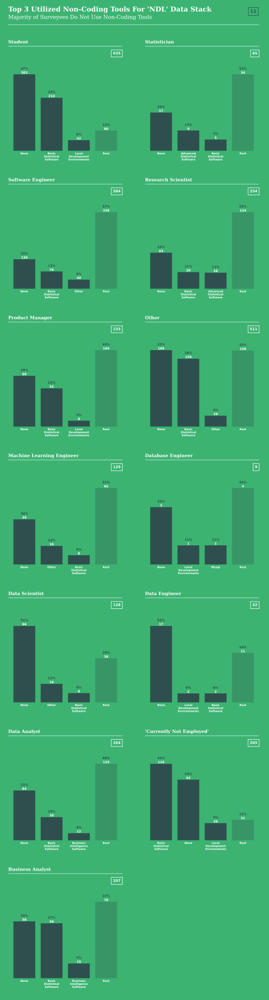

In [32]:
#Figure 11 Code
fig10 = plt.figure(figsize = (10, 40), facecolor = "mediumseagreen")
gs10 = gs.GridSpec(nrows = 15, ncols = 2, height_ratios=([0.35,0.3,3,0.3,3,0.3,3,0.3,3,0.3,3,0.3,3,0.3,3]))

#ax1 - Main title
ax1 = plt.subplot(gs10[0, :2])

#Border Expansion
ax1.text(x = -0.02 , y = 1.3 , s = "Top 3 Non-Coding Tools Used in Each Role" , color = "mediumseagreen", size = 17, weight = "bold", fontfamily = "serif")
ax1.text(x = 0.3 , y = 0.3 , s = "Top 3 Non-Coding Tools Used in Each Role" , color = "mediumseagreen", size = 17, weight = "bold", fontfamily = "serif")

#Main Title and Subtitle
ax1.text(x = 0 , y = 1.1, s = "Top 3 Utilized Non-Coding Tools For 'NDL' Data Stack " , color = "white", size = 15, weight = "bold", fontfamily = "serif")
ax1.text(x = 0 , y = 0.5, s = "Majority of Surveyees Do Not Use Non-Coding Tools", size = 12, fontfamily = "serif", color = "white")
ax1.axhline(y = 0, xmin = 0, xmax = 1, c = "white", alpha = 0.5, linewidth = 3)

#Adding Figure Number to the Graph
ax1.text(x = 0.99, y = 1, s = "11", transform = ax1.transAxes, color = "darkslategrey", ha = "right", weight = "bold", bbox = dict(fc = "none", ec = "darkslategrey"))    

#Cosmetics
cosmetics(ax1, "both")

#ax2 - Title: Student
ax2 = plt.subplot(gs10[1, 0])
title_maker_10(ax2, "Student")

#ax3 - Title: Statistician
ax3 = plt.subplot(gs10[1, 1])
title_maker_10(ax3, "Statistician")

#ax4 - Graph: Student
ax4 = plt.subplot(gs10[2, 0], zorder = 2)
non_code_grapher(ax4, "Student")

    
#ax5 - Graph: Statistician
ax5 = plt.subplot(gs10[2, 1], zorder = 2)
non_code_grapher(ax5, "Statistician")

#ax6 - Title: Software Engineer
ax6 = plt.subplot(gs10[3, 0])
title_maker_10(ax6, "Software Engineer")


#ax7 - Title: Research Scientist
ax7 = plt.subplot(gs10[3, 1])
title_maker_10(ax7, "Research Scientist")

#ax8 - Graph: Software Engineer
ax8 = plt.subplot(gs10[4, 0], zorder = 2)
non_code_grapher(ax8, "Software Engineer")

#ax9 - Graph: Research Scientist
ax9 = plt.subplot(gs10[4, 1], zorder = 2)
non_code_grapher(ax9, "Research Scientist")

#ax10 Title: Product/Project Manager
ax10 = plt.subplot(gs10[5, 0])
title_maker_10(ax10, "Product Manager")

#ax11 - Title: Other
ax11 = plt.subplot(gs10[5, 1])
title_maker_10(ax11, "Other")
    
#ax12 - Graph: Product/Project Manager
ax12 = plt.subplot(gs10[6, 0], zorder = 2)
non_code_grapher(ax12, "Product/Project Manager")

#ax13 - Graph: Other
ax13 = plt.subplot(gs10[6, 1], zorder = 2)
non_code_grapher(ax13, "Other")

#ax14 - Title: Machine Learning Engineer
ax14 = plt.subplot(gs10[7, 0])
title_maker_10(ax14, "Machine Learning Engineer")

#ax15 - Title: Database Engineer
ax15 = plt.subplot(gs10[7, 1])
title_maker_10(ax15, "Database Engineer")


#ax16 - Graph: Machine Learning Engineer
ax16 = plt.subplot(gs10[8, 0], zorder = 2)
non_code_grapher(ax16, "Machine Learning Engineer")

#ax17 - Graph: Database Engineer
ax17 = plt.subplot(gs10[8, 1], zorder = 2)
non_code_grapher(ax17, "Database Engineer")

#ax18 - Title: Data Scientist
ax18 = plt.subplot(gs10[9, 0])
title_maker_10(ax18, "Data Scientist")


#ax19 - Title: Data Engineer
ax19 = plt.subplot(gs10[9, 1])
title_maker_10(ax19, "Data Engineer")
    
#ax20 - Graph: Data Scientist
ax20 = plt.subplot(gs10[10, 0], zorder = 2)
non_code_grapher(ax20, "Data Scientist")
    
#ax21  - Graph: Data Engineer
ax21 = plt.subplot(gs10[10, 1], zorder = 2)
non_code_grapher(ax21, "Data Engineer")

#ax22 - Title: Data Analyst
ax22 = plt.subplot(gs10[11, 0])
title_maker_10(ax22, "Data Analyst")

#ax23 - Title: Unemployed
ax23 = plt.subplot(gs10[11, 1])
title_maker_10(ax23, "'Currently Not Employed'")

#ax24 - Graph: Data Analyst
ax24 = plt.subplot(gs10[12, 0], zorder = 2)
non_code_grapher(ax24, "Data Analyst")

#ax25 - Graph: CNE
ax25 = plt.subplot(gs10[12, 1], zorder = 2)
non_code_grapher(ax25, "Currently not employed")

#ax26 - Title: Business Analyst
ax26 = plt.subplot(gs10[13, 0])
title_maker_10(ax26, "Business Analyst")

#ax27 - Title:
ax27 = plt.subplot(gs10[13, 1])

#Cosmetics
cosmetics(ax27, "both")

#ax28 - Graph: Business Analyst
ax28 = plt.subplot(gs10[14, 0], zorder = 2)
non_code_grapher(ax28, "Business Analyst")
    
#ax29 - Graph: 
ax29 = plt.subplot(gs10[14, 1], zorder = 2)

ax29.text(x = 0, y = -0.05, s = "extender", color = "mediumseagreen", size = 12)

#Cosmetics
cosmetics(ax29, "both")

plt.show()

>#### Figure 10 & 11 Analysis
>- Most roles prefer to use data stacks of only Python or Python and SQL.
>- 47% of Research Scientists use the Python data stack, while the remaining data stacks only receive a maximum frequency of 12%.
>- Similarly, Machine Learning Engineers exhibit a strong dependency a two data stacks: Python data stack (59%) and Python and SQL (23%).
>- The R and SQL data stack is used the least with its frequency not surpassing 1% across all roles.
>- 16% of surveyees do not use any of the data stacks and instead, use other tools for their analysis.
>- Those who do not use any of the data stacks, generally use basic statistical software such as Microsoft Excel and Google Sheets. Business Analysts and Project Managers use basic statistical software the most with respective frequencies of 27% and 22%.
>- Statisticians and Research Scientists are the sole users of advanced statistical software (SPSS and SAS) with respective frequencies of 13% and 11%.

### Roles vs. Programming Experience

In [33]:
#Figure 12 Subplot Code
def proportional(ax, role):
    
    survey_data_copy = survey_data.copy()
    
    #Calculating the proportions of Years of Experience in the whole Dataframe
    survey_data_prop = pd.DataFrame(survey_data_copy["Q6"].value_counts() / survey_data_copy.shape[0])
    
    #Calculating the proportions of Years of Experience in the whole Dataframe
    role_data = survey_data_copy[survey_data_copy["Q5"] == role]
    role_data_prop = pd.DataFrame(role_data["Q6"].value_counts() / role_data["Q6"].shape[0])
    
    #Combing both DFs and adding proprtional difference and color column
    combined = pd.merge(left = survey_data_prop, right = role_data_prop, left_index = True, right_index = True, suffixes = ("_survey","_{}".format(role)))
    combined["prop_diff"] = combined["Q6_survey"] - combined["Q6_{}".format(role)]
    combined["color"] = combined["prop_diff"].apply(lambda x : "tab:red" if "-" in str(x) else "tab:blue")
    combined = combined.reindex(["never written code", "< 1", "1-2", "3-5", "5-10", "10-20", "20+"])

    #Converting the color to rgba format
    color = [matplotlib.colors.to_rgba(color, alpha=None) for color in combined["color"]]
    
    #Graphing the Data
    ax.bar(combined.index, combined["prop_diff"], color = color)
    
    #Adding the Proprtional differnces
    increment = 0
    for diff in combined["prop_diff"]:
        if diff > 0:
            ax.text(x = increment, y = diff, s = str(round(diff * 100)) + "%", color = "white", size = 8, weight = "bold", ha = "center", va = "bottom")
        else:
            ax.text(x = increment, y = diff, s = str(round(diff * 100)) + "%", color = "white", size = 8, weight = "bold", ha = "center", va = "top")
        increment += 1
    
        
    ax.set_xticklabels(["NWC", "< 1", "1 - 2", "3 - 5", "5 - 10", "10 - 20", "20+"], color = "white", weight = "bold", size = 7, rotation = 35)     
    
    #Cosmetics
    cosmetics(ax, "y")
    
    bbax = ax.get_position()
    bbax.y0 += 0.004411064559
    ax.set_position(bbax)
    
def title_maker_11(ax, role, YOE, perc, diff):
    
    ax.text(x = 0 , y = 0.5 , s = "Proportional Difference of YOPE in the\n{} Role".format(role), color = "white", weight = "bold", size = 9.8, fontfamily = "serif" )
    ax.text(x = 0, y = 0.2, s = "{} Years of Experience is {} By {}%".format(YOE, diff, perc), color = "white", size = 8.5, fontfamily = "serif")

    ax.axhline(y = 0, xmin = 0, xmax = 1, c = "white", alpha = 0.5, linewidth = 3)
    
    #Cosmetics
    cosmetics(ax, "both")


>#### Figure 12 Description
>This figure shows the proportional difference in “years of programming experience” (YOPE) between roles and the dataset averages.

>The **aim** of this figure is to explore how demanding certain roles are in regards to programming experience compared to the dataset average.

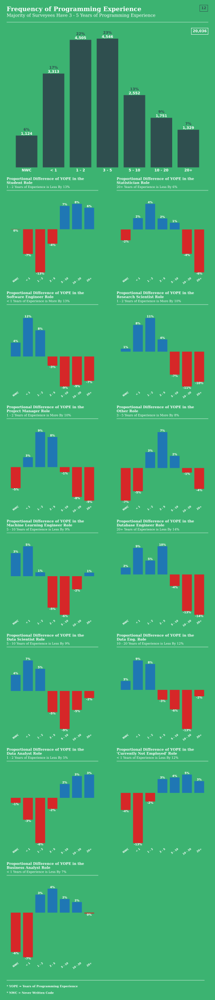

In [34]:
#Figure 12 Code
fig11 = plt.figure(figsize = (10, 50), facecolor = "mediumseagreen")
gs11 = gs.GridSpec(nrows = 17, ncols = 2, height_ratios=([0.7,5, 0.5, 3, 0.5, 3, 0.5, 3, 0.5, 3, 0.5, 3, 0.5, 3, 0.5, 3, 0.5]))

#ax1 - Main title
ax1 = plt.subplot(gs11[0, :2])

#Border Expansion
ax1.text(x = -0.02 , y = 0.5 , s = "Number of Surveyees in Each Role", color = "mediumseagreen", size = 17, weight = "bold", fontfamily = "serif")
ax1.text(x = 0.43, y = 0.8 , s = "Number of Surveyees in Each Role", color = "mediumseagreen", size = 17, weight = "bold", fontfamily = "serif")

#Adding Title and Subtitle
ax1.text(x = 0 , y = 0.6 , s = "Frequency of Programming Experience", color = "white", size = 17, weight = "bold", fontfamily = "serif")
ax1.text(x = 0 , y = 0.3 , s = "Majority of Surveyees Have 3 - 5 Years of Programming Experience", color = "white", size = 12, fontfamily = "serif")
ax1.axhline(y = 0, xmin = 0, xmax = 1, c = "white", alpha = 0.5, linewidth = 3)

#Adding Figure Number
ax1.text(x = 0.99, y = 0.7, s = "12", transform = ax1.transAxes, color = "darkslategrey", ha = "right", weight = "bold", bbox = dict(fc = "none", ec = "darkslategrey"))    

#Cosmetics
cosmetics(ax1, "both")
    
#ax2 - Main Graph 
ax2 = plt.subplot(gs11[1, :2])

survey_data_copy = survey_data.copy()

#Calculating the proportions of Years of Experience in the whole Dataframe
survey_data_prop = pd.DataFrame(survey_data_copy["Q6"].value_counts() / survey_data_copy.shape[0])

#Adding the totals column
survey_data_prop["totals"] = survey_data["Q6"].value_counts()

#Reindeixing in order of Years of Experience
survey_data_prop = survey_data_prop.reindex(["never written code", "< 1", "1-2", "3-5", "5-10", "10-20", "20+"])

#Graphing the Data
ax2.bar(survey_data_prop.index, survey_data_prop["totals"], color = "darkslategrey")

ax2.set_xticklabels(["NWC", "< 1", "1 - 2", "3 - 5", "5 - 10", "10 - 20", "20+"], color = "white", weight = "bold", size = 10)

#Adding the totals and their percentages of the total of each Year of Experince range
increment = 0
for index, row in survey_data_prop.iterrows():
    ax2.text(x = increment, y = row["totals"], s = "{:,}".format(int(row["totals"])), color = "white", size = 10, weight = "bold", ha = "center", va = "bottom")
    ax2.text(x = increment, y = row["totals"] + (ax2.get_ylim()[1]*0.03), s = str(round(row["Q6"] * 100)) + "%", color = "darkslategrey", size = 10, weight = "bold", ha = "center", va = "bottom")

    increment += 1

#Adding total for for people who reprted their Years of Experience
ax2.text(x = ax2.get_xlim()[1] - 0.06, y = ax2.get_ylim()[1], s = "{:,}".format(survey_data_copy.shape[0]), color = "white", weight = "bold", size = 10, ha = "right", bbox = dict(facecolor = "none", edgecolor = "white"))    

#Cosmetics
cosmetics(ax2, "y")

#ax3 - Title: Student
ax3 = plt.subplot(gs11[2, 0])
title_maker_11(ax3, "Student", "1 - 2", "13", "Less")

#ax4 - Title: Statistician
ax4 = plt.subplot(gs11[2, 1])
title_maker_11(ax4, "Statistician", "20+", "6", "Less")

#ax5 - Graph: Student
ax5 = plt.subplot(gs11[3, 0])
proportional(ax5, "Student")
   
#ax6 - Graph: Statistician
ax6 = plt.subplot(gs11[3, 1])
proportional(ax6, "Statistician")

#ax7 - Title: Software Engineer
ax7 = plt.subplot(gs11[4, 0])
title_maker_11(ax7, "Software Engineer", "< 1", "13", "More")

#ax8 - Title: Research Scientist
ax8 = plt.subplot(gs11[4, 1])
title_maker_11(ax8, "Research Scientist", "1 - 2", "10", "More")

#ax9 - Graph: Software Engineer
ax9 = plt.subplot(gs11[5, 0])
proportional(ax9, "Software Engineer")

#ax10 - Graph: Research Scientist
ax10 = plt.subplot(gs11[5, 1])
proportional(ax10, "Research Scientist")

#ax11 - Title: Product/Project Manager
ax11 = plt.subplot(gs11[6, 0])
title_maker_11(ax11, "Project Manager", "1 - 2", "10", "More")
    
#ax12 - Title: Other
ax12 = plt.subplot(gs11[6, 1])
title_maker_11(ax12, "Other", "3 - 5", "8", "More")

#ax13 - Graph: Product/Project Manager
ax13 = plt.subplot(gs11[7, 0])
proportional(ax13, "Product/Project Manager")

#ax14 - Graph: Other
ax14 = plt.subplot(gs11[7, 1])
proportional(ax14, "Other")

#ax15 - Title: Machine Learning Engineer
ax15 = plt.subplot(gs11[8, 0])
title_maker_11(ax15, "Machine Learning Engineer", "5 - 10", "9", "Less")

#ax16 - Title: Database Engineer
ax16 = plt.subplot(gs11[8, 1])
title_maker_11(ax16, "Database Engineer", "20+", "14", "Less")

#ax17 - Graph: Machine Learning Engineer
ax17 = plt.subplot(gs11[9, 0])
proportional(ax17, "Machine Learning Engineer")

#ax18 - Graph: Database Engineer
ax18 = plt.subplot(gs11[9, 1])
proportional(ax18, "Database Engineer")

#ax19 - Title: Data Scientist
ax19 = plt.subplot(gs11[10, 0])
title_maker_11(ax19, "Data Scientist", "5 - 10", "9", "Less")
    
#ax20 - Title: Data Engineer
ax20 = plt.subplot(gs11[10, 1])
title_maker_11(ax20, "Data Eng.", "10 - 20", "12", "Less")
    
#ax21  - Graph: Data Scientist
ax21 = plt.subplot(gs11[11, 0])
proportional(ax21, "Data Scientist")

#ax22 - Graph: Data Engineer
ax22 = plt.subplot(gs11[11, 1])
proportional(ax22, "Data Engineer")

#ax23 - Title: Data Analyst
ax23 = plt.subplot(gs11[12, 0])
title_maker_11(ax23, "Data Analyst", "1 - 2", "5", "Less")

#ax24 - Title: CNE
ax24 = plt.subplot(gs11[12, 1])
title_maker_11(ax24, "'Currently Not Employed'", "< 1", "12", "Less")

#ax25 - Graph: Data Analyst
ax25 = plt.subplot(gs11[13, 0])
proportional(ax25, "Data Analyst")

#ax26 - Graph: CNE
ax26 = plt.subplot(gs11[13, 1])
proportional(ax26, "Currently not employed")

#ax27 - Title: Business Analyst
ax27 = plt.subplot(gs11[14, 0])
title_maker_11(ax27, "Business Analyst", "< 1", "7", "Less")    

#ax28 - Title: Blank
ax28 = plt.subplot(gs11[14, 1])

#Cosmetics
cosmetics(ax28, "both")

#ax29 - Graph: Business Analyst
ax29 = plt.subplot(gs11[15, 0])
proportional(ax29, "Business Analyst")

#ax30 - Graph: Blank
ax30 = plt.subplot(gs11[15, 1])

ax30.text(x = 0, y = -0.05, s = "extender", color = "mediumseagreen", size = 12)

#Cosmetics
cosmetics(ax30, "both")

#ax30 - Legend
ax31 = plt.subplot(gs11[16, :2])

ax31.axhline(y = 0.7, xmin = 0, xmax = 0.98, c = "white", alpha = 0.5, linewidth = 1.5)

ax31.text(x = 0, y = -0.5, s = "extender", color = "mediumseagreen", size = 12)

ax31.text(x = 0, y = -0.3, s = "* YOPE = Years of Programming Experience\n \n* NWC = Never Written Code", color = "white", weight = "bold", size = 8, fontfamily = "serif")

#Cosmetics
cosmetics(ax31, "both")

plt.show()

>#### Figure 12 Analysis
>- Proportionally, there is a 4% increase in Data Scientists and Software Engineers who have no programming experience - the largest increase in surveyees with no programming experience. Similarly, Data Engineers have a 3% increase in surveyees with no programming experience.
>- Conversely, Business Analysts have a proportional 6% frequency decrease in surveyees with no programming experience.
>- Software Engineers, Research Scientists, and Data Engineers have proportional increases between  8% and 12% for “< 1” and “1 -2” years of programming experience. Indicating the increased presence of surveyees early in the programming journey in these roles.
>- Data Analysts with less than 5 years of programming experience show proportional frequency decreases ranging from 1% (no programming experience) to 6% (1-2 years of programming experience). However, past 5 years of programming experience, the proportional frequency increases for all the intervals.
>- The opposite is seen amongst Software Engineers, Research Scientists, Database Engineers, Data Scientists, and Data Engineers. The first half of intervals in these roles show proportional frequency decreases, while the second halves show proportional frequency increases.

In [35]:
#Figure 13 Subplot Code
def midpoint_sal(x):
    if str(x) != "nan":
        split = x.split("-")
        midpoint = (int(split[0]) + int(split[1])) / 2
        return midpoint
    else:
        return x


def salary_comp(ax, role):
    survey_data_copy = survey_data.copy()
    
    role_data = survey_data_copy[survey_data_copy["Q5"] == role]
    
    #Splitting Data Into Males and Females
    male = role_data[role_data["Q2"] == "Man"]
    female = role_data[role_data["Q2"] == "Woman"]
    
    #Adding the Midpoint Salary for Both Males and Females
    male["midpoint_sal"] = male["Q24"].apply(midpoint_sal)
    female["midpoint_sal"] = female["Q24"].apply(midpoint_sal)
    
    #Creating Pivot Tables of of Years of Experience as Index and average salary as values
    exp_avg_male_sal = male.pivot_table("midpoint_sal", "Q6", aggfunc = np.mean)
    exp_avg_female_sal = female.pivot_table("midpoint_sal", "Q6", aggfunc = np.mean)
    
    #Combining the Males and Females Pivot Tables Together and adding Percent Differences
    combined = pd.merge(left = exp_avg_male_sal, right = exp_avg_female_sal, left_index = True, right_index = True, suffixes = ("_male", "_female")  )
    combined["diff"] = abs(combined["midpoint_sal_male"] - combined["midpoint_sal_female"])
    combined["lesser"] = combined.apply(lambda x : min([x["midpoint_sal_male"], x["midpoint_sal_female"]]), axis = 1)
    combined["perc_diff"] = round((combined["diff"] / combined["lesser"]) * 100, 2)
    combined["color"] = combined.apply(lambda x : "tab:blue" if x["midpoint_sal_male"] > x["midpoint_sal_female"] else "tab:red" , axis = 1)
    
    index_order = ["never written code", "< 1", "1-2", "3-5", "5-10", "10-20", "20+"]
    
    index_list = []
    
    for index in combined.index:
        x = index_order.index(index)
        index_list.append(x)
        
    index_list = sorted(index_list)
    
    index_list_2 = []
    
    for index in index_list:
        index_list_2.append(index_order[index])
    
    combined = combined.loc[index_list_2]
 
    
    #Graphing the Data
    ax.barh(combined.index, combined["midpoint_sal_male"], color = "tab:blue")
    ax.barh(combined.index, -combined["midpoint_sal_female"], color = "tab:red")

    ax.set_xlim([-400000, 400000])

    #Adding the totals for Males and Females and thier percent difference
    y = 0
    for index,row in combined.iterrows():
        ax.text(x = row["midpoint_sal_male"] + 10000 , y = y , s = "{:,}".format(int(row["midpoint_sal_male"])), color = "white", size = 8, weight = "bold")
        ax.text(x = -row["midpoint_sal_female"] - 10000, y = y , s = "{:,}".format(int(row["midpoint_sal_female"])), color = "white", size = 8, ha = "right", weight = "bold")
        ax.text(x = ax.get_xlim()[1] - (ax.get_xlim()[1] * 0.15) , y = y, s = "{:,}".format(int(row["perc_diff"])) + "%", color = row["color"], size = 8, weight = "bold")
        y += 1
    
 
    ax.set_yticklabels(combined.index.str.replace("never written code", "NWC"), color = "white", size = 8, weight = "bold")
    
    #Cosmetics
    cosmetics(ax, "x")
    
    if role in ["Statistician", "Research Scientist", "Other", "Database Engineer", "Data Engineer", "Business Analyst"]:
        bbax = ax.get_position()
        bbax.x0 = 0.17
        bbax.x1 = 0.45
        ax.set_position(bbax)
    else:
        bbax = ax.get_position()
        bbax.x0 = 0.595
        bbax.x1 = 0.87
        ax.set_position(bbax)
    
    
    
def title_maker_12(ax, role, gender, perc, YOE):
    ax.text(x = 0 , y = 0.3 , s = "Average Salaries of Males and Females In\nThe {} Role".format(role), color = "white", weight = "bold", size = 10, fontfamily = "serif" )
    ax.text(x = 0, y = 0.1, s = "{} Earn {}% More With {} YOPE".format(gender, perc, YOE), color = "white", size = 9, fontfamily = "serif")
 
    ax.axhline(y = 0, xmin = 0, xmax = 1, c = "white", alpha = 0.5, linewidth = 3)
    
    #Cosmetics
    cosmetics(ax, "both")

>#### Figure 13 Description
>This figure depicts the average salaries of males and females for each age interval in each role. 
The colored percentages represent salary percentage increases for either males or females, red for females, and blue for males.  

>The **aim** of this figure is to highlight that there are some instances where females earn more than males.

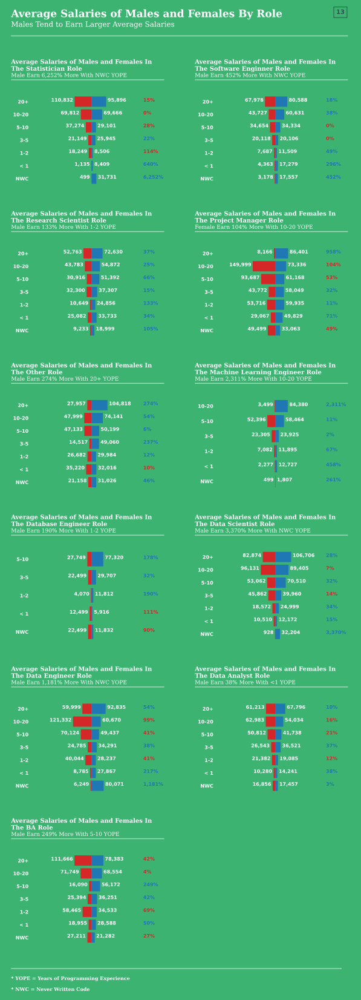

In [36]:
#Figure 13 Code
fig12 = plt.figure(figsize = (10, 30), facecolor = "mediumseagreen")
gs12 = gs.GridSpec(nrows = 14, ncols = 2, height_ratios=([1,1,3,1,3,1,3,1,3,1,3,1,3,1]))

#ax1 - Main title
ax1 = plt.subplot(gs12[0, :2])

#Border Expansion
ax1.text(x = -0.02 , y = 0.5 , s = "Average Salaries for Males and Females in Each Role" , color = "mediumseagreen", size = 17, weight = "bold", fontfamily = "serif")
ax1.text(x = 0.12 , y = 0.3 , s = "Average Salaries for Males and Females in Each Role" , color = "mediumseagreen", size = 17, weight = "bold", fontfamily = "serif")

#Title and Subtitle
ax1.text(x = 0 , y = 0.6 , s = "Average Salaries of Males and Females By Role" , color = "white", size = 17, weight = "bold", fontfamily = "serif")
ax1.text(x = 0 , y = 0.3  , s = "Males Tend to Earn Larger Average Salaries", size = 12, fontfamily = "serif", color = "white")

ax1.axhline(y = 0, xmin = 0, xmax = 1, c = "white", alpha = 0.5, linewidth = 3)

#Adding Figure Number
ax1.text(x = 0.99, y = 0.7, s = "13", transform = ax1.transAxes, color = "darkslategrey", ha = "right", weight = "bold", bbox = dict(fc = "none", ec = "darkslategrey"))    

#Cosmetics
cosmetics(ax1, "both")
    
#ax2 - Title: Statistician
ax2 = plt.subplot(gs12[1, 0])
title_maker_12(ax2, "Statistician", "Male", "6,252", "NWC")

#ax3 - Title: Software Engineer
ax3 = plt.subplot(gs12[1, 1])
title_maker_12(ax3, "Software Enginner", "Male", "452", "NWC")

#ax4 - Graph: Statistician
ax4 = plt.subplot(gs12[2, 0])
salary_comp(ax4, "Statistician")

#ax5 - Graph: Software Engineer
ax5 = plt.subplot(gs12[2, 1], zorder = 2)
salary_comp(ax5, "Software Engineer")

#ax6 - Title: Research Scientist
ax6 = plt.subplot(gs12[3, 0])
title_maker_12(ax6, "Research Scientist", "Male", "133", "1-2")

#ax7 - Title: Product/Project Manager
ax7 = plt.subplot(gs12[3, 1])
title_maker_12(ax7, "Project Manager", "Female", "104", "10-20")

#ax8 - Graph: Research Scientist
ax8 = plt.subplot(gs12[4, 0], zorder = 2)
salary_comp(ax8, "Research Scientist")

#ax9 - Graph: Product/Project Manager
ax9 = plt.subplot(gs12[4, 1], zorder = 2)
salary_comp(ax9, "Product/Project Manager")

#ax10 Title: Other
ax10 = plt.subplot(gs12[5, 0])
title_maker_12(ax10, "Other", "Male", "274", "20+")

#ax11 - Title: Machine Learning Engineer
ax11 = plt.subplot(gs12[5, 1])
title_maker_12(ax11, "Machine Learning Engineer", "Male", "2,311", "10-20")

#ax12 - Graph: Other
ax12 = plt.subplot(gs12[6, 0], zorder = 2)
salary_comp(ax12, "Other")

#ax13 - Graph: Machine Learning Engineer
ax13 = plt.subplot(gs12[6, 1], zorder = 2)
salary_comp(ax13, "Machine Learning Engineer")

#ax14 - Title: Database Engineer
ax14 = plt.subplot(gs12[7, 0])
title_maker_12(ax14, "Database Engineer", "Male", "190", "1-2")

#ax15 - Title: Data Scientist
ax15 = plt.subplot(gs12[7, 1])
title_maker_12(ax15, "Data Scientist", "Male", "3,370", "NWC")

#ax16 - Graph: Database Engineer
ax16 = plt.subplot(gs12[8, 0], zorder = 2)
salary_comp(ax16, "Database Engineer")

#ax17 - Graph: Data Scientist
ax17 = plt.subplot(gs12[8, 1], zorder = 2)
salary_comp(ax17, "Data Scientist")

#ax18 - Title: Data Engineer
ax18 = plt.subplot(gs12[9, 0])
title_maker_12(ax18, "Data Engineer", "Male", "1,181", "NWC")

#ax19 - Title: Data Analyst
ax19 = plt.subplot(gs12[9, 1])
title_maker_12(ax19, "Data Analyst", "Male", "38", "<1")

#ax20 - Graph: Data Engineer
ax20 = plt.subplot(gs12[10, 0], zorder = 2)
salary_comp(ax20, "Data Engineer")

#ax21  - Graph: Data Analyst
ax21 = plt.subplot(gs12[10, 1], zorder = 2)
salary_comp(ax21, "Data Analyst")

#ax22 - Title: Business Analyst
ax22 = plt.subplot(gs12[11, 0])
title_maker_12(ax22, "BA", "Male", "249", "5-10")

#ax23 - Title: Blank
ax23 = plt.subplot(gs12[11, 1])

#Cosmetics
cosmetics(ax23, "both")

#ax24 - Graph: Business Analyst
ax24 = plt.subplot(gs12[12, 0], zorder = 2)
salary_comp(ax24, "Business Analyst")

#ax25 - Graph: Blank
ax25 = plt.subplot(gs12[12, 1], zorder = 2)

#Cosmetics
cosmetics(ax25, "both")

#ax26 - Legend
ax26 = plt.subplot(gs12[13, :2])

ax26.axhline(y = 0.7, xmin = 0, xmax = 0.98, c = "white", alpha = 0.5, linewidth = 1.5)

ax26.text(x = 0, y = -0.1, s = "extender", color = "mediumseagreen", size = 12)

ax26.text(x = 0, y = 0, s = "* YOPE = Years of Programming Experience\n \n* NWC = Never Written Code", color = "white", weight = "bold", size = 8, fontfamily = "serif")

#Cosmetics
cosmetics(ax26, "both")

plt.show()

>#### Figure 13 Analysis
>- Research Scientists and Machine Learning Engineers earn more across all intervals of programming experience. Most notably, Male Machine Learning Engineers with 10-20 years of programming experience earn 2311% more than female Machine Learning Engineers. 
>- Surprisingly, female Project Managers with 10-20 years of programming experience earn 104% more than male Project Managers. 
>- Similarly, female Data Engineers with 10-20 years of programming experience and female Database Engineers with less than 1 year of programming experience respectively earn 99% and 111% more than their male counterparts.
>- Interestingly, females earn more than males for the majority of programming experience intervals in the Business Analyst role - the largest being a 69% salary increase in the 1-2 years of programming experience interval.

### Roles vs. Visualization Tools

In [37]:
#Figure 14 Subplot Code
def viz_tool_grapher(ax, role):
    
    survey_data_copy = survey_data.copy()
    
    #Preparing Data to get the totals for each Visual Libaray
    role_data = survey_data_copy[survey_data_copy["Q5"] == role]
    role_viz_tools = role_data.loc[:, "Q14_Part_1" : "Q14_OTHER"]
    role_viz_tools = role_viz_tools[["Q14_Part_1", "Q14_Part_2", "Q14_Part_3", "Q14_Part_4", "Q14_Part_5", "Q14_Part_6", "Q14_Part_7", "Q14_Part_8", "Q14_Part_9", "Q14_Part_10", "Q14_OTHER", "Q14_Part_11" ]]
    role_viz_tools["Q14_Part_11"] = role_viz_tools.loc[:, "Q14_Part_1" : "Q14_OTHER"].apply(lambda x : "None" if x.isnull().all() else np.nan, axis = 1)
    role_viz_tools.columns = ["Matplotlib", "Seaborn", "Plotly", "GGplot", "Shiny", "D3_js", "Altair", "Bokeh", "Geoplotlib", "Folium", "Other", "None"]
    
    role_viz_tools_sums = role_viz_tools.count().sort_values(ascending = False)
    
    #Graphing the Data
    ax.bar(role_viz_tools_sums.index, role_viz_tools_sums, color = "darkslategrey")
    
    ax.set_xticklabels(role_viz_tools_sums.index, weight = "bold", color = "white", size = 6, rotation = 45)
    
    #Adding the Percentages of the total role for each Visual Library
    x = 0
    for total in role_viz_tools_sums:
        ax.text(x = x, y = total, s = str(int((total/role_data.shape[0]) * 100)) + "%", color = "white", size = 6, weight = "bold", ha = "center", va = "bottom")
        x+=1
    
    #Adding the Total number of the role that use a Visual Library
    ax.text(x = ax.get_xlim()[1] - 0.25, y = ax.get_ylim()[1], s = "{:,}".format(role_data.shape[0]), color = "white", weight = "bold", size = 8, ha = "right", bbox = dict(facecolor = "none", edgecolor = "white"))    

    #Cosmetics
    cosmetics(ax, "y")
    
    bbax = ax.get_position()
    bbax.y0 += 0.009411064559
    ax.set_position(bbax)
        
def title_maker_13(ax, role, pop):

    ax.text(x = 0 ,y = 0.4 ,s = "Frequency of Viz. Libraries In The\n{} Role".format(role), color = "white", weight = "bold", size = 10, fontfamily = "serif")
    ax.text(x = 0, y = 0.15, s = "{} Is The Most Visualization Library".format(pop), size = 9, fontfamily = "serif", color = "white")

    ax.axhline(y = 0, xmin  = 0 , xmax = 1, c = "white", alpha = 0.5, linewidth = 3)
    
    #Cosmetics
    cosmetics(ax, "both")
    

>#### Figure 14 Description
>This figure depicts the frequency of visualization libraries used in each role. Surveyees who did not respond to Q14 (What data visualization libraries or tools do you use on a regular basis?) were included in the “None” category.

>#### Figure 15 Description
>This graph is an extension of figure 14 and shows the 3 most popular BI tools used amongst surveyees who do not use a visualization library.

>The **aim** of these figures is to explore the preferred method of visualization in each role.

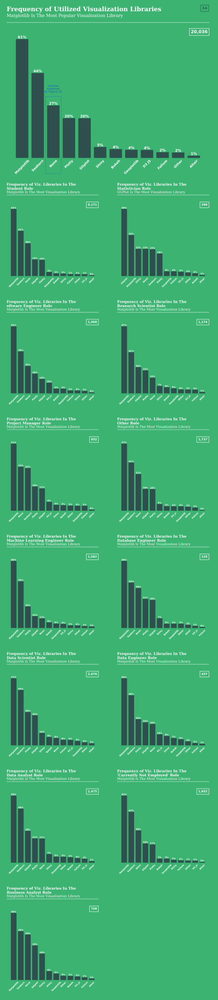

In [38]:
#Figure 14 Code
fig13 = plt.figure(figsize = (10, 50), facecolor = "mediumseagreen")
gs13 = gs.GridSpec(nrows = 16, ncols = 2, height_ratios=([0.7,5, 0.5, 3, 0.5, 3, 0.5, 3, 0.5, 3, 0.5, 3, 0.5, 3, 0.5, 3]))

#ax1 - Main title
ax1 = plt.subplot(gs13[0, :2])

#Border Extension
ax1.text(x = -0.02 , y = 0.5 , s = "Number of Surveyees in Each Role", color = "mediumseagreen", size = 17, weight = "bold", fontfamily = "serif")
ax1.text(x = 0.44 , y = 0.8 , s = "Number of Surveyees in Each Role", color = "mediumseagreen", size = 17, weight = "bold", fontfamily = "serif")

#Main Title and Subtitle
ax1.text(x = 0 , y = 0.6 , s = "Frequency of Utilized Visualization Libraries", color = "white", size = 17, weight = "bold", fontfamily = "serif")
ax1.text(x = 0 , y = 0.3 , s = "Matplotlib Is The Most Popular Visualization Library", color = "white", size = 12, fontfamily = "serif")

ax1.axhline(y = 0, xmin = 0, xmax = 1, c = "white", alpha = 0.5, linewidth = 3)

#Adding Figure Number
ax1.text(x = 0.99, y = 0.7, s = "14", transform = ax1.transAxes, color = "darkslategrey", ha = "right", weight = "bold", bbox = dict(fc = "none", ec = "darkslategrey"))    

#Cosmetics
cosmetics(ax1, "both")

#ax2 - Main Graph 
ax2 = plt.subplot(gs13[1, :2])

survey_data_copy = survey_data.copy()

#Preparing Data to get the totals for each Visual Libaray
viz_tools = survey_data.loc[:, "Q14_Part_1" : "Q14_OTHER"]
viz_tools = viz_tools[["Q14_Part_1", "Q14_Part_2", "Q14_Part_3", "Q14_Part_4", "Q14_Part_5", "Q14_Part_6", "Q14_Part_7", "Q14_Part_8", "Q14_Part_9", "Q14_Part_10", "Q14_OTHER", "Q14_Part_11" ]]
viz_tools["Q14_Part_11"] = viz_tools.loc[:, "Q14_Part_1" : "Q14_OTHER"].apply(lambda x : "None" if x.isnull().all() else np.nan, axis = 1)
viz_tools.columns = ["Matplotlib", "Seaborn", "Plotly", "GGplot", "Shiny", "D3 JS", "Altair", "Bokeh", "Geoplotlib", "Folium", "Other", "None"]

viz_tool_sums = viz_tools.count().sort_values(ascending = False)

#Graphing the Data
ax2.bar(viz_tool_sums.index, viz_tool_sums, color = "darkslategrey")

#Adding the Percentages of the total of the Visual Libraries
x = 0
for total in viz_tool_sums:
    ax2.text(x = x, y = total, s = str(int((total/survey_data_copy.shape[0]) * 100)) + "%", color = "white", size = 10, weight = "bold", ha = "center", va = "bottom")
    x+=1

ax2.set_xticklabels(viz_tool_sums.index, color = "white", weight = "bold", size = 9, rotation = 45)

#Adding Total Surveyees in Data Set
ax2.text(x = ax2.get_xlim()[1] - 0.1, y = ax2.get_ylim()[1], s = "{:,}".format(survey_data_copy.shape[0]), color = "white", weight = "bold", size = 12, ha = "right", bbox = dict(facecolor = "none", edgecolor = "white"))    

#Adding Annotation
ax2.text(x = 2, y = 6800, s = "Further\nExplored\nIn Figure 15", color = "tab:blue", weight = "bold", size = 7, ha = "center")    

#Cosmetics
cosmetics(ax2, "y")

bbax = ax2.get_position()
bbax.y0 += 0.01
ax2.set_position(bbax)

#ax3 - Title: Student
ax3 = plt.subplot(gs13[2, 0])
title_maker_13(ax3, "Student", "Matplotlib")

#ax4 - Title: Statistician
ax4 = plt.subplot(gs13[2, 1])
title_maker_13(ax4, "Statistician", "GGPlot")

#ax5 - Graph: Student
ax5 = plt.subplot(gs13[3, 0])
viz_tool_grapher(ax5, "Student")

#ax6 - Graph: Statistician
ax6 = plt.subplot(gs13[3, 1])
viz_tool_grapher(ax6, "Statistician")

#ax7 - Title: Software Engineer
ax7 = plt.subplot(gs13[4, 0])
title_maker_13(ax7, "oftware Engineer", "Matplotlib")

#ax8 - Title: Research Scientist
ax8 = plt.subplot(gs13[4, 1])
title_maker_13(ax8, "Research Scientist", "Matplotlib")

#ax9 - Graph: Software Engineer
ax9 = plt.subplot(gs13[5, 0])
viz_tool_grapher(ax9, "Software Engineer")

#ax10 - Graph: Research Scientist
ax10 = plt.subplot(gs13[5, 1])
viz_tool_grapher(ax10, "Research Scientist")

#ax11 - Title: Product/Project Manager
ax11 = plt.subplot(gs13[6, 0])
title_maker_13(ax11, "Project Manager", "Matplotlib")
    
#ax12 - Title: Other
ax12 = plt.subplot(gs13[6, 1])
title_maker_13(ax12, "Other", "Matplotlib")

#ax13 - Graph: Product/Project Manager
ax13 = plt.subplot(gs13[7, 0])
viz_tool_grapher(ax13, "Product/Project Manager")

#ax14 - Graph: Other
ax14 = plt.subplot(gs13[7, 1])
viz_tool_grapher(ax14, "Other")

#ax15 - Title: Machine Learning Engineer
ax15 = plt.subplot(gs13[8, 0])
title_maker_13(ax15, "Machine Learning Engineer", "Matplotlib")

#ax16 - Title: Database Engineer
ax16 = plt.subplot(gs13[8, 1])
title_maker_13(ax16, "Database Engineer", "Matplotlib")

#ax17 - Graph: Machine Learning Engineer
ax17 = plt.subplot(gs13[9, 0])
viz_tool_grapher(ax17, "Machine Learning Engineer")

#ax18 - Graph: Database Engineer
ax18 = plt.subplot(gs13[9, 1])
viz_tool_grapher(ax18, "Database Engineer")

#ax19 - Title: Data Scientist
ax19 = plt.subplot(gs13[10, 0])
title_maker_13(ax19, "Data Scientist", "Matplotlib")
    
#ax20 - Title: Data Engineer
ax20 = plt.subplot(gs13[10, 1])
title_maker_13(ax20, "Data Engineer", "Matplotlib")
    
#ax21  - Graph: Data Scientist
ax21 = plt.subplot(gs13[11, 0])
viz_tool_grapher(ax21, "Data Scientist")

#ax22 - Graph: Data Engineer
ax22 = plt.subplot(gs13[11, 1])
viz_tool_grapher(ax22, "Data Engineer")

#ax23 - Title: Data Analyst
ax23 = plt.subplot(gs13[12, 0])
title_maker_13(ax23, "Data Analyst", "Matplotlib")

#ax24 - Title: CNE
ax24 = plt.subplot(gs13[12, 1])
title_maker_13(ax24, "'Currently Not Employed'", "Matplotlib")

#ax25 - Graph: Data Analyst
ax25 = plt.subplot(gs13[13, 0])
viz_tool_grapher(ax25, "Data Analyst")

#ax26 - Graph: CNE
ax26 = plt.subplot(gs13[13, 1])
viz_tool_grapher(ax26, "Currently not employed")

#ax27 - Title: Business Analyst
ax27 = plt.subplot(gs13[14, 0])
title_maker_13(ax27, "Business Analyst", "Matplotlib")

#ax28 - Title: Blank
ax28 = plt.subplot(gs13[14, 1])

#Cosmetics
cosmetics(ax28, "both")
    
#ax29 - Graph: Business Analyst
ax29 = plt.subplot(gs13[15, 0])
viz_tool_grapher(ax29, "Business Analyst")

#ax30 - Graph: Blank
ax30 = plt.subplot(gs13[15, 1])

#Border Expansion
ax30.text(x = 0, y = -0.05, s = "extender", color = "mediumseagreen", size = 12)

#Cosmetics
cosmetics(ax30, "both")

#Adding box for Annotation
fig13.patches.extend([plt.Rectangle((0.274,0.75),0.06,0.059,
                                  fill = False, edgecolor = 'tab:blue', ls = "--", zorder = 1,
                                  transform = fig13.transFigure, figure = fig13)])

plt.show()

In [39]:
#Figure 15 Subplot Code
def row_addition(x):
    cleaned_row_sum = []
    row_sum = []
    for row in x:
        row_sum.append(row)
    for x in row_sum:
        if str(x) != "nan":
            cleaned_row_sum.append(x)
    
    return cleaned_row_sum

def none_analyzer_2(ax, role):
    
    survey_data_copy = survey_data.copy()
    
    #Gathering the Surveyees who Listed None as for Q14
    role_data = survey_data_copy[survey_data_copy["Q5"] == role]
    role_data["No Answer"] = role_data.loc[:, "Q14_Part_1" : "Q14_OTHER"].apply(lambda x : True if x.isnull().all() else False, axis = 1)
    role_data_none_viz = role_data[(role_data["Q14_Part_11"] == "None") | (role_data["No Answer"] == True)]#Here we would add the "empty" column and filter thorugh that columnas aswell
    
    #Creating a column for the combination of bi_tools used
    role_data_none_viz["bi_combos"] = role_data_none_viz.loc[:, "Q31_A_Part_1" : "Q31_A_OTHER"].apply(row_addition, axis = 1)
    role_data_none_viz["bi_combos"] = role_data_none_viz["bi_combos"].apply(lambda x : ",".join(x) if len(x) != 0 else "None")
    
    #Isolating the bi_combo column
    df = pd.DataFrame(role_data_none_viz["bi_combos"])
    
    #Making a dictionary for frequency counts of unique tools used
    bi_tools = {}
    
    
    for combo in df["bi_combos"]:
        tools = combo.split(",")
        for tool in tools:
            if tool not in bi_tools:
                bi_tools[tool] = 0
            if tool in bi_tools:
                bi_tools[tool] += 1
    
                
    bi_tools = pd.Series(bi_tools).sort_values(ascending = False)
    
        
    #Gettng the top 3 used BI Tools
    if role not in ["Student", "Currently not employed"]:
        index = list(bi_tools[:3].index.map(lambda x : "None" if x == "" else x)) + ["Rest"]
        bi_tools = pd.DataFrame(bi_tools[:3].append(pd.Series(bi_tools[3:].sum())))
        bi_tools.index = index
    
    
    sums = bi_tools.sum()
    

    #Graphing the Data
    if role in ["Student", "Currently not employed"]:
        bi_tools = pd.concat([pd.Series({" " : np.nan}), bi_tools, pd.Series({" " : np.nan})], axis = 0)
        ax.set_xlim([0,2])
        ax.bar(bi_tools[:3].index, bi_tools[:3], color = "darkslategrey", width = 0.6)
        ax.text(x = 1 , y = bi_tools[1], s = str(int(bi_tools[1])), color = "white", weight = "bold", size = 7, va = "bottom", ha = "center")
        ax.text(x = 1, y = bi_tools[1] + (ax.get_ylim()[1]*0.05), s = str(int((int(bi_tools[1]) / sums) * 100)) + "%" , color = "darkslategrey", weight = "bold", size = 7, va = "bottom", ha = "center")
    else:
        ax.bar([label.replace(" ", "\n").title() for label in bi_tools.index], bi_tools[0], color = [[0.1843137254901961, 0.30980392156862746, 0.30980392156862746, 1.0], [0.1843137254901961, 0.30980392156862746, 0.30980392156862746, 1.0], [0.1843137254901961, 0.30980392156862746, 0.30980392156862746, 1.0], [0.1843137254901961, 0.30980392156862746, 0.30980392156862746, 0.3]])
        
        x = 0    
        for index, row in bi_tools.iterrows():
            if str(row[0]) != "nan":
                ax.text(x = x , y = row[0], s = str(int(row[0])), color = "white", weight = "bold", size = 7, va = "bottom", ha = "center")
                ax.text(x = x , y = row[0] + (ax.get_ylim()[1]*0.05), s = str(int((int(row[0]) / sums) * 100)) + "%" , color = "darkslategrey", weight = "bold", size = 7, va = "bottom", ha = "center")
            x += 1
    
    
    #Adding the Totals of None Viz Tools users
    sums = bi_tools.sum().tolist()
    
    if type(sums) == list:
        ax.text(x = ax.get_xlim()[1] - 0.05, y = ax.get_ylim()[1], s = sums[0], color = "white", weight = "bold", size = 8, ha = "right", bbox = dict(facecolor = "none", edgecolor = "white"))    
    else:
        ax.text(x = ax.get_xlim()[1] - 0.05, y = ax.get_ylim()[1], s = int(sums), color = "white", weight = "bold", size = 8, ha = "right", bbox = dict(facecolor = "none", edgecolor = "white"))    

    
    ax.set_xticklabels([label.replace(" ", "\n").title() for label in bi_tools.index], fontsize = 7, weight = "bold", color = "white") #This Was the FUCKING PROBLEM
    
    #Cosmetics
    cosmetics(ax, "y")
    

def title_maker_14(ax, role):

    ax.text(x = 0 , y = 0.15, s = str(role), color = "white", size = 10, fontfamily = "serif", weight = "bold")
    ax.axhline(y = 0 , xmin = 0 , xmax = 1, c = "white", alpha = 0.5, linewidth = 3)
    
    #Cosmetics
    cosmetics(ax, "both")
    

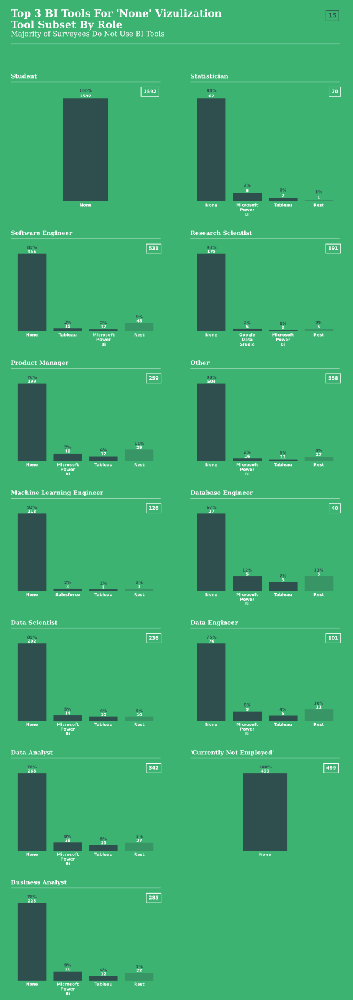

In [40]:
#Figure 15 Code
fig14 = plt.figure(figsize = (10, 30), facecolor = "mediumseagreen")
gs14 = gs.GridSpec(nrows = 15, ncols = 2, height_ratios=([1,1,4,1,3,1,3,1,3,1,3,1,3,1,3]))

#ax1 - Main title
ax1 = plt.subplot(gs14[0, :2])

#Border Expansion
ax1.text(x = -0.02 , y = 0.3 , s = "Top 3 Non-Coding Tools Used in Each Role" , color = "mediumseagreen", size = 17, weight = "bold", fontfamily = "serif")
ax1.text(x = 0.3 , y = 1.2 , s = "Top 3 Non-Coding Tools Used in Each Role" , color = "mediumseagreen", size = 17, weight = "bold", fontfamily = "serif")

#Main Title and Subtitle
ax1.text(x = 0 , y = 0.6 , s = "Top 3 BI Tools For 'None' Vizulization\nTool Subset By Role" , color = "white", size = 17, weight = "bold", fontfamily = "serif")
ax1.text(x = 0 , y = 0.3, s = "Majority of Surveyees Do Not Use BI Tools", size = 12, fontfamily = "serif", color = "white")
ax1.axhline(y = 0 , xmin = 0 , xmax = 1, c = "white", alpha = 0.5, linewidth = 3)

#Adding Figure Number    
ax1.text(x = 0.99, y = 1, s = "15", transform = ax1.transAxes, color = "darkslategrey", ha = "right", weight = "bold", bbox = dict(fc = "none", ec = "darkslategrey"))    
  
#Cosmetics
cosmetics(ax1, "both")
    
#ax2 - Title: Student
ax2 = plt.subplot(gs14[1, 0])
title_maker_14(ax2, "Student")

#ax3 - Title: Statistician
ax3 = plt.subplot(gs14[1, 1])
title_maker_14(ax3, "Statistician")

#ax4 - Graph: Student
ax4 = plt.subplot(gs14[2, 0], zorder = 2)
none_analyzer_2(ax4, "Student")

#ax5 - Graph: Statistician
ax5 = plt.subplot(gs14[2, 1], zorder = 2)
none_analyzer_2(ax5, "Statistician")

#ax6 - Title: Software Engineer
ax6 = plt.subplot(gs14[3, 0])
title_maker_14(ax6, "Software Engineer")

#ax7 - Title: Research Scientist
ax7 = plt.subplot(gs14[3, 1])
title_maker_14(ax7, "Research Scientist")

#ax8 - Graph: Software Engineer
ax8 = plt.subplot(gs14[4, 0], zorder = 2)
none_analyzer_2(ax8, "Software Engineer")

#ax9 - Graph: Research Scientist
ax9 = plt.subplot(gs14[4, 1], zorder = 2)
none_analyzer_2(ax9, "Research Scientist")

#ax10 Title: Product/Project Manager
ax10 = plt.subplot(gs14[5, 0])
title_maker_14(ax10, "Product Manager")

#ax11 - Title: Other
ax11 = plt.subplot(gs14[5, 1])
title_maker_14(ax11, "Other")

#ax12 - Graph: Product/Project Manager
ax12 = plt.subplot(gs14[6, 0], zorder = 2)
none_analyzer_2(ax12, "Product/Project Manager")

#ax13 - Graph: Other
ax13 = plt.subplot(gs14[6, 1], zorder = 2)
none_analyzer_2(ax13, "Other")

#ax14 - Title: Machine Learning Engineer
ax14 = plt.subplot(gs14[7, 0])
title_maker_14(ax14, "Machine Learning Engineer")

#ax15 - Title: Database Engineer
ax15 = plt.subplot(gs14[7, 1])
title_maker_14(ax15, "Database Engineer")

#ax16 - Graph: Machine Learning Engineer
ax16 = plt.subplot(gs14[8, 0], zorder = 2)
none_analyzer_2(ax16, "Machine Learning Engineer")

#ax17 - Graph: Database Engineer
ax17 = plt.subplot(gs14[8, 1], zorder = 2)
none_analyzer_2(ax17, "Database Engineer")

#ax18 - Title: Data Scientist
ax18 = plt.subplot(gs14[9, 0])
title_maker_14(ax18, "Data Scientist")

#ax19 - Title: Data Engineer
ax19 = plt.subplot(gs14[9, 1])
title_maker_14(ax19, "Data Engineer")
    
#ax20 - Graph: Data Scientist
ax20 = plt.subplot(gs14[10, 0], zorder = 2)
none_analyzer_2(ax20, "Data Scientist")

#ax21  - Graph: Data Engineer
ax21 = plt.subplot(gs14[10, 1], zorder = 2)
none_analyzer_2(ax21, "Data Engineer")

#ax22 - Title: Data Analyst
ax22 = plt.subplot(gs14[11, 0])
title_maker_14(ax22, "Data Analyst")

#ax23 - Title: Unemployed
ax23 = plt.subplot(gs14[11, 1])
title_maker_14(ax23, "'Currently Not Employed'")

#ax24 - Graph: Data Analyst
ax24 = plt.subplot(gs14[12, 0], zorder = 2)
none_analyzer_2(ax24, "Data Analyst")

#ax25 - Graph: CNE
ax25 = plt.subplot(gs14[12, 1], zorder = 2)
none_analyzer_2(ax25, "Currently not employed")

#ax26 - Title: Business Analyst
ax26 = plt.subplot(gs14[13, 0])
title_maker_14(ax26, "Business Analyst")

#ax27 - Title:
ax27 = plt.subplot(gs14[13, 1])

#Cosmetics
cosmetics(ax27, "both")

#ax28 - Graph: Business Analyst
ax28 = plt.subplot(gs14[14, 0], zorder = 2)
none_analyzer_2(ax28, "Business Analyst")

#ax29 - Graph: 
ax29 = plt.subplot(gs14[14, 1], zorder = 2)

#Border Expansion
ax29.text(x = 0, y = -0.16, s = "extender", color = "mediumseagreen", size = 12)

#Cosmetics
cosmetics(ax29, "both")

plt.show()

>#### Figure 14 & 15 Analysis
>- For all roles, excluding Statisticians, Matplotlib is the most widely used visualization library. Machine Learning Engineers and Data Scientists having the highest frequencies of 80% and 77% respectively. 
>- Business Analysts use Matplotlib the least at a frequency of 49%.
>- Altair is consistently used the least across all roles with its frequency not surpassing 2%. It is mostly used by Data Scientists and Data Engineers - both roles having a frequency of 2% for the visualization library.
>- Statisticians use GGplot the most with 58% of its surveyees using the visualization library.
>- Consistently, Seaborn is the second most frequently used library across all roles, with its frequency not dropping below 32% in every role.
>- Plotly and GGplot are consistently within the 5 most frequently used visualization libraries.
>- Across most roles, those who do not use any visualization tools use either Microsoft Power BI or tableau.

In [41]:
#Figure 16 Subplot Code
def categorizer(x):
    if len(x["viz_combo"]) >= 1 and len(x["bi_combo"]) == 0:
        return "viz"
    if len(x["bi_combo"]) >= 1 and len(x["viz_combo"]) == 0:
        return "bi"
    if len(x["bi_combo"]) >= 1 and len(x["viz_combo"]) >= 1:
        return "both"
    else:
        return "None"

    
def compensation_comparison(ax, role):
    
    survey_data_copy = survey_data.copy()
    
    #Creating columns for surveyees who use only viz tools or both viz tools and bi tools
    role_data = survey_data_copy[survey_data_copy["Q5"] == role]
    role_data["Q14_Part_11"] = role_data["Q14_Part_11"].replace("None", np.nan)
    role_data["Q31_A_Part_14"] = role_data["Q31_A_Part_14"].replace("None", np.nan)
    role_data["viz_combo"] = role_data.loc[:, "Q14_Part_1" : "Q14_OTHER"].apply(row_addition, axis = 1)
    role_data["bi_combo"] = role_data.loc[:, "Q31_A_Part_1" : "Q31_A_OTHER"].apply(row_addition, axis = 1)
    role_data["viz/bi"] = role_data.loc[:, "viz_combo" : "bi_combo"].apply(categorizer, axis = 1)
    
    
    
    #Seperating Into viz only DF and both DF
    viz_only = role_data[role_data["viz/bi"] == "viz"]
    both = role_data[role_data["viz/bi"] == "both"]

    
    #Calculating the Frequencies of people in each salary range for surveyees who use only viz tools and surveyees who use both
    combined = pd.merge(left = pd.DataFrame(both["Q24"].value_counts()), right = pd.DataFrame(viz_only["Q24"].value_counts()), left_index = True, right_index = True, how = "outer")
    combined.columns = ["both", "viz"]
    combined["labels"] = combined.index
    combined.fillna(0, inplace = True)
    combined["organize"] = combined["labels"].str.split("-").str[0].astype(int)
    combined = combined.sort_values("organize")
    combined = combined.T.iloc[:2, :]
    
    
    #Graphing the Data
    r = [1]
    
    i = 0
    for _ in range(len(combined.columns) - 1):
        i += 60
        r.append(i)

    
    height = 25
    color = ["tab:blue", "tab:red"]

    
    c = 0
    for index, row in combined.iterrows():
        ax.barh(r, row, height = height, color = color[c])
        
        i = 0
        for num in row:
            ax.text(x = num + (ax.get_xlim()[1] * 0.005), y = r[i], s = int(num), color = "white", weight = "bold", size = 8, va = "center", ha = "left")
            i += 1
    
        r = [num + 25 for num in r] # internal distance
        c += 1
    
    
    def divider(x):
        if x == "500000-500000":
            split = x.split("-")
            return str(int(int(split[0])/1000)) + "K"
        else:
            split = x.split("-")
            first = int(split[0])
            second = int(split[1])
            return ((str(first/1000)[:3]).replace(".0", "") + "K").replace(".K", "K") + "-" + (str(second/1000)[:4] + "K").replace(".K", "K")
    
    
    
    ax.set_yticks(np.array(r)-40)
    ax.set_yticklabels(combined.columns.map(divider), size = 6, color = "white", weight = "bold")
    
    
    combined["total"] = combined.sum(axis = 1)
    
    #Adding the Totals for "Only" and "Both" adn their respective percentages of the role total
    ax.text(x = ax.get_xlim()[1] - (ax.get_xlim()[1]*0.008), y = ax.get_ylim()[1] - (ax.get_ylim()[1]*0.07), s = str(int(combined.iloc[0, -1])) + " (" + str(int((combined.iloc[0, -1]/role_data.shape[0])*100)) + "%)", color = "tab:blue", size = 10, ha = "right", weight = "bold", bbox = dict(ec = "tab:blue", fc = "none"))
    ax.text(x = ax.get_xlim()[1] - (ax.get_xlim()[1]*0.008), y = ax.get_ylim()[1] - (ax.get_ylim()[1]*0.13), s = str(int(combined.iloc[1, -1])) + " (" + str(int((combined.iloc[1, -1]/role_data.shape[0])*100)) + "%)", color = "tab:red", size = 10, ha = "right", weight = "bold", bbox = dict(ec = "tab:red", fc = "none"))
    
    #Cosmetics
    cosmetics(ax, "x")
    
    bbax = ax.get_position()
    bbax.y1 += 0.005
    bbax.y0 -= 0.005
    bbax.x0 += 0.057
    ax.set_position(bbax)
    
    
    
def title_maker_15(ax, role):
    
    ax.text(x = 0, y = 0.7, s = "Frequency of Salaries For {}s".format(role), color = "white", weight = "bold", size = 10, fontfamily = "serif")
    ax.text(x = 0, y = 0.3, s = "Utilizing Both Viz. Libraries And BI Tools Tends To lead To a Higher Salary", color = "white", size = 9, fontfamily = "serif")
    
    ax.axhline(y = 0, xmin = 0, xmax = 1, linewidth = 3, color = "white", alpha = 0.5)

    #Cosmetics
    cosmetics(ax, "both")
     


>#### Figure 16 Description
>The figure depicts the frequencies of two groups of people in each role across all salary intervals - those who only use visualization libraries and those who use both visualization libraries and BI tools. In the analysis portion of this graph, “both” refers to surveyees who use visualization libraries and BI tools.

>The **aim** of this graph is to determine if using only visualization libraries is sufficient in higher salary ranges. 

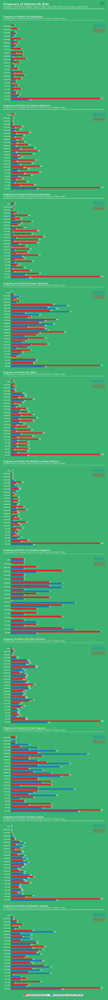

In [42]:
#Figure 16 Code
fig15 = plt.figure(figsize = (10, 100), facecolor = "mediumseagreen")
gs15 = gs.GridSpec(nrows = 24, ncols = 1, height_ratios=([0.2,0.2,3,0.2,3,0.2,3,0.2,3,0.2,3,0.2,3,0.2,3,0.2,3,0.2,3,0.2,3,0.2,3,0.2]))


#ax1 - Main title
ax1 = plt.subplot(gs15[0])

#Border Expansion
ax1.text(x = -0.02 , y = 1.1 , s = "Number of Surveyees in Each Role", color = "mediumseagreen", size = 17, weight = "bold", fontfamily = "serif")
ax1.text(x = 0.43, y = 0.5 , s = "Number of Surveyees in Each Role", color = "mediumseagreen", size = 17, weight = "bold", fontfamily = "serif")

#Main Title and Subtitle
ax1.text(x = 0 , y = 0.8 , s = "Frequency of Salaries By Role", color = "white", size = 15, weight = "bold", fontfamily = "serif")
ax1.text(x = 0 , y = 0.3 , s = "Surveyees Tend To Earn Higher Salaries When They Utilize Both Viz. Libraries and BI Tools", color = "white", size = 10, fontfamily = "serif")
ax1.axhline(y = 0, xmin = 0, xmax = 1, linewidth = 3, color = "white", alpha = 0.5)

#Adding Figure Number
ax1.text(x = 0.99, y = 1, s = "16", transform = ax1.transAxes, color = "darkslategrey", ha = "right", weight = "bold", bbox = dict(fc = "none", ec = "darkslategrey"))    

#Cosmetics
cosmetics(ax1, "both")
    
#ax2 - Title: Statistician
ax2 = plt.subplot(gs15[1])
title_maker_15(ax2, "Statistician")
    
#ax3 - Graph: Statistician
ax3 = plt.subplot(gs15[2], zorder = 2)
compensation_comparison(ax3, "Statistician")

#ax4 - Title: Software Engineer
ax4 = plt.subplot(gs15[3])
title_maker_15(ax4, "Software Engineer")

#ax5 - Graph: Software Engineer
ax5 = plt.subplot(gs15[4], zorder = 2)
compensation_comparison(ax5, "Software Engineer")

#ax6 - Title: Research Scientist
ax6 = plt.subplot(gs15[5])
title_maker_15(ax6, "Research Scientist")

#ax7 - Graph: Research Scientist
ax7 = plt.subplot(gs15[6], zorder = 2)
compensation_comparison(ax7, "Research Scientist")
    
#ax8 - Title: Product/Project Manager
ax8 = plt.subplot(gs15[7])
title_maker_15(ax8, "Project Manager")

#ax9 - Graph: Product/Project Manager
ax9 = plt.subplot(gs15[8], zorder = 2)
compensation_comparison(ax9, "Product/Project Manager")

#ax10 - Title: Other
ax10 = plt.subplot(gs15[9])
title_maker_15(ax10, "Other")

#ax11 - Graph: Other
ax11 = plt.subplot(gs15[10], zorder = 2)    
compensation_comparison(ax11, "Other")

#ax12 - Title: ML ENG.
ax12 = plt.subplot(gs15[11])
title_maker_15(ax12, "Machine Learning Engineer")

#ax13 - Graph: ML ENG.
ax13 = plt.subplot(gs15[12], zorder = 2)
compensation_comparison(ax13, "Machine Learning Engineer")

#ax14 - Title: Database Engineer
ax14 = plt.subplot(gs15[13])
title_maker_15(ax14, "Database Engineer")    

#ax15 - Graph: Database Engineer
ax15 = plt.subplot(gs15[14], zorder = 2)
compensation_comparison(ax15, "Database Engineer")

#ax16 - Title: Data Scientist
ax16 = plt.subplot(gs15[15])
title_maker_15(ax16, "Data Scientist")  
    
#ax17  - Graph: Data Scientist
ax17 = plt.subplot(gs15[16], zorder = 2)
compensation_comparison(ax17, "Data Scientist")

#ax18 - Title: Data Engineer
ax18 = plt.subplot(gs15[17])
title_maker_15(ax18, "Data Engineer")

#ax19 - Graph: Data Engineer
ax19 = plt.subplot(gs15[18], zorder = 2)
compensation_comparison(ax19, "Data Engineer")

#ax20 - Title: Data Analyst
ax20 = plt.subplot(gs15[19])
title_maker_15(ax20, "Data Analyst")

#ax21 - Graph: Data Analyst
ax21 = plt.subplot(gs15[20], zorder = 2)
compensation_comparison(ax21, "Data Analyst")

#ax22 - Title: Business Analyst
ax22 = plt.subplot(gs15[21])
title_maker_15(ax22, "Business Analyst")
    
#ax23 - Graph: Business Analyst
ax23 = plt.subplot(gs15[22], zorder = 2)
compensation_comparison(ax23, "Business Analyst")

#ax24 - Legend
ax24 = plt.subplot(gs15[23])
pop_1 = mpatches.Patch(color='tab:red', label='Visualization Libraries Only')
pop_2 = mpatches.Patch(color='tab:blue', label="Both Visualization Libraries and BI Tools")

ax24.legend(handles = [pop_1, pop_2], ncol = 2, loc = 1, bbox_to_anchor = (0.8, 1.2), frameon = True, facecolor = "white", edgecolor = "black", fontsize = 8)

#Cosmetics
cosmetics(ax24, "both")

plt.show()

>#### Figure 16 Analysis
>- The majority of roles have more surveyees who only use visualization libraries than surveyees who use both. Data Engineers have the highest frequency (40%) of surveyees who use both, while Research Scientists have the lowest (16%).
>- For all roles, the lowest salary interval (0-0.99K USD) is dominated by surveyees who only use visualization libraries.
>- Project Managers, Data Engineers, Data Analysts, and Business Analysts all follow a similar trend where the frequency of surveyees who use both increases as salary increases.
>- Contrastingly, for Software Engineers and Research Scientists, the frequency of surveyees who use both remain relatively constant throughout the entire salary range.
>- Interestingly, in the Data Science role, the frequencies for surveyees who use visualization tools and who use both is equal throughout the entire salary range.

### Roles vs. IDEs

In [43]:
#Figure 17 Subplot Code
def grapher_23(ax, role):
    
    survey_data_copy = survey_data.copy()
    
    map_dict = {"Jupyter" : "J", "RStudio" : "RS", "Visual Studio" : "VS", "Visual Studio Code" : "VSC", "PyCharm" : "PC", "Spyder" : "S", "Notepad++" : "NP", "Sublime Text" : "ST", "Vim" : "V", "MATLAB" : "ML", "None" : np.nan, "Other" : "O"}
    
    #Creating columns for the combos of IDEs for each row and creating another column for the number of IDEs used
    role_data = survey_data_copy[survey_data_copy["Q5"] == role]
    
    role_ide = role_data.loc[:, "Q9_Part_1" : "Q9_OTHER"].replace(map_dict)
    role_ide["ide_combo"] = role_ide.apply(lambda x : [value for value in x if str(value) != "nan"], axis = 1)
    role_ide["combo_count"] = role_ide["ide_combo"].apply(lambda x : len(x))
    role_ide["ide_combo"] = role_ide["ide_combo"].apply(lambda x : ",".join(x))
    
    #The Frequecy for number of IDEs Used
    role_combo_value_counts = role_ide["combo_count"].value_counts()

    #Put the appened dataframes here
    final_df = pd.DataFrame()
    
    
    
    for number in role_combo_value_counts.index:

        number_ide = role_ide[role_ide["combo_count"] == number]
        number_ide = number_ide["ide_combo"].value_counts().sort_values(ascending = False)

        top_3 = pd.DataFrame(number_ide[:3])

        everything_else = pd.DataFrame(pd.Series(number_ide[3:].sum()))
        everything_else.columns = ["ide_combo"]
        
        combined = pd.concat([top_3, everything_else], axis = 0)
        combined.index = combined.index.astype(str).str.replace("0", "everything_else")
        combined = combined.reset_index()
        combined.columns = ["ide_combo_{}".format(number), "count_{}".format(number)]
    

        if final_df.shape == (0, 0):
            final_df = combined
        else:
            final_df = pd.merge(left = final_df, right = combined, right_index = True, left_index = True, how = "left")
            
        #Graphig the Data - The base
        ax.bar(role_combo_value_counts.index.astype(str), role_combo_value_counts, color = "mediumseagreen")
        
    
    #Adding the Totals for number of IDEs used
    x1 = 0
    for value in role_combo_value_counts:
        ax.text(x = x1, y = value, s = "{:,}".format(value), color = "white", size = 10, ha = "center", va = "bottom", weight = "bold")
        x1 += 1
    
    final_df = final_df.fillna(0)
   
    #Adding the Rectangles to show the proportions of the bar
    x = -0.38
    for i in role_combo_value_counts.index:
        y = 0
        for value, color in zip(final_df["count_{}".format(i)], ["#94A6BB", "#D0CAC0", "#3A5874", "#998B7B"]):
            rect = mpatches.Rectangle((x, y), width = 0.76, height = value, color = color)
            ax.add_patch(rect)
            y += value
        x += 1

    
    #Creating Table 1, where the values are percentages of the IDE combos for each IDE count
    table_df = pd.DataFrame()
    
    for column in final_df.columns:
        if "count" in column:
            if table_df.shape == (0, 0):
                table_df = final_df[column]
            else:
                table_df = pd.merge(left = table_df, right = final_df[column], right_index = True, left_index = True, how = "left")
      
    table_df.columns = table_df.columns.str.replace("count_", "")
    
    
    table_df = table_df.apply(lambda x : (x / x.sum()) *100)
    table_df = table_df.astype(int).astype(str)
    table_df = table_df.apply(lambda x : x + "%")
    
    cell_text = table_df.values.tolist()

    ax.set_xlim(-0.38,len(table_df.columns))
       
        
    #Adding Table 1
    the_table = ax.table(cellText=cell_text[::-1], 
             cellLoc = "center", colLabels=table_df.columns, 
             loc='bottom',
             cellColours = [["#94A6BB"] * len(role_combo_value_counts), ["#D0CAC0"] * len(role_combo_value_counts), ["#3A5874"] * len(role_combo_value_counts), ["#998B7B"] * len(role_combo_value_counts)],
            colColours = ["tab:grey"] * len(role_combo_value_counts),
            bbox=[-0.01,-0.23,0.97,0.2]) #x,y,w,h
    
    
    #Creating Table 2, where the values are the combinations of IDEs 
    table_df_2 = pd.DataFrame()
    
    for column in final_df.columns:
        if "combo" in column:
            if table_df_2.shape == (0, 0):
                table_df_2 = final_df[column]
            else:
                table_df_2 = pd.merge(left = table_df_2, right = final_df[column], right_index = True, left_index = True, how = "left")
     
    table_df_2 = table_df_2.replace(0, "0")
    
    
    def finder(x):
        coma_index = []
        for index,char in enumerate(x):
            if char == ",":
                coma_index.append(index)
        
        if len(coma_index) > 4:
            x = x[:coma_index[3]] + "\n" + x[coma_index[3]+1:]

        return x
            
    
    for column in table_df_2.columns:
        table_df_2[column] = table_df_2[column].apply(finder)
    
    table_df_2.columns = table_df_2.columns.str.replace("ide_combo_", "")
    table_df_2 = table_df_2.replace("everything_else", "Everything Else")
    table_df_2["0"] = ["None", "-", "-", "-"]
    
    cell_text_2 = table_df_2.values.tolist()
    
    #Adding Table 2
    the_table_2 = ax.table(cellText = cell_text_2[::-1],
                          cellLoc = "center",
                          colLabels = table_df_2.columns,
                          loc = "bottom",
                          cellColours = [["#94A6BB"] * len(role_combo_value_counts), ["#D0CAC0"] * len(role_combo_value_counts), ["#3A5874"] * len(role_combo_value_counts), ["#998B7B"] * len(role_combo_value_counts)],
                          colColours = ["tab:grey"] * len(role_combo_value_counts),
                          bbox = [-0.01,-0.45,0.97,0.2])
    
    
    

    
    #Formatting Table 1
    for key, cell in the_table.get_celld().items():
        cell.set_edgecolor("None")
        cell.get_text().set_color('w')
        cell.get_text().set_weight('bold')
        cell.set_linewidth(1)
        cell.set_fontsize(8)
        
    
    #Formatting Table 2
    the_table_2.auto_set_font_size(False)
        
    for key, cell in the_table_2.get_celld().items():
        cell.set_edgecolor("None")
        cell.get_text().set_color('w')
        cell.get_text().set_weight('bold')
        cell.set_fontsize(4.3)
        cell.set_linewidth(1)    
        
        
    for cell in the_table_2._cells:
        if cell[0] == 0:
            the_table_2._cells[cell].set_fontsize(8)
    
 
    #Cosmetics
    cosmetics(ax, "both")
        
    bbax = ax.get_position()
    bbax.x1 += 0.03
    bbax.x0 += 0.01
    ax.set_position(bbax)    
        
def title_maker_16(ax, role, number):
    
    ax.text(x = 0, y = 0.3 , s = "Frequency of Utilized IDEs In The {} Role".format(role), color = "white", size = 12, weight = "bold", fontfamily = "serif")
    ax.text(x = 0, y = 0.1 , s = "Majority of Surveyees use {} IDE".format(number), color = "white", size = 10, fontfamily = "serif")
  
    ax.axhline(y = 0, xmin = 0, xmax = 1, c = "white", linewidth = 3, alpha = 0.5)
    
    #Cosmetics
    cosmetics(ax, "both")
    

>#### Figure 17 Description
>**Background Context:** In Q9, each surveyee was asked to report which IDEs they used. All the IDEs reported by a surveyee were stored in a separate “combos” column.

>This figure depicts the frequency of IDE combinations used in each role. Each subplot is split into 3 sections:  a bar graph showing the frequency of each combination length, a table showing the frequencies of the different combinations for each combination length, and a table showing the contents of the corresponding combinations found in the first table.

>The **aim** of this figure is to explore which IDEs data professionals use most frequently and whether or not they prefer to switch between different IDEs.

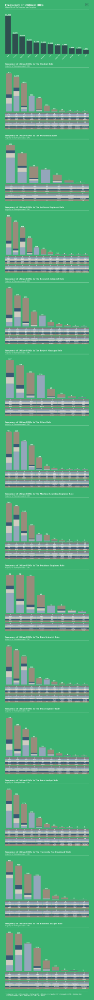

In [44]:
#Figure 17 Code
fig16 = plt.figure(figsize = (10, 120))
gs16 = gs.GridSpec(nrows = 42, ncols = 1, height_ratios=([0.5,4,1,4,1,1,4,1,1,4,1,1,4,1,1,4,1,1,4,1,1,4,1,1,4,1,1,4,1,1,4,1,1,4,1,1,4,1,1,4,1,1])) 


#ax1 - Title: Main 
ax1 = plt.subplot(gs16[0,0])

#Border Expansion
ax1.text(x = -0.02, y = 1.4 , s = "Distribution of The IDEs Used Across All Roles", color = "mediumseagreen", size = 16, weight = "bold", fontfamily = "serif")
ax1.text(x = 0.24, y = 0.5 , s = "Distribution of The IDEs Used Across All Roles", color = "mediumseagreen", size = 16, weight = "bold", fontfamily = "serif")

#Main Title and Subtitle
ax1.text(x = 0, y = 0.8 , s = "Frequency of Utilized IDEs", color = "white", size = 17, weight = "bold", fontfamily = "serif")
ax1.text(x = 0, y = 0.4 , s = "Majority of Surveyees use Jupyter", color = "white", size = 12, fontfamily = "serif")

ax1.axhline(y = 0, xmin = 0, xmax = 1, c = "white", linewidth = 3, alpha = 0.5)

#Adding Figure Number
ax1.text(x = 0.99, y = 1, s = "17", transform = ax1.transAxes, color = "darkslategrey", ha = "right", weight = "bold", bbox = dict(fc = "none", ec = "darkslategrey"))    

#Cosmetics
cosmetics(ax1, "both")

#ax2 = Graph: Main
ax2 = plt.subplot(gs16[1,0], zorder = 2)

survey_data_copy = survey_data.copy()

#Gathering the Frequency of Each IDE
main_data = survey_data_copy.loc[:, "Q9_Part_1" : "Q9_OTHER"]
main_data = main_data[["Q9_Part_1", "Q9_Part_2", "Q9_Part_3", "Q9_Part_4", "Q9_Part_5", "Q9_Part_6", "Q9_Part_7", "Q9_Part_8", "Q9_Part_9", "Q9_Part_10", "Q9_OTHER", "Q9_Part_11"]]
main_data["Q9_Part_11"] = main_data.loc[:, "Q9_Part_1" : "Q9_OTHER"].apply(lambda x : "None" if x.isnull().all() else np.nan, axis = 1)
main_data.columns = ["Jupyter", "RStudio", "Visual Studio", "VS Code", "PyCharm", "Spyder", "Notepad++", "Sublime Text", "Vim", "MATLAB", "Other", "None"]
main_data = main_data.count()

main_data = main_data.sort_values(ascending = False)

#Graphing Data
ax2.bar(main_data.index, main_data, color = "darkslategrey")

#Adding the Totals of each IDE
x = 0
for value in main_data:
    ax2.text(x = x, y = value, s = "{:,}".format(value), color = "white", size = 10, ha = "center", va = "bottom", weight = "bold")
    x += 1

ax2.set_xticklabels(main_data.index, color = "white", rotation = 45, size = 6, weight = "bold")

#Cosmetics
cosmetics(ax2, "y")

bbax = ax2.get_position()
bbax.x0 -= 0.035
bbax.x1 += 0.035
ax2.set_position(bbax)

#ax3 - Title: Student
ax3 = plt.subplot(gs16[2, 0])
title_maker_16(ax3, "Student", "2")

#ax4 - Graph: Student
ax4 = plt.subplot(gs16[3,0], zorder = 2)
grapher_23(ax4, "Student")
    
#ax5 - Graph: Student
ax5 = plt.subplot(gs16[4, 0])

#Cosmetics
cosmetics(ax5, "both")
    
#ax6 - Title: Statistician
ax6 = plt.subplot(gs16[5,0])
title_maker_16(ax6, "Statistician", "1")

#ax7 - Graph: Statistician
ax7 = plt.subplot(gs16[6, 0], zorder = 2)
grapher_23(ax7, "Statistician")

#ax8 - Graph: Statistician
ax8 = plt.subplot(gs16[7, 0])

#Cosmetics
cosmetics(ax8, "both")

#ax9 - Title: Software Engineer
ax9 = plt.subplot(gs16[8, 0])
title_maker_16(ax9, "Software Engineer", "2")

#ax10 - Graph: Software Engineer
ax10 = plt.subplot(gs16[9, 0], zorder = 2)
grapher_23(ax10, "Software Engineer")
    
#ax11 - Graph: Software Engineer
ax11 = plt.subplot(gs16[10, 0])

#Cosmetics
cosmetics(ax11, "both")

#ax12 - Title: Research Scientist
ax12 = plt.subplot(gs16[11, 0])
title_maker_16(ax12, "Research Scientist", "2")

#ax13 - Graph: Research Scientist
ax13 = plt.subplot(gs16[12, 0], zorder = 2)
grapher_23(ax13, "Research Scientist")

#ax14 - Graph: Research Scientist
ax14 = plt.subplot(gs16[13, 0])    

#Cosmetics
cosmetics(ax14, "both")

#ax15 - Title: Product/Project Manager
ax15 = plt.subplot(gs16[14, 0])
title_maker_16(ax15, "Project Manager", "1")

#ax16 - Graph: Product/Project Manager
ax16 = plt.subplot(gs16[15, 0], zorder = 2)
grapher_23(ax16, "Product/Project Manager")

#ax17 - Graph: Product/Project Manager
ax17 = plt.subplot(gs16[16, 0])

#Cosmetics
cosmetics(ax17, "both") 

#ax18 - Title: Other
ax18 = plt.subplot(gs16[17, 0])
title_maker_16(ax18, "Other", "2")
    
#ax19 - Graph: Other
ax19 = plt.subplot(gs16[18, 0], zorder = 2)
grapher_23(ax19, "Other")
    
#ax20  - Graph: Other
ax20 = plt.subplot(gs16[19,0])

#Cosmetics
cosmetics(ax20, "both")  

#ax21 - Title: Machine Learning Engineer
ax21 = plt.subplot(gs16[20, 0])
title_maker_16(ax21, "Machine Learning Engineer", "2")

#ax22 - Graph: Machine Learning Engineer
ax22 = plt.subplot(gs16[21, 0], zorder = 2)
grapher_23(ax22, "Machine Learning Engineer")

#ax23 - Graph: Machine Learning Engineer
ax23 = plt.subplot(gs16[22, 0])

#Cosmetics
cosmetics(ax23, "both")

#ax24 - Title: Database Engineer
ax24 = plt.subplot(gs16[23, 0])
title_maker_16(ax24, "Database Engineer", "1")

#ax25 - Graph: Database Engineer
ax25 = plt.subplot(gs16[24, 0], zorder = 2)
grapher_23(ax25, "Database Engineer")

#ax26 - Graph: Database Engineer
ax26 = plt.subplot(gs16[25, 0])

#Cosmetics
cosmetics(ax26, "both")

#ax27 - Title: Data Scientist
ax27 = plt.subplot(gs16[26, 0])
title_maker_16(ax27, "Data Scientist", "2")

#ax28 - Graph: Data Scientist
ax28 = plt.subplot(gs16[27, 0], zorder = 2)
grapher_23(ax28, "Data Scientist")

#ax29 - Graph: Data Scientist
ax29 = plt.subplot(gs16[28, 0])

#Cosmetics
cosmetics(ax29, "both")

#ax30 - Title: Data Engineer
ax30 = plt.subplot(gs16[29, 0])
title_maker_16(ax30, "Data Engineer", "2")

#ax31 - Graph: Data Engineer
ax31 = plt.subplot(gs16[30, 0], zorder = 2)
grapher_23(ax31, "Data Engineer")

#ax32 - Graph: Data Engineer
ax32 = plt.subplot(gs16[31, 0])

#Cosmetics
cosmetics(ax32, "both")

#ax33 Title: Data Analyst
ax33 = plt.subplot(gs16[32, 0])
title_maker_16(ax33, "Data Analyst", "1")

#ax34 Graph: Data Analyst
ax34 = plt.subplot(gs16[33, 0], zorder = 2)
grapher_23(ax34, "Data Analyst")


#ax35 Graph: Data Analyst
ax35 = plt.subplot(gs16[34, 0])

#Cosmetics
cosmetics(ax35, "both")

#ax36 Title: Currently not employed
ax36 = plt.subplot(gs16[35, 0])
title_maker_16(ax36, "'Currently Not Employed'", "1")

#ax37 Graph: Currently not employed
ax37 = plt.subplot(gs16[36, 0], zorder = 2)
grapher_23(ax37, "Currently not employed")

#ax38 Graph: Currently not employed
ax38 = plt.subplot(gs16[37, 0])

#Cosmetics
cosmetics(ax38, "both")

#ax39 Title: Business Analyst
ax39 = plt.subplot(gs16[38, 0])
title_maker_16(ax39, "Business Analyst", "2")   

#ax40 Graph: Business Analyst
ax40 = plt.subplot(gs16[39, 0], zorder = 2)
grapher_23(ax40, "Business Analyst")

#ax41 Graph: Business Analyst
ax41 = plt.subplot(gs16[40, 0])

ax41.text(x = 0, y = -0.65, s = "extender", color = "mediumseagreen", size = 12)

#Cosmetics
cosmetics(ax41, "both")

#ax42 - Legend
ax42 = plt.subplot(gs16[41, :2])

ax42.axhline(y = 0.7, xmin = 0, xmax = 0.98, c = "white", alpha = 0.5, linewidth = 1.5)

ax42.text(x = 0, y = 0.3, s = "* J = Jupyter | VSC = VS Code | PC = PyCharm | RS = RStudio | S = Spyder | NP = Notepad++ | ST = Sublime Text\n  VS = Visual Studio | ML = MATLAB | V = VIM | O = Other", color = "white", weight = "bold", size = 8, fontfamily = "serif")

#Cosmetics
cosmetics(ax42, "both")

fig16.set_facecolor("mediumseagreen")

plt.show()

>#### Figure 17 Analysis
>- The majority of Statisticians use 1 IDE, with RStudio having the highest frequency of 67%. In contrast, only 17% of Business Analysts who use 1 IDE use RStudio. 
>- Jupyter has the highest frequency amongst roles (except Statisticians) where the majority of surveyees use 1 IDE. Database Engineers, Data Analysts, and Project Managers have the highest frequencies of Jupyter users (53%, 45%, and 38% respectively).
>- After Jupyter, Project Managers and Database Engineers use VS Code the most amongst roles who use 1 IDE most frequently.
>- Comparing roles who use 1 IDE most frequently, Statisticians and Data Analysts use the same IDEs with differing frequencies. Most notably, 67% of Statisticians use RStudio and 45% of Data Analysts use Jupyter.
>- Of the roles that most frequently use 1 IDE, Database Engineers are the sole users of Notepad++ (9% of Database Engineers use this IDE).
>- Roles that most frequently use 2 IDEs have shockingly similar IDE combinations. All roles (except Business Analysts), use Jupyter-VS Code and Jupyter-PyCharm the most. Business Analysts on the other hand use Jupyter-RStudio instead.
>- Data Scientists use Jupyter-PyCharm the most (19%) and Machine Learning Engineers use Jupyter-VS Code the most (21%).
>- Jupyter-RStudio is the third most frequently used 2 IDE combination amongst Research Scientists, Data Scientists, and Business Analysts.

### Roles vs. Activities

In [45]:
#Figure 18 Subplot Code
def heatmap_grapher(ax, role):
    
    survey_data_copy = survey_data.copy()
    
    role_data = survey_data_copy[survey_data_copy["Q5"] == role]

    acrnym_dict = {'Analyze Data' : "AD", 'Research' : "R", 'None' : "None", 'Build Data Infrastructure' : "BDI", 'Experiment to Improve ML' : "EIML", 'Build ML Services' : "BMLS", 'Build Prototypes' : "BP", 'Other' : "Other"}

    #Creating a Combo List of activites for each role
    activities_role_data = role_data.loc[:, "Q23_Part_1" : "Q23_OTHER"]
    activities_role_data = activities_role_data.replace(acrnym_dict)
    activities_role_data["activities_combo"] = activities_role_data.apply(lambda x : [value for value in x if str(value) != "nan"], axis = 1)
    activities_role_data["activities_combo"] = activities_role_data["activities_combo"].apply(lambda x : ",".join(x) if len(x) != 0 else "none")
    activities_role_data["activities_combo"] = activities_role_data["activities_combo"].replace("none", "None")

    
    #Combining activites combo and Company size Together
    role_data = pd.merge(left = role_data["Q20"], right = activities_role_data, left_index = True, right_index = True)
    role_data = role_data.loc[:,["Q20", "activities_combo"]]
    role_data = role_data.groupby(["Q20", "activities_combo"]).size()#The problem here is because my combos list is a list and that aint gone work


    #Converting to Dataframe so that we can get rid of the multi-index
    pre_final = pd.DataFrame(role_data).reset_index()

    #Getting the top 10 combinations of activtty combos and company size
    final = pre_final.pivot(index = "activities_combo", columns = "Q20", values = 0)
    final.fillna(0, inplace = True)
    final["sum"] = final.sum(axis = 1)
    final = final.sort_values("sum", ascending = False)
    final  = final.iloc[:10, :-1]
    
 
    def finder(x):
        coma_index = []
        for index,char in enumerate(x):
            if char == ",":
                coma_index.append(index)
        
        if len(coma_index) >= 3:
            x = x[:coma_index[2]] + "\n" + x[coma_index[2]+1:]

        return x
    
    #Changing the index and sorting the columns
    final["index"] = final.index
    final["index"] = final["index"].apply(finder)
    final.index = final["index"]
    final = final.iloc[:, :-1]
    final = final[["0-49", "50-249", "250-999", "1000-9999", "10000+"]]
    
    #Order of y axis for all heatmaps will be based on this list
    unique_list = ['AD', 'None', 'AD,BDI,BP\nBMLS,EIML,R', 'Other', 'AD,BDI', 'BDI', 'AD,BP', 'AD,BDI,BP', 'R', 'AD,BDI,BP\nBMLS,EIML', 'BP', 'AD,R', 'AD,EIML', 'BP,EIML,R', 'AD,BP,BMLS', 'AD,BP,EIML', 'AD,BDI,BP\nBMLS', 'AD,BMLS', 'BP,R', 'BDI,BP', 'AD,BDI,BP\nBMLS,R', 'AD,BDI,EIML', 'BMLS', 'EIML,R', 'AD,BP,BMLS\nEIML']
    
    unique_list_index = []
    
    for index in final.index:
        x = unique_list.index(index)
        unique_list_index.append(x)
        
    
    unique_list_index = sorted(unique_list_index)
    
    #Correct order for list
    index_list = []
    
    for index in unique_list_index:
        index_list.append(unique_list[index])
    
    #Ordering the index based on the predetermined order
    final = final.loc[index_list]
        
            
    #Graphing the Data
    ax = sns.heatmap(final, annot = True, cbar = False, fmt = "g", annot_kws={"fontsize" : 6, "fontweight" : "bold"})
    
    def splitter(x):
        if "-" in x:
            split = x.split("-")
            return "{:,}".format(int(split[0])) + "-" + "{:,}".format(int(split[1]))
        else:
            return "{:,}".format(int(x[:-1])) + x[-1]
    
    ax.set_yticklabels(final.index, rotation = 45, size = 6, color = "white", weight = "bold")
    ax.set_xticklabels(final.columns.map(splitter), rotation = 0, size = 6, color = "white", weight = "bold")
   
 
    #Cosmetics
    ax.set_xlabel("")
    ax.set_ylabel("")
    
    ax.tick_params(axis=u'both', which=u'both',length=0)
    
    if role in ["Statistician", "Research Scientist", "Other", "Database Engineer", "Data Engineer", "Business Analyst"]:
        bbax = ax.get_position()
        bbax.x0 += 0.06
        bbax.y0 += 0.005
        ax.set_position(bbax)
    else:
        bbax = ax.get_position()
        bbax.x0 += 0.06
        bbax.y0 += 0.005
        ax.set_position(bbax)
    
    
def title_maker_17(ax, role, size, activity):

    ax.text(x = 0, y = 0.6 , s = "Top 10 Frequencies for Company Size and\nFunctional Role In The {} Role".format(role) , color = "white", size = 9.5, fontfamily = "serif", weight = "bold")
    ax.text(x = 0, y = 0.1 , s = "The Highest Frequency Combination Consists of a\nCompany Size of {} Employees and The\n'{}' Functional Role".format(size, activity) , color = "white", size = 7, fontfamily = "serif")
    
    ax.axhline(y = 0, xmin = 0, xmax = 1, linewidth = 3, alpha = 0.5, c = "white")
    
    cosmetics(ax, "both")
     

>#### Figure 18 Description:
>**Background Context**: In Q23, each surveyee was asked to report which activities they engage in in their current role. All the activities reported by a surveyee were stored in a separate “combos” column.

>For each plot, the x-axis represents the range of company sizes and the y-axis represents the 10 most frequent activity “combos”. Each cell represents the count for a company size-activity “combo” combination.

>The **aim** of this figure is to determine which activities are performed most often for different company sizes in each role.

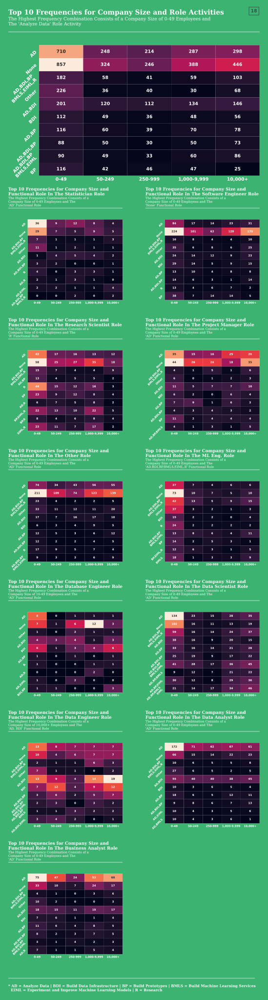

In [46]:
#Figure 18 Code
fig17 = plt.figure(figsize = (10, 40))
gs17 = gs.GridSpec(nrows = 15, ncols = 2, height_ratios=([1,6,1,4,1,4,1,4,1,4,1,4,1,4,1]))

#ax1 = Title: Main
ax1 = plt.subplot(gs17[0, :2])

#Border Expansion
ax1.text(x = -0.02, y = 1.15, s = "Top 10 Most Dense Combinations for Company", color = "mediumseagreen", fontfamily = "serif", size = 17, weight = "bold")
ax1.text(x = 0.22, y = 1, s = "Top 10 Most Dense Combinations for Company", color = "mediumseagreen", fontfamily = "serif", size = 17, weight = "bold")

#Main Title and Subtitle
ax1.text(x = 0, y = 0.9, s = "Top 10 Frequencies for Company Size and Role Activities", color = "white", fontfamily = "serif", size = 15, weight = "bold")
ax1.text(x = 0, y = 0.4, s = "The Highest Frequency Combination Consists of a Company Size of 0-49 Employees and\nThe 'Analyze Data' Role Activity", color = "white", size = 10, fontfamily = "serif")

ax1.axhline(y = 0.1, xmin = 0, xmax = 1, c = "white", alpha = 0.5, linewidth = 1.5)

#Adding Figure Number
ax1.text(x = 0.99, y = 1, s = "18", transform = ax1.transAxes, color = "darkslategrey", ha = "right", weight = "bold", bbox = dict(fc = "none", ec = "darkslategrey"))    

#Cosmetics
cosmetics(ax1, "both")

#ax2 = Graph: Main
ax2 = plt.subplot(gs17[1, :2])

main_data = survey_data.copy()

acrnym_dict = {'Analyze Data' : "AD", 'Research' : "R", 'None' : "None", 'Build Data Infrastructure' : "BDI", 'Experiment to Improve ML' : "EIML", 'Build ML Services' : "BMLS", 'Build Prototypes' : "BP", 'Other' : "Other"}

#Creating a Combo List of activites
activities_main_data = main_data.loc[:, "Q23_Part_1" : "Q23_OTHER"]
activities_main_data = activities_main_data.replace(acrnym_dict)
activities_main_data["activities_combo"] = activities_main_data.apply(lambda x : [value for value in x if str(value) != "nan"], axis = 1)
activities_main_data["activities_combo"] = activities_main_data["activities_combo"].apply(lambda x : ",".join(x) if len(x) != 0 else "none")
activities_main_data["activities_combo"] = activities_main_data["activities_combo"].replace("none", "None")

#Combining activites combo and Company size Together
main_data = pd.merge(left = main_data, right = activities_main_data, left_index = True, right_index = True)
main_data = main_data.loc[:, ["Q20", "activities_combo"]]
main_data = main_data.groupby(["Q20", "activities_combo"]).size()#The problem here is because my combos list is a list and that aint gone work

#Converting to Dataframe so that we can get rid of the multi-index
pre_final = pd.DataFrame(main_data).reset_index()

#Getting the top 10 combinations of activtty combos and company size
final = pre_final.pivot(index = "activities_combo", columns = "Q20", values = 0)
final.fillna(0, inplace = True)
final["sum"] = final.sum(axis = 1)
final = final.sort_values("sum", ascending = False)
final  = final.iloc[:10, :-1]

pre_main_final = pd.DataFrame(main_data).reset_index()

final_main = pre_main_final.pivot(index = "activities_combo", columns = "Q20", values = 0)
final_main.fillna(0, inplace = True)
final_main["sum"] = final_main.sum(axis = 1)
final_main = final_main.sort_values("sum", ascending = False)
final_main  = final_main.iloc[:10, :-1]



def finder(x):
    coma_index = []
    for index,char in enumerate(x):
        if char == ",":
            coma_index.append(index)
        
    if len(coma_index) > 3:
        x = x[:coma_index[2]] + "\n" + x[coma_index[2]+1:]

    return x

#Changing the index and sorting the columns
final_main["index"] = final_main.index
final_main["index"] = final_main["index"].apply(finder)
final_main.index = final_main["index"]
final_main = final_main.iloc[:, :-1]
final_main = final_main[["0-49", "50-249", "250-999", "1000-9999", "10000+"]]

#Order of y axis for all heatmaps will be based on this list
unique_list = ['AD', 'None', 'AD,BDI,BP\nBMLS,EIML,R', 'Other', 'AD,BDI', 'BDI', 'AD,BP', 'AD,BDI,BP', 'R', 'AD,BDI,BP\nBMLS,EIML', 'BP', 'AD,R', 'AD,EIML', 'BP,EIML,R', 'AD,BP,BMLS', 'AD,BP,EIML', 'AD,BDI,BP\nBMLS', 'AD,BMLS', 'BP,R', 'BDI,BP', 'AD,BDI,BP\nBMLS,R', 'AD,BDI,EIML', 'BMLS', 'EIML,R', 'AD,BP,BMLS\nEIML']
    
unique_list_index = []
    
for index in final_main.index:
    x = unique_list.index(index)
    unique_list_index.append(x)
        
    
unique_list_index = sorted(unique_list_index)

#Correct order for list
index_list = []
    
for index in unique_list_index:
    index_list.append(unique_list[index])

#Ordering the index based on the predetermined order
final_main = final_main.loc[index_list]

#Graphing the Data
ax2 = sns.heatmap(final_main, annot = True, cbar = False, fmt = "g", annot_kws={"fontsize" : 10, "fontweight" : "bold"})

def splitter(x):
        if "-" in x:
            split = x.split("-")
            return "{:,}".format(int(split[0])) + "-" + "{:,}".format(int(split[1]))
        else:
            return "{:,}".format(int(x[:-1])) + x[-1]

ax2.set_yticklabels(final_main.index, rotation = 45, size = 10, color = "white", weight = "bold")
ax2.set_xticklabels(final_main.columns.map(splitter), rotation = 0, size = 10, color = "white", weight = "bold")

#Cosmetics
ax2.set_xlabel("")
ax2.set_ylabel("")

ax2.tick_params(axis=u'both', which=u'both',length=0)

bbax = ax2.get_position()
bbax.x0 = 0.22
ax2.set_position(bbax)

#ax3 = Title: Statistician
ax3 = plt.subplot(gs17[2, 0])
title_maker_17(ax3, "Statistician", "0-49", "AD")

#ax4 = Title: Software Engineer
ax4 = plt.subplot(gs17[2, 1])
title_maker_17(ax4, "Software Engineer", "0-49", "None")

#ax5 = Graph: Statistician
ax5 = plt.subplot(gs17[3, 0])
heatmap_grapher(ax5, "Statistician")

#ax6 = Grpah: Software Engineer
ax6 = plt.subplot(gs17[3, 1])
heatmap_grapher(ax6, "Software Engineer")

#ax7 = Title: Research Scientist
ax7 = plt.subplot(gs17[4, 0])
title_maker_17(ax7, "Research Scientist", "0-49", "R")

#ax8 = Title: Product/Project Manager
ax8 = plt.subplot(gs17[4, 1])
title_maker_17(ax8, "Project Manager", "0-49", "AD")

#ax9 = Graph: Research Scientist
ax9 = plt.subplot(gs17[5, 0])
heatmap_grapher(ax9, "Research Scientist")

#ax10 = Grpah: Product/Project Manager
ax10 = plt.subplot(gs17[5, 1])
heatmap_grapher(ax10, "Product/Project Manager")

#ax11 = Title: Other
ax11 = plt.subplot(gs17[6, 0])
title_maker_17(ax11, "Other", "0-49", "AD")

#ax12 = Title: Machine Learning Engineer
ax12 = plt.subplot(gs17[6, 1])
title_maker_17(ax12, "ML Eng.", "0-49", "AD,BDI,BP,BMLS,EIML,R")

#ax13 = Graph: Other
ax13 = plt.subplot(gs17[7, 0])
heatmap_grapher(ax13, "Other")

#ax14 = Grpah: Machine Learning Engineer
ax14 = plt.subplot(gs17[7, 1])
heatmap_grapher(ax14, "Machine Learning Engineer")

#ax15 = Title: Database Engineer
ax15 = plt.subplot(gs17[8, 0])
title_maker_17(ax15, "Database Engineer", "10-49", "AD")

#ax16 = Title: Data Scientist
ax16 = plt.subplot(gs17[8, 1])
title_maker_17(ax16, "Data Scientist", "0-49", "AD")

#ax17 = Graph: Database Engineer
ax17 = plt.subplot(gs17[9, 0])
heatmap_grapher(ax17, "Database Engineer")

#ax18 = Grpah: Data Scientist
ax18 = plt.subplot(gs17[9, 1])
heatmap_grapher(ax18, "Data Scientist")

#ax19 = Title: Data Engineer
ax19 = plt.subplot(gs17[10, 0])
title_maker_17(ax19, "Data Engineer", "10,000+", "AD, BDI")

#ax20 = Title: Data Analyst
ax20 = plt.subplot(gs17[10, 1])
title_maker_17(ax20, "Data Analyst", "0-49", "AD")

#ax21 = Graph: Data Engineer
ax21 = plt.subplot(gs17[11, 0])
heatmap_grapher(ax21, "Data Engineer")

#ax22 = Grpah: Data Analyst
ax22 = plt.subplot(gs17[11, 1])
heatmap_grapher(ax22, "Data Analyst")

#ax23 = Title: Business Analyst
ax23 = plt.subplot(gs17[12, 0])
title_maker_17(ax23, "Business Analyst", "0-49", "AD")

#ax24 = Title: Blank
ax24 = plt.subplot(gs17[12, 1])

#Cosmetics
cosmetics(ax24, "both")

#ax25 = Graph: Business Analyst
ax25 = plt.subplot(gs17[13, 0])
heatmap_grapher(ax25, "Business Analyst")

#ax26 = Graph: Blank
ax26 = plt.subplot(gs17[13, 1])

#Cosmetics
cosmetics(ax26, "both")

#ax27 - Legend
ax27 = plt.subplot(gs17[14, :2])

ax27.axhline(y = 0.7, xmin = 0, xmax = 0.98, c = "white", alpha = 0.5, linewidth = 1.5)

ax27.text(x = 0, y = 0.1, s = "* AD = Analyze Data | BDI = Build Data Infrastructure | BP = Build Prototypes | BMLS = Build Machine Learning Services\n  EIML = Experiment and Improve Machine Learning Models | R = Research", color = "white", weight = "bold", size = 8, fontfamily = "serif")
ax27.text(x = 0, y = -0.1, s = "extender", color = "mediumseagreen", size = 12)

#Cosmetics
cosmetics(ax27, "both")

fig17.set_facecolor("mediumseagreen")

plt.show()

>#### Figure 18 Analysis
>- Most roles have surveyees who work in small company sizes of 0-49.
>- The most popular activity across all roles is Analyzing Data, followed by Building Data Infrastructure.
>- As company size increases in the Research Scientist role, the frequency of surveyees performing research drops.
>- The frequency of analyzing data remains constant across all company sizes in the Data Analyst role.
>- In the Data Analyst role, building data infrastructure has a high frequency (not dropping 17%) for surveyees who work in companies larger than 49 employees.
>- Business Analysts who work in companies with 50-249 employees have the highest frequency of surveyees who analyze data (43%).

## Conclusion

Below are summaries of each role

>#### Statisticians:
Females are mostly underrepresented in the Statistician role. Statisticians have the biggest salary increase of USD 120K when they move from a skill score of 16 to 17. Of all the roles, Statisticians have the largest variation in salary across continents - a 3000% increase in salary between those who work in Africa and those who work in North America. Statisticians have an equal frequency of surveyees across all intervals of years of programming experience. R is the most used programming language amongst Statisticians, with 75% of surveyees using it on a daily basis. Of the Statisticians who don’t use any programming language, 11% use advanced statistical software such as SPSS and SAS. 58% of Statisticians use GGplot for visualizations - the highest of any role. Statisticians mostly use the RStudio IDE.

>#### Software Engineers:
Software Engineers with a skill score of 3 or 7 earn the same amount of USD 18K. Beyond a skill score of 16, the correlation between skill score and compensation fluctuates. Software Engineers working in South America earn the least compared to the rest of the dataset, with an average salary of USD 19K. Software Engineers with programming experience below 5 years tend to only possess a bachelor’s degree, while those with programming experience past 5 years have a master’s degree. Software Engineers have the highest frequency (43%) of Javascript users compared to the rest of the roles. Of all the roles, Software Engineers have the largest proportional increase (4%) in surveyees with no programming experience compared to the dataset average. For each salary interval, the frequency of Software Engineers who only use visualization libraries and who use both visualization libraries and BI tools is equal.

>#### Research Scientists:
Research Scientists, in contrast to the broader data set, present a high inverse correlation between skill score and salary, with a skill score of 2 equating to USD 70K - the second highest-earning skill score amongst Research Scientists. Research Scientists have a higher frequency of surveyees with greater years of programming experience and a high level of formal education (doctoral degree). MATLAB is mostly used by Research Scientists (26% frequency ) compared to the aggregate average frequency of 15% for all roles. Python is the most used data stack amongst Research Scientists with a frequency of 47%. Research Scientists exhibit a large imbalance in salary between males and females, with males earning more across all intervals of programming experience. Research Scientists have the lowest frequency (16%) of surveyees who use both visualization libraries and BI tools.

>#### Project Managers:
Project Managers exhibit the largest decrease in salary between two skill scores, with a sharp decrease of USD 150 K between skill scores 19 to 21. Project Managers predominantly have surveyees aged 30 and above. The Research Scientist role exhibits an even spread of surveyees across all years of programming experience intervals. 22% of Project Managers use basic statistical software - the highest of any role. Interestingly, females with 10-20 years of programming experience earn 104% more than males with equal programming experience. As salary increase in the Project Manager role, the frequency of surveyees who use both visualization libraries and BI tools simultaneously increases. Project Managers mostly use the Jupyter IDE.

>#### Machine Learning Engineers:
Machine Learning Engineers show a stark salary increase of 1973% between those who work in Africa and those who work in North America. The two most popular data stack combinations for Machine Learning Engineers are Python only( 59%) and Python-SQL (23%). Machine Learning Engineers exhibit a large imbalance in salary between males and females, with males earning more across all intervals of programming experience. Most notably, male Machine Learning Engineers with 10-20 years of programming experience earn 2311% more than females with equal programming experience. Machine Learning Engineers (80%) use the visualization library Matplotlib the most.

>#### Database Engineers:
Database Engineers who work in both the Oceania and North America continents earn similar salaries, with Oceania-based Database Engineers marginally outperforming North America-based Database Engineers by 3%. Database Engineers are the highest-paid roles in the Oceania continent. Database Engineers predominantly have surveyees aged between 40 and 44. 26% of Database Engineers use Bash - the highest of any role. Interestingly, females with less than 1 year of programming experience earn 111% more than males with equal experience. Database Engineers mostly use the Jupyter IDE.

>#### Data Scientists:
North America-based Data Scientists earn an average salary of USD 128K - the highest-paid role-continent combination. Data Scientists have the largest proportional increase (4%)  in surveyees with no programming experience compared to the dataset average. Data Scientists have the second-largest frequency (77%) of Matplotlib users. Although Altair is rarely used amongst all roles, Data Scientists are among the few roles that use the library. For each salary interval, the frequency of Data Scientists who only use visualization libraries and who use both visualization libraries and BI tools is equal. Data Scientists frequently use the IDEs Jupyter and PyCharm the most.

>#### Data Engineers:
Data Engineers exhibit the largest increase in salary between two skill scores, with a stark increase of USD 175K  between skill scores 2 and 3. Interestingly, Data Engineers earn a higher salary in lower-middle-income countries than in upper-middle-income countries. SQL and Bash have the highest frequencies (84% and 21%) of users in the Data Engineer role. Database Engineers exhibit one of the highest proportional frequency decreases (13%) for surveyees with 10-20 years of programming experience. Interestingly, female Database Engineers with 10-20 years of programming experience earn 99% more than their male counterparts. Similar to Data Scientists, Data Engineers are among the few roles that use the Altair visualization library. In the higher salary intervals (USD 100-124K, USD 70-79K, and USD 60-69K), Data Scientists show a higher frequency of surveyees who use both visualization libraries and BI tools.

>#### Data Analysts:
Data Analysts exhibit one of the highest frequency proportional decreases (6%) for surveyees with 1-2 years of programming experience. However, Data Analysts’ past 5 years of programming experience have an average proportional increase of 3%. As salary increase in the Data Analyst role, the frequency of surveyees who use both visualization libraries and BI tools simultaneously increases. Data Analysts mostly use the Jupyter IDE. Analyzing Data makes up the majority of a Data Analyst’s job.

>#### Business Analysts:
Business Analysts exhibit the smallest increase in salary of 36% for their highest two earning income groups. 27% of Business Analysts with no programming experience use basic statistical software such as Excel. Business Analysts exhibit one of the highest frequency proportional decreases (6%) for surveyees with no programming experience. Interestingly, females earn more than males for the majority of programming experience intervals in the Business Analyst role - the largest being a 69% salary increase in the 1-2 years of programming experience interval. Of all the roes, Business Analysts use Matplotlib the least at a frequency of 49%. As salary increase in the Business Analyst role, the frequency of surveyees who use both visualization libraries and BI tools simultaneously increases. Business Analysts mostly use the IDEs Jupyter and RStudio. 43% of Business Analysts who work in company sizes of 50-249 employees mainly work on analyzing data.